# ICS474: Big Data Analytics  
# Course Project - Term 241  

# Student 1 Name: Ziyad Alshamrani ,  ID:  202021840
# Student 1 Name: Elyas Alhabub  ID: 202036960  
# Section: 2 

# Project Objective:  
## The purpose of this project is to explore the Smart meters in London dataset and finding a model that can predict the energy consumption in London for a given day.  
 

# Downloading The data - Execute one time only at beginning 


In [3]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("jeanmidev/smart-meters-in-london")

print("Path to dataset files:", path) 


Path to dataset files: C:\Users\XzfhX\.cache\kagglehub\datasets\jeanmidev\smart-meters-in-london\versions\21


# Part 1 

### 1-Dataset Overview

The dataset contains a reorganized version of data sourced from the London Data Store, showcasing energy consumption measurements for 5,567 London households involved in the UK Power Networks' Low Carbon London initiative from November 2011 to February 2014. The data specifically relates to electricity consumption recorded by smart meters. 
The dataset helps analyze electricity consumption patterns at household level to identify peak usage times, optimize energy distribution, and reduce carbon emissions. 


### 2-Feature Description :  

## `Informations_households.csv`
- **ACORN Group**: The socio-economic classification of the household, which is part of the ACORN segmentation system.
- **Tariff Type**: The electricity pricing plan or tariff that the household is on.
- **Block File**: Specifies the `block.csv.gz` file in which the corresponding household’s data (electricity consumption) is stored.

## `halfhourly_dataset.zip`
- **Smart Meter Readings**: Contains half-hourly electricity consumption readings for each household. These readings capture the household's electricity usage in 30-minute intervals, helping to understand consumption patterns throughout the day.

## `daily_dataset.zip`
- **Number of Measurements**: The count of individual data points collected for each household daily.
- **Minimum Consumption**: The lowest electricity consumption value recorded for a household on a given day.
- **Maximum Consumption**: The highest electricity consumption value recorded for a household on a given day.
- **Mean Consumption**: The average electricity consumption for a household on a given day.
- **Median Consumption**: The middle value of the electricity consumption data for a household on a given day.
- **Sum Consumption**: The total electricity consumption for a household over the entire day.
- **Standard Deviation**: A measure of how much the electricity consumption deviates from the mean on a given day.

## `acorn_details.csv`
- **Attribute Columns**: The first three columns describe the attributes studied within each ACORN group (e.g., age, income, household size).
- **ACORN-X**: The index for each attribute within an ACORN group. A value of 100 is the national average, and values greater than 100 indicate a higher prevalence of that attribute within the ACORN group compared to the national average.

## `weather_daily_darksky.csv`
- **Daily Weather Data**: Contains daily weather parameters such as temperature, humidity, precipitation, etc., obtained from the Dark Sky API. The parameters vary depending on the API data but typically include key weather statistics for each day.

## `weather_hourly_darksky.csv`
- **Hourly Weather Data**: Contains weather data on an hourly basis, including similar parameters to the daily dataset, such as temperature, humidity, and precipitation. This provides a more detailed, time-sensitive look at weather conditions throughout the day.



### 3-Dataset Structure
Primary data files:
- informations_households.csv: Household metadata | this file provied us with the LCLid and the Acron of it and which block the data is stored at.
- daily_dataset: Daily consumption records| this file list the LCLid, date, then some statistical information about the energy consumption of that date such as energy min, max, std, count, median , mean ,and sum 

- weather_daily_darksky.csv: Weather data | this file save the record about the weather, is stores info like the max tempreture and time, moonphase, weather type (fog,rainy...)
- acorn_details.csv: ACORN classification details | this file show some detailes about acron distribution. this can be helpful to inherate some data regarding the distribution like what is the dominant religon in acron A and so on. 
- 
Multiple CSV files organized by time periods
Contains data for approximately 5,567 London households

### 4- Data Understanding and exploration 

This section will show the code and the result of Data exploration nand understanding 

For the following datasets:  

- information_households
- daily_dataset
- weather_daily_darksky
- acorn_details
- uk_bank_holidays  

Note that we will not go over the other files for the following reasons: 

- They represent the same dataset mentioned above except using different representation (for example : hours rather than day) 
- There are too many files to explore and they represent the same data (for example: daily_dataset has many subsets, each for a block in london). Therefore, we will consider block 0 only in this dataset 

The code below will provide the analysis for all mentioned files 

#### The correlation part will be measured individually for : 

#### - the features within each dataset 
#### - the features within the combined dataset and target variable 

In [4]:
import pandas as pd
import os

# Load sample data
# Reading files using the previous directory 

# Define the path
path = "C:\\Users\\XzfhX\\.cache\\kagglehub\\datasets\\jeanmidev\\smart-meters-in-london\\versions\\21"

# Code to combine all blocks daily readings
# Define the folder path where the files are located
folder_path = os.path.join(path, "informations_households.csv")  
df_info = pd.read_csv(folder_path) 

folder_path = os.path.join(path, "daily_dataset/daily_dataset/block_0.csv") 
df_energy = pd.read_csv(folder_path)  

folder_path = os.path.join(path, "weather_daily_darksky.csv") 
df_weather = pd.read_csv(folder_path)  

# Convert timestamp to datetime
df_energy['day'] = pd.to_datetime(df_energy['day'])

# check the actual column names in both DataFrames
print("Columns in df_info:")
print(df_info.columns.tolist())
print("\nColumns in df_energy:")
print(df_energy.columns.tolist())
print("\nColumns in df_weather:")
print(df_weather.columns.tolist())

print("*"*500)
# displaying df to see the formate
print("\nFirst few rows of df_info:")
print(df_info.head())
print("\nFirst few rows of df_energy:")
print(df_energy.head())
print("\nFirst few rows of df_weather:")
print(df_weather.head())

#defining functions so i dont have to rewrite this three times :)
def analyze_dataset(df, dataset_name):
    """Analyze a single dataset"""
    print(f"\n{'='*50}")
    print(f"Analysis for {dataset_name}")
    print(f"{'='*50}")

    # 4. Missing Values and Duplicates Analysis
    print("\n1. Missing Values and Duplicates Analysis:")
    missing_values = df.isnull().sum()
    print("\nMissing Values:")
    print(missing_values[missing_values > 0])

    duplicates = df.duplicated().sum()
    print(f"\nDuplicate rows: {duplicates}")

    # 5. Statistical Summary
    print("\n2. Statistical Summary:")
    print("\nDataset Info:")
    print(df.info())
    print("\nNumerical Columns Summary:")
    print(df.describe())

    if df.select_dtypes(include=['object']).columns.any():
        print("\nCategorical Columns Summary:")
        for col in df.select_dtypes(include=['object']).columns:
            print(f"\n{col} value counts:")
            print(df[col].value_counts().head())

    # 6. Data Distribution
    print("\n3. Plotting Distributions...")
    plot_distributions(df, dataset_name)

    # 7. Correlation Analysis
    print("\n4. Correlation Analysis...")
    plot_correlations(df, dataset_name)

    # 8. Outlier Analysis for numerical columns
    print("\n5. Outlier Analysis...")
    analyze_outliers(df, dataset_name)

def plot_distributions(df, dataset_name):
    """Plot distributions for numerical and categorical columns"""
    numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns
    categorical_cols = df.select_dtypes(include=['object']).columns

    # Numerical distributions
    if len(numerical_cols) > 0:
        plt.figure(figsize=(20, 10 * ((len(numerical_cols) + 1) // 2)))
        for idx, col in enumerate(numerical_cols, 1):
            plt.subplot((len(numerical_cols) + 1) // 2, 2, idx)
            sns.histplot(data=df, x=col, bins=30)
            plt.title(f'{col} Distribution')
            plt.xticks(rotation=45)
        plt.tight_layout()
        plt.suptitle(f'{dataset_name} - Numerical Distributions', y=1.02)
        plt.show()

    # Categorical distributions
    if len(categorical_cols) > 0:
        plt.figure(figsize=(20, 10 * ((len(categorical_cols) + 1) // 2)))
        for idx, col in enumerate(categorical_cols, 1):
            plt.subplot((len(categorical_cols) + 1) // 2, 2, idx)
            df[col].value_counts().plot(kind='bar')
            plt.title(f'{col} Distribution')
            plt.xticks(rotation=45)
        plt.tight_layout()
        plt.suptitle(f'{dataset_name} - Categorical Distributions', y=1.02)
        plt.show()

def plot_correlations(df, dataset_name):
    """Plot correlation matrix for numerical columns"""
    # Select only numerical columns
    numerical_df = df.select_dtypes(include=['int64', 'float64'])

    if numerical_df.shape[1] > 1:  # Only if there are at least 2 numerical columns
        plt.figure(figsize=(20, 16))
        sns.heatmap(numerical_df.corr(),
                    annot=True,
                    cmap='coolwarm',
                    center=0)
        plt.title(f'{dataset_name} - Correlation Matrix')
        plt.xticks(rotation=45)
        plt.yticks(rotation=45)
        plt.tight_layout()
        plt.show()
    else:
        print("Not enough numerical columns for correlation analysis")

def analyze_outliers(df, dataset_name):
    """Analyze outliers in numerical columns"""
    numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns

    for col in numerical_cols:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)][col]

        print(f"\nOutliers in {col}:")
        print(f"Number of outliers: {len(outliers)}")
        print(f"Percentage of outliers: {(len(outliers)/len(df)*100):.2f}%")

        plt.figure(figsize=(20, 10))
        sns.boxplot(x=df[col])
        plt.title(f'{dataset_name} - {col} Boxplot')
        plt.show()




Columns in df_info:
['LCLid', 'stdorToU', 'Acorn', 'Acorn_grouped', 'file']

Columns in df_energy:
['LCLid', 'day', 'energy_median', 'energy_mean', 'energy_max', 'energy_count', 'energy_std', 'energy_sum', 'energy_min']

Columns in df_weather:
['temperatureMax', 'temperatureMaxTime', 'windBearing', 'icon', 'dewPoint', 'temperatureMinTime', 'cloudCover', 'windSpeed', 'pressure', 'apparentTemperatureMinTime', 'apparentTemperatureHigh', 'precipType', 'visibility', 'humidity', 'apparentTemperatureHighTime', 'apparentTemperatureLow', 'apparentTemperatureMax', 'uvIndex', 'time', 'sunsetTime', 'temperatureLow', 'temperatureMin', 'temperatureHigh', 'sunriseTime', 'temperatureHighTime', 'uvIndexTime', 'summary', 'temperatureLowTime', 'apparentTemperatureMin', 'apparentTemperatureMaxTime', 'apparentTemperatureLowTime', 'moonPhase']
**********************************************************************************************************************************************************************


Analysis for Household Information

1. Missing Values and Duplicates Analysis:

Missing Values:
Series([], dtype: int64)

Duplicate rows: 0

2. Statistical Summary:

Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5566 entries, 0 to 5565
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   LCLid          5566 non-null   object
 1   stdorToU       5566 non-null   object
 2   Acorn          5566 non-null   object
 3   Acorn_grouped  5566 non-null   object
 4   file           5566 non-null   object
dtypes: object(5)
memory usage: 217.6+ KB
None

Numerical Columns Summary:
            LCLid stdorToU    Acorn Acorn_grouped     file
count        5566     5566     5566          5566     5566
unique       5566        2       19             5      112
top     MAC005492      Std  ACORN-E      Affluent  block_0
freq            1     4443     1567          2192       50

Categorical Columns Summary:

LCLid value

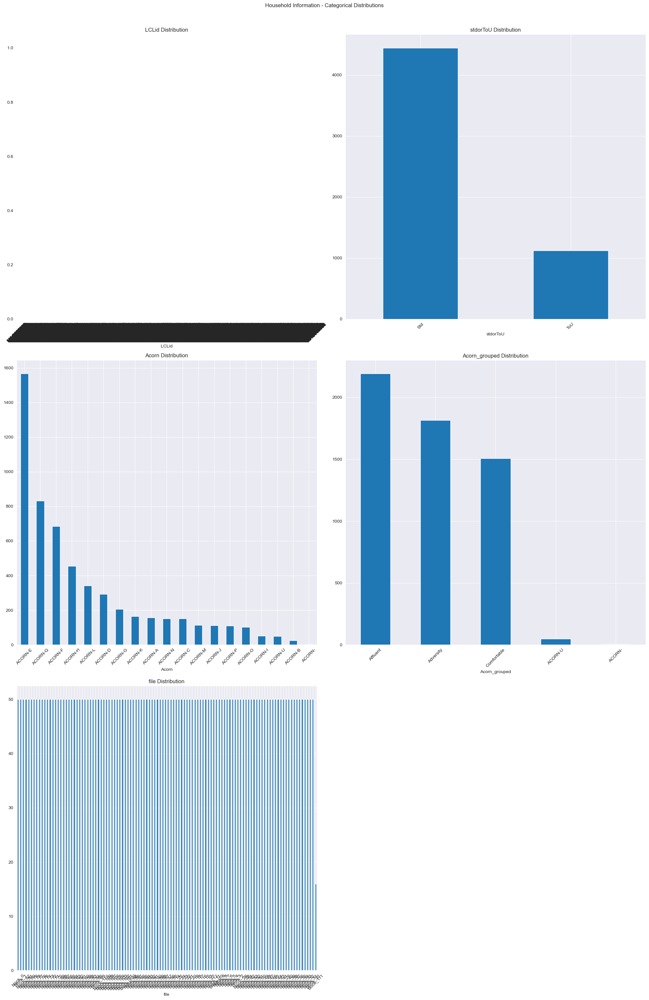


4. Correlation Analysis...
Not enough numerical columns for correlation analysis

5. Outlier Analysis...


In [5]:
analyze_dataset(df_info, "Household Information") 


Analysis for Energy Consumption

1. Missing Values and Duplicates Analysis:

Missing Values:
energy_std    78
dtype: int64

Duplicate rows: 0

2. Statistical Summary:

Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25574 entries, 0 to 25573
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   LCLid          25574 non-null  object        
 1   day            25574 non-null  datetime64[ns]
 2   energy_median  25574 non-null  float64       
 3   energy_mean    25574 non-null  float64       
 4   energy_max     25574 non-null  float64       
 5   energy_count   25574 non-null  int64         
 6   energy_std     25496 non-null  float64       
 7   energy_sum     25574 non-null  float64       
 8   energy_min     25574 non-null  float64       
dtypes: datetime64[ns](1), float64(6), int64(1), object(1)
memory usage: 1.8+ MB
None

Numerical Columns Summary:
                                 d

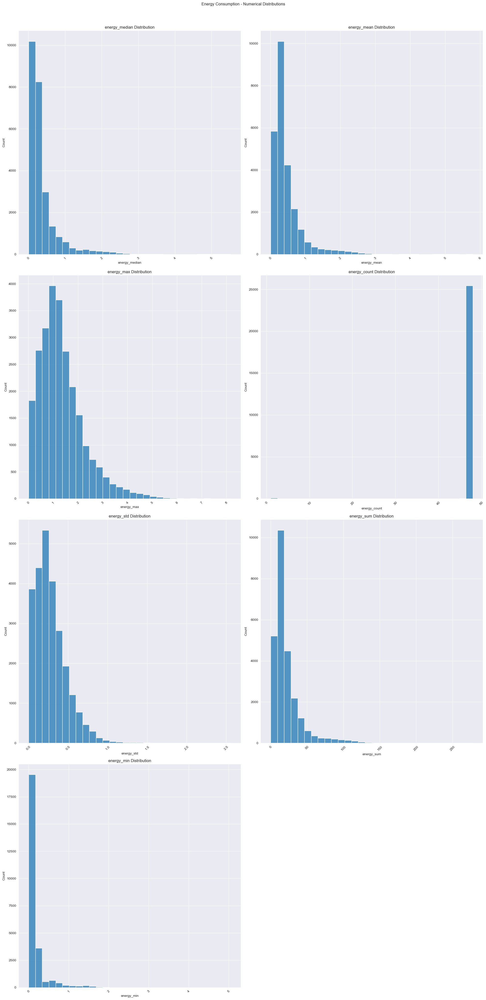

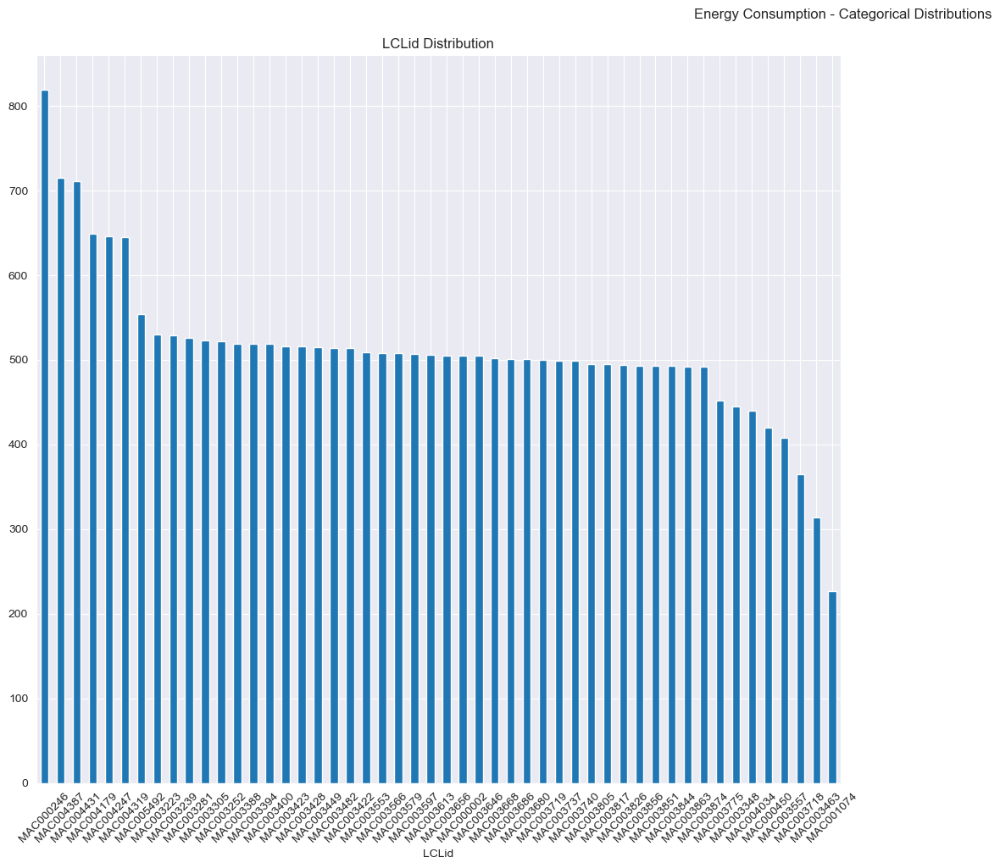


4. Correlation Analysis...


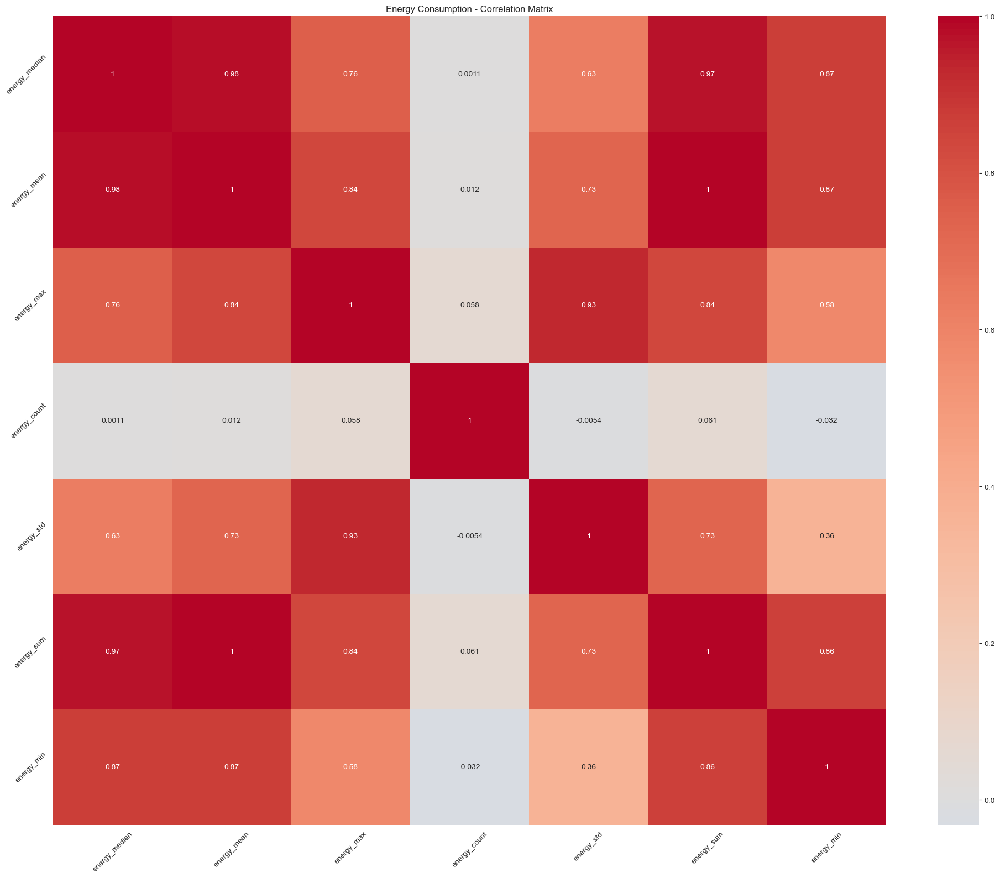


5. Outlier Analysis...

Outliers in energy_median:
Number of outliers: 2506
Percentage of outliers: 9.80%


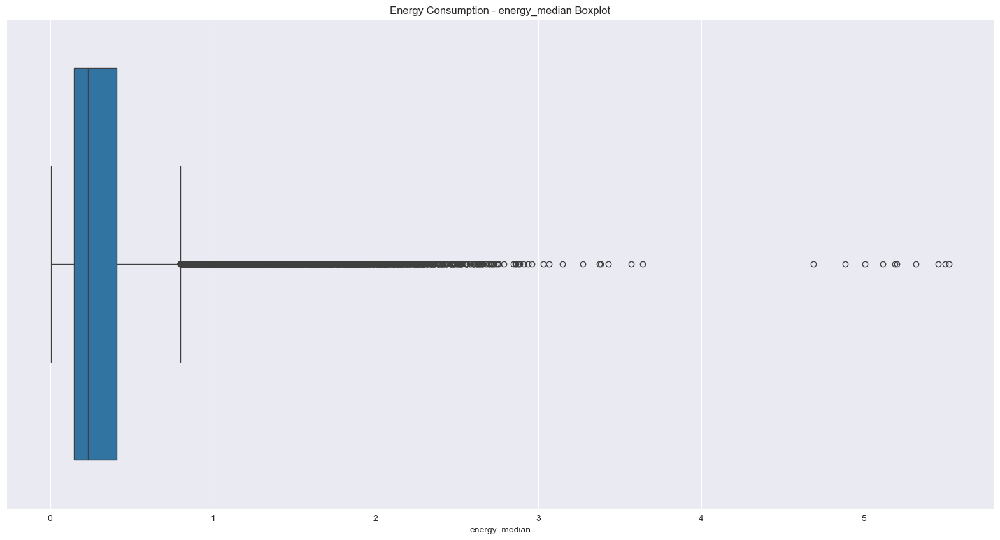


Outliers in energy_mean:
Number of outliers: 1967
Percentage of outliers: 7.69%


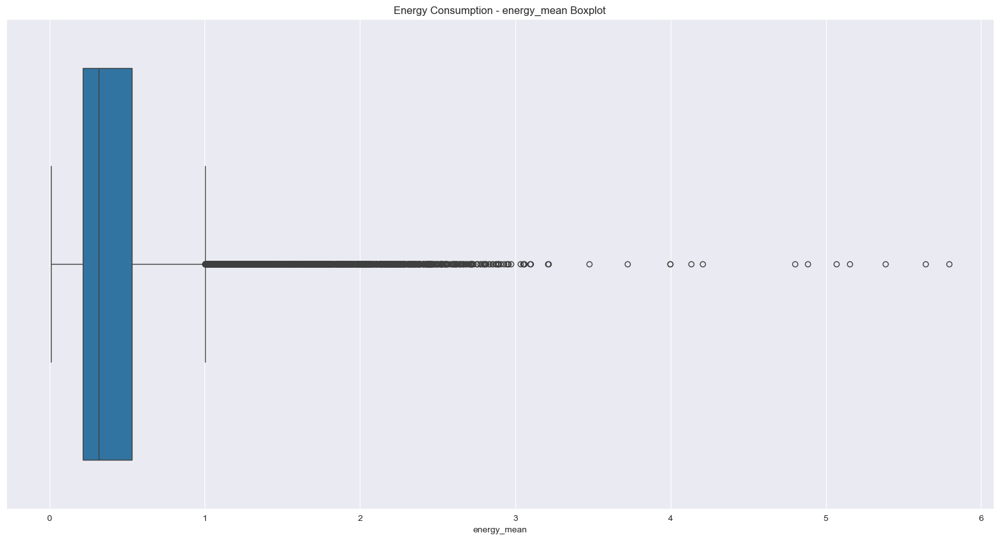


Outliers in energy_max:
Number of outliers: 1017
Percentage of outliers: 3.98%


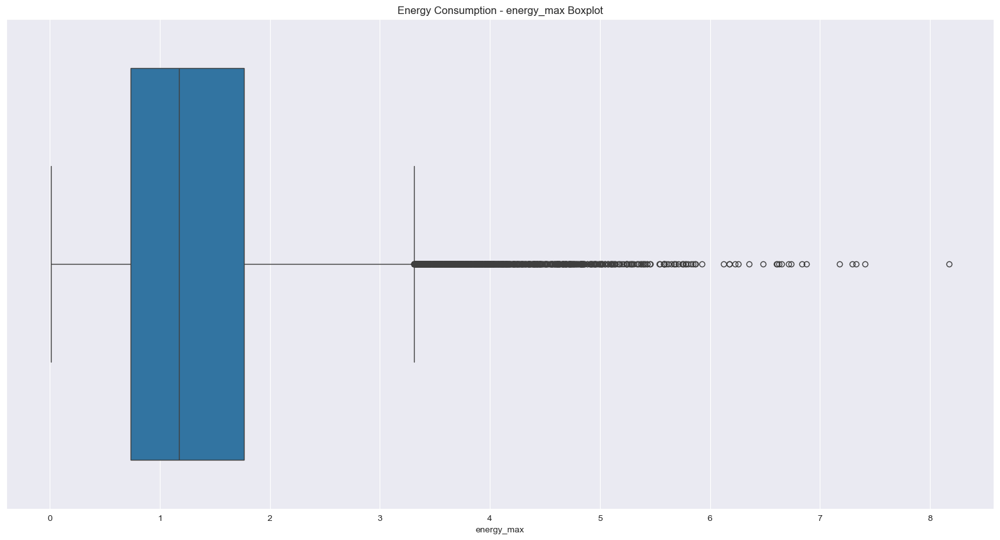


Outliers in energy_count:
Number of outliers: 288
Percentage of outliers: 1.13%


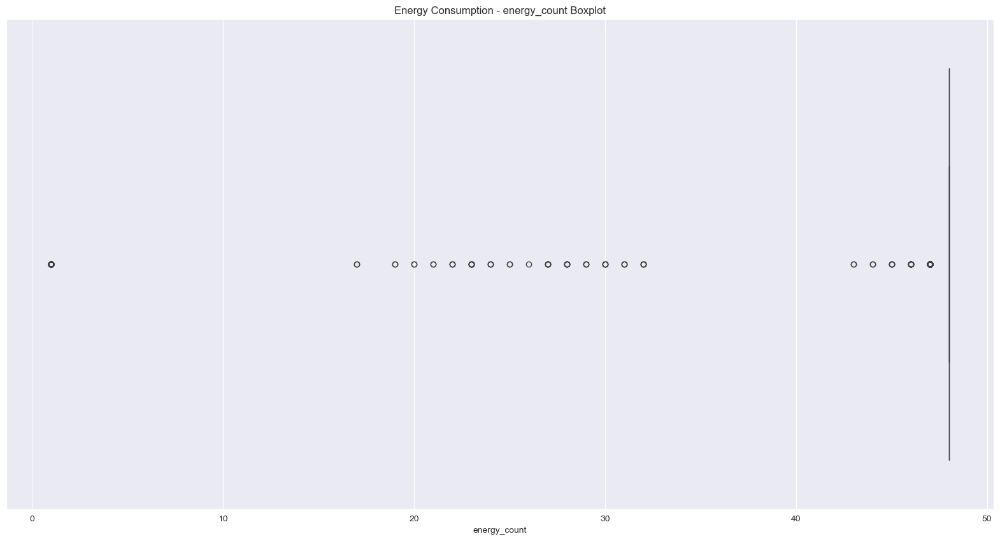


Outliers in energy_std:
Number of outliers: 696
Percentage of outliers: 2.72%


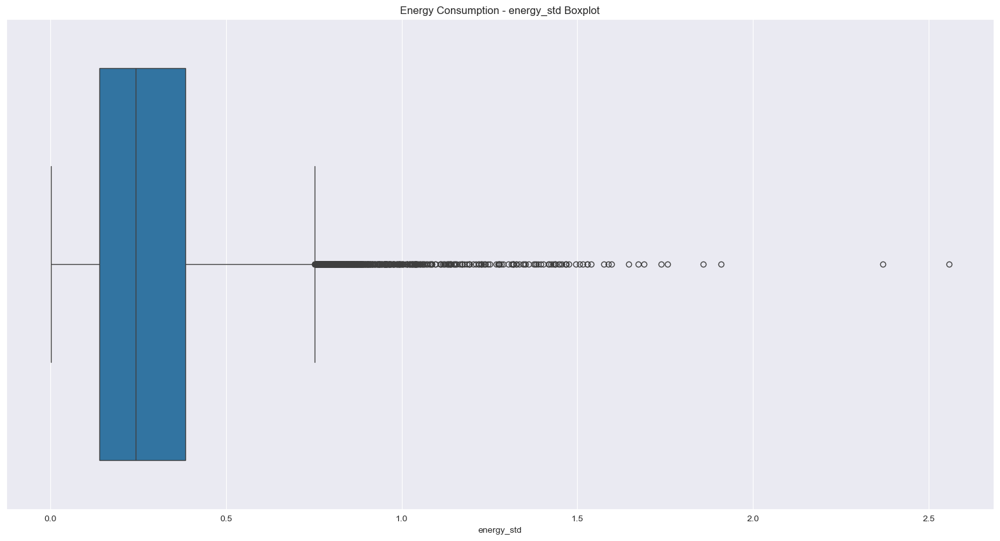


Outliers in energy_sum:
Number of outliers: 1969
Percentage of outliers: 7.70%


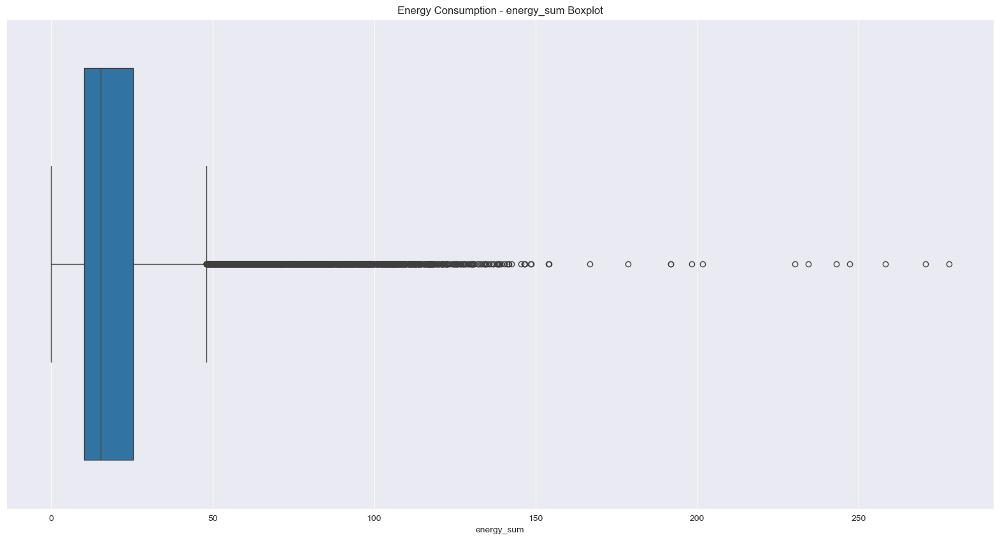


Outliers in energy_min:
Number of outliers: 2573
Percentage of outliers: 10.06%


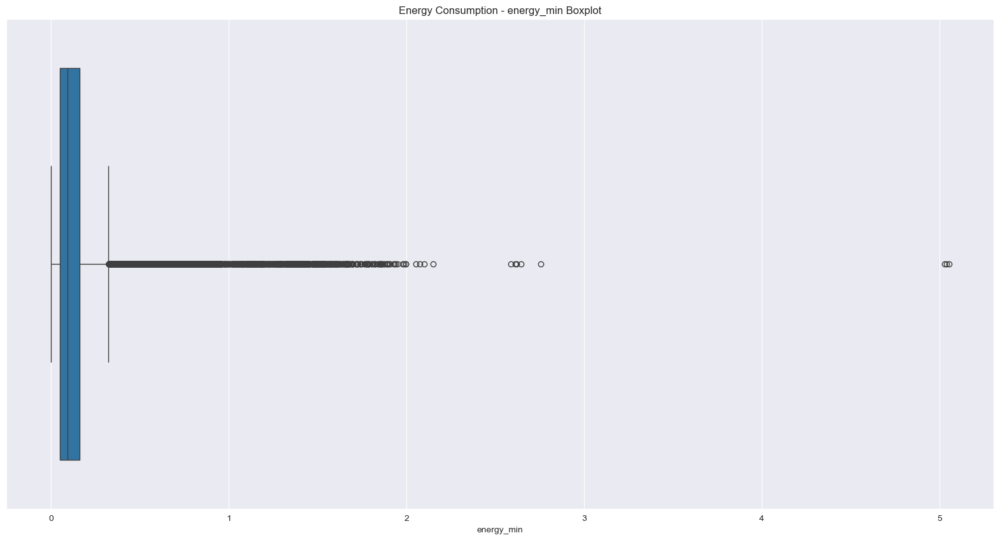

In [6]:
analyze_dataset(df_energy, "Energy Consumption")


Analysis for Weather Data

1. Missing Values and Duplicates Analysis:

Missing Values:
cloudCover     1
uvIndex        1
uvIndexTime    1
dtype: int64

Duplicate rows: 0

2. Statistical Summary:

Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 882 entries, 0 to 881
Data columns (total 32 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   temperatureMax               882 non-null    float64
 1   temperatureMaxTime           882 non-null    object 
 2   windBearing                  882 non-null    int64  
 3   icon                         882 non-null    object 
 4   dewPoint                     882 non-null    float64
 5   temperatureMinTime           882 non-null    object 
 6   cloudCover                   881 non-null    float64
 7   windSpeed                    882 non-null    float64
 8   pressure                     882 non-null    float64
 9   apparentTemperatureMinTime   882 non-null

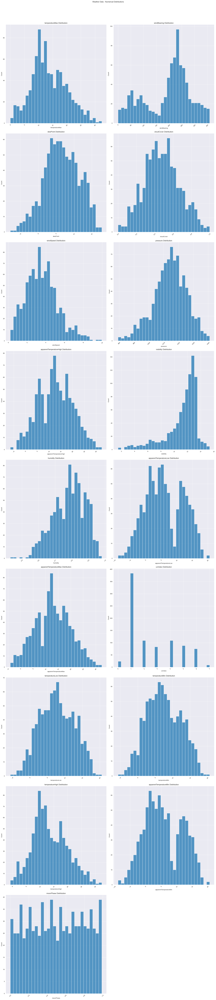

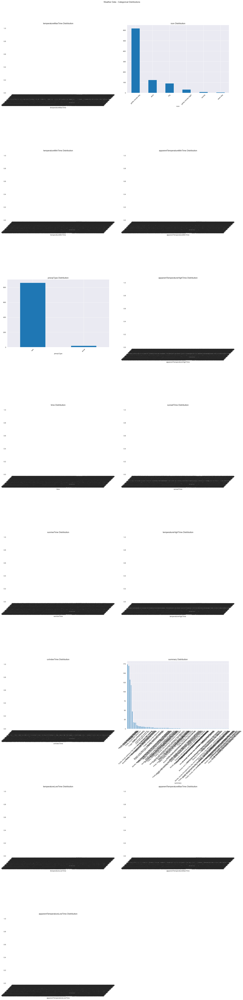


4. Correlation Analysis...


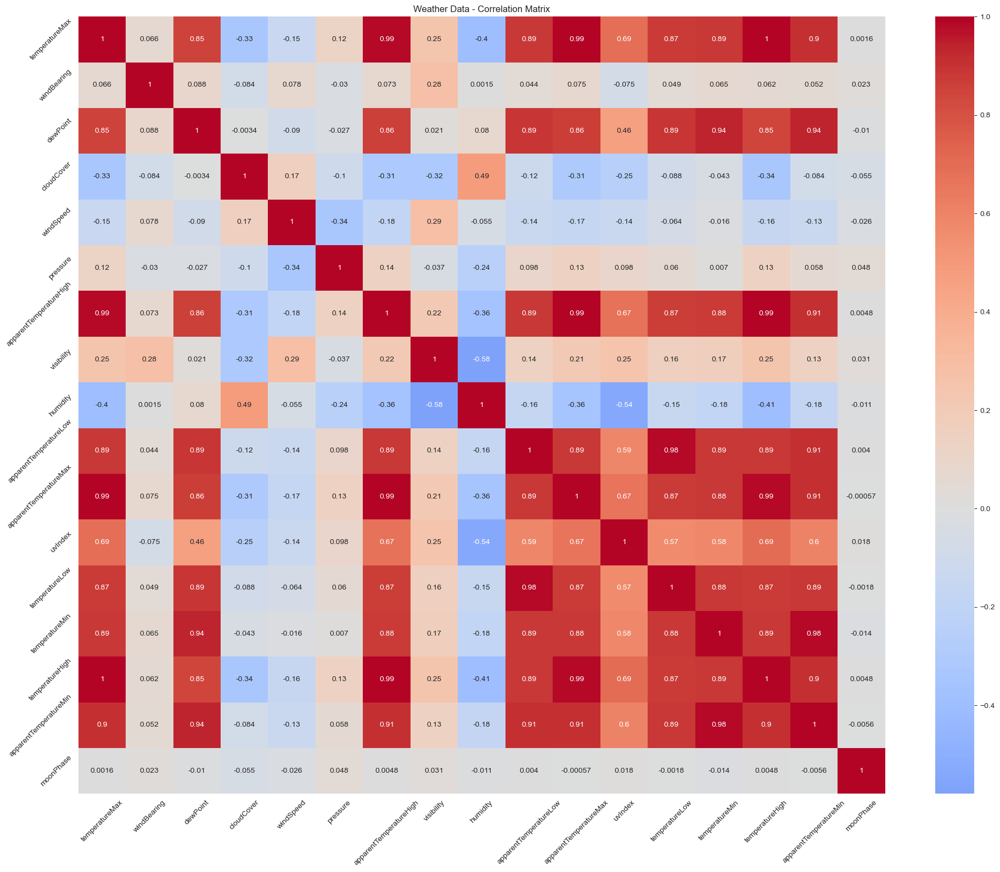


5. Outlier Analysis...

Outliers in temperatureMax:
Number of outliers: 2
Percentage of outliers: 0.23%


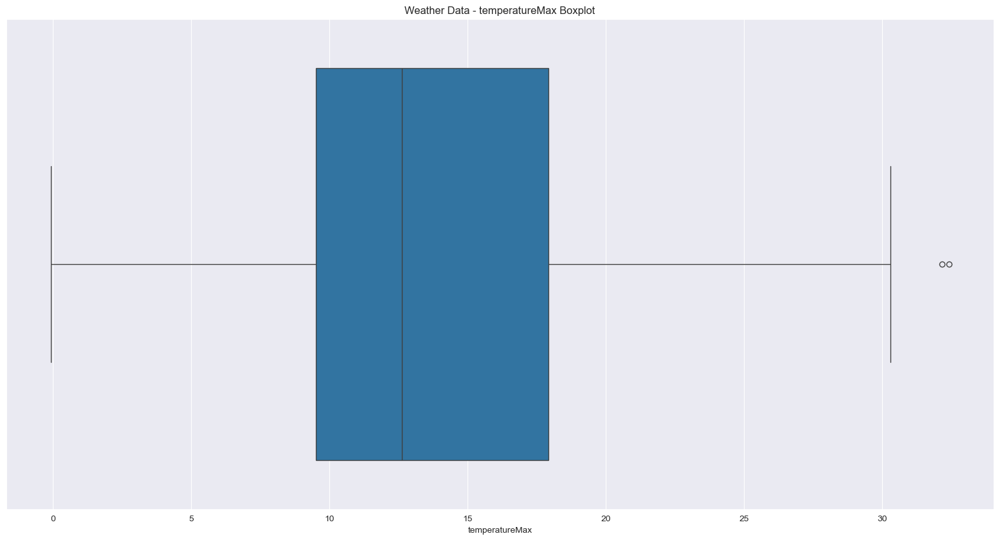


Outliers in windBearing:
Number of outliers: 0
Percentage of outliers: 0.00%


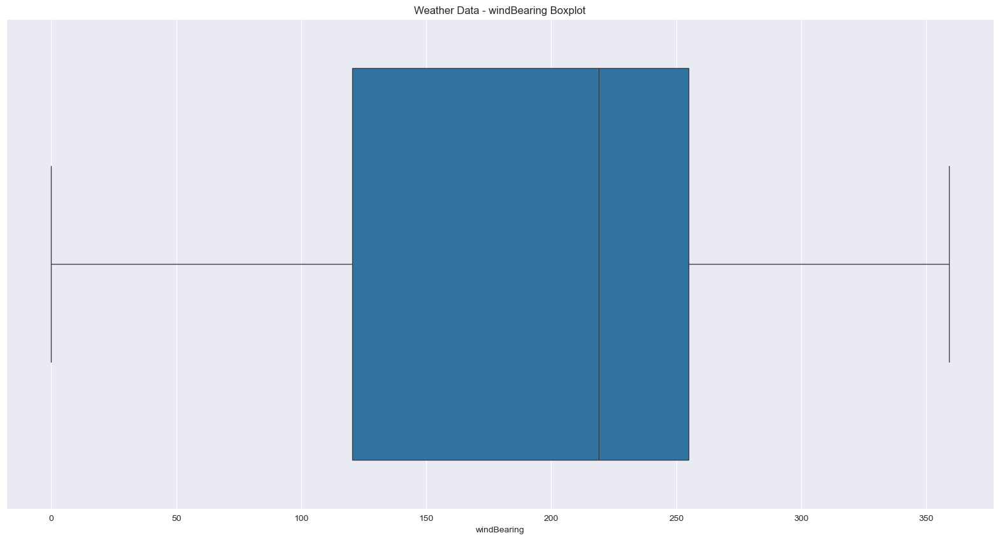


Outliers in dewPoint:
Number of outliers: 1
Percentage of outliers: 0.11%


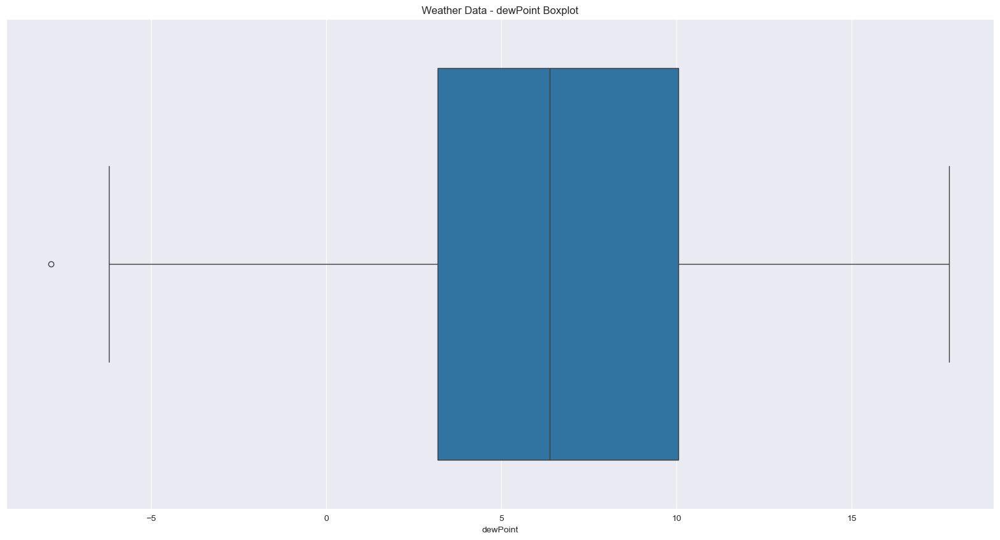


Outliers in cloudCover:
Number of outliers: 3
Percentage of outliers: 0.34%


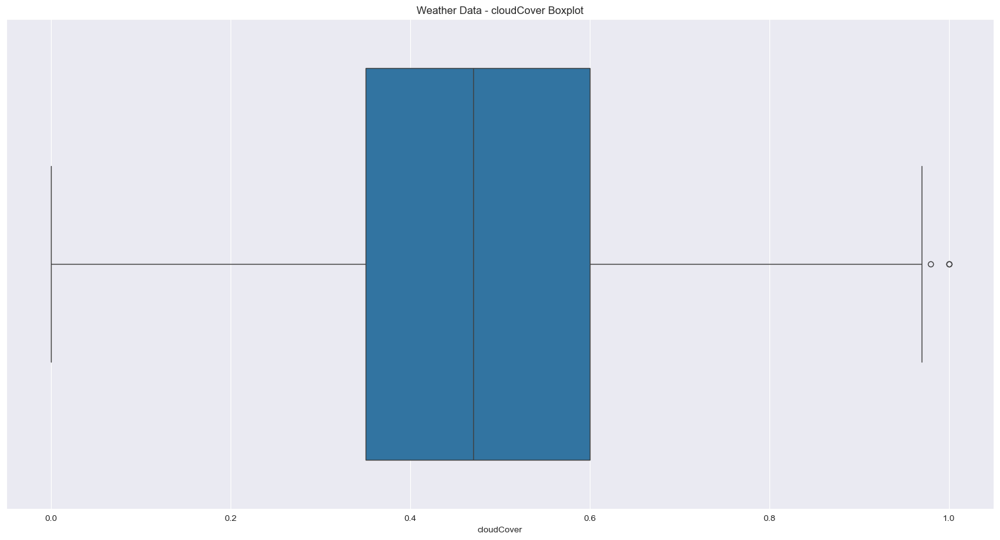


Outliers in windSpeed:
Number of outliers: 14
Percentage of outliers: 1.59%


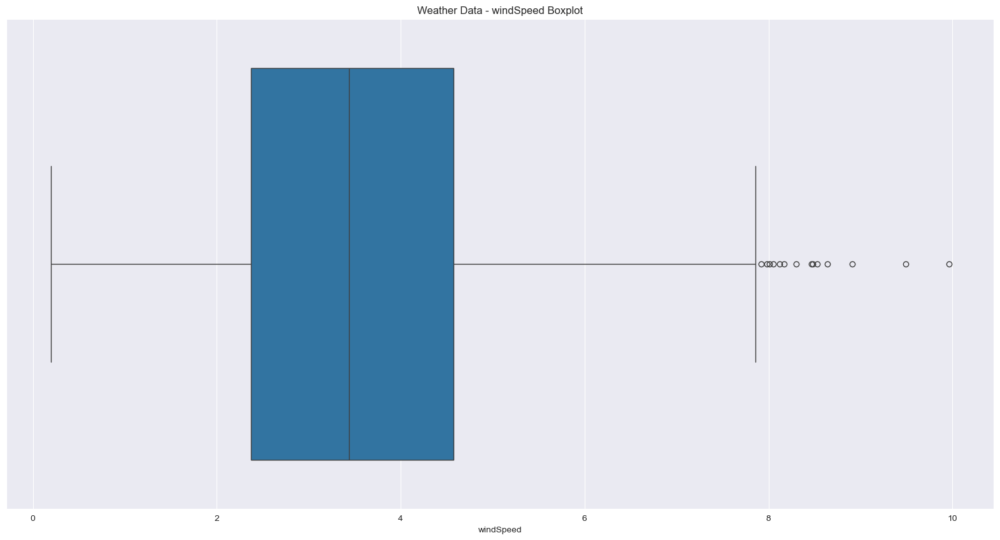


Outliers in pressure:
Number of outliers: 11
Percentage of outliers: 1.25%


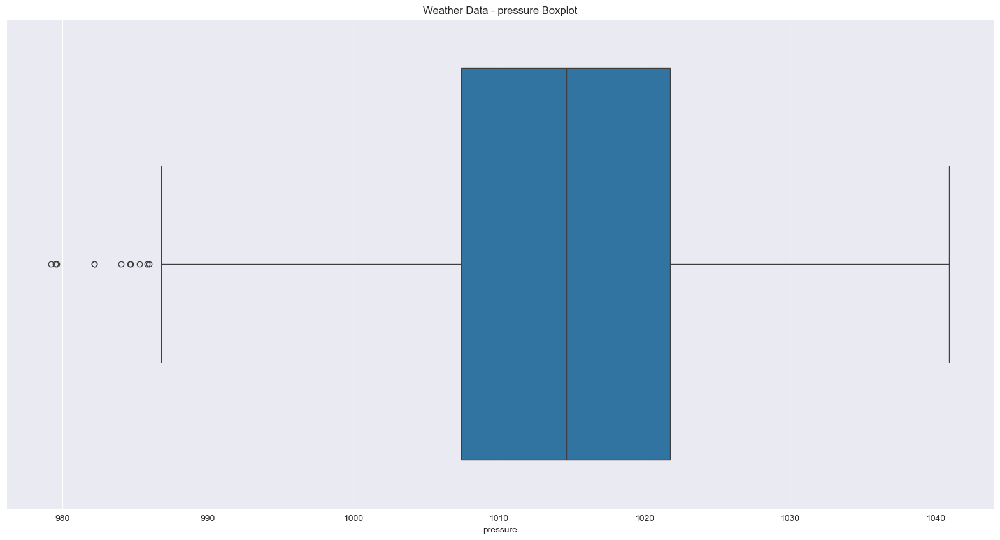


Outliers in apparentTemperatureHigh:
Number of outliers: 0
Percentage of outliers: 0.00%


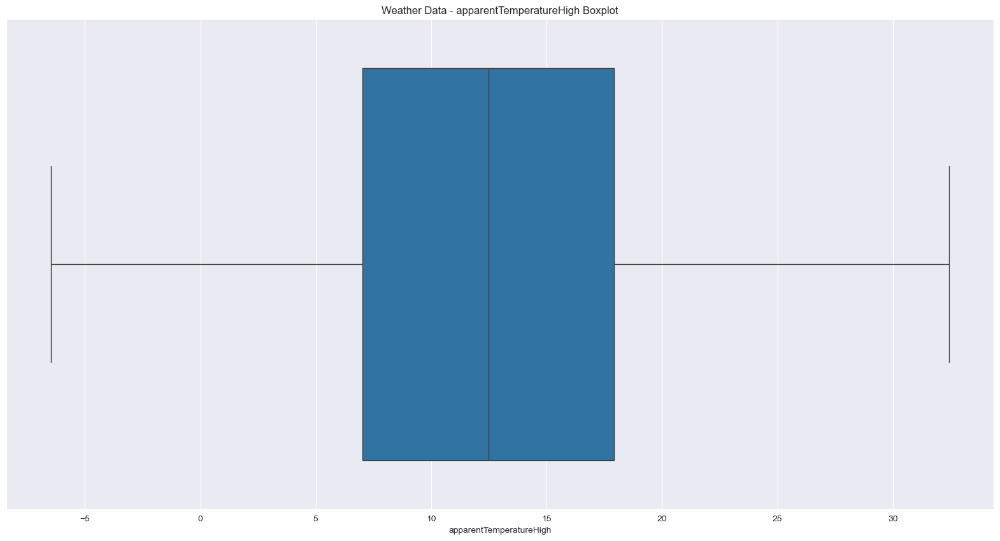


Outliers in visibility:
Number of outliers: 67
Percentage of outliers: 7.60%


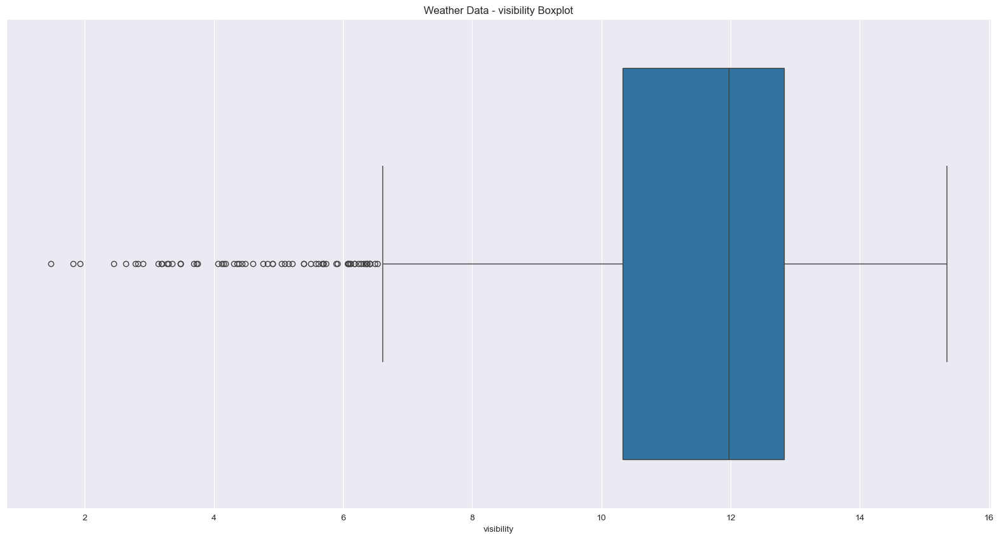


Outliers in humidity:
Number of outliers: 3
Percentage of outliers: 0.34%


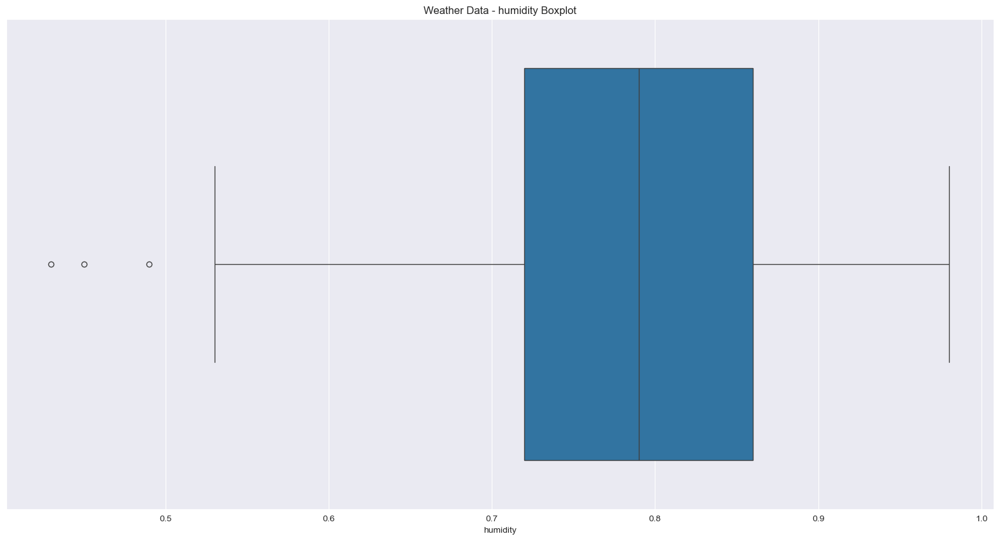


Outliers in apparentTemperatureLow:
Number of outliers: 0
Percentage of outliers: 0.00%


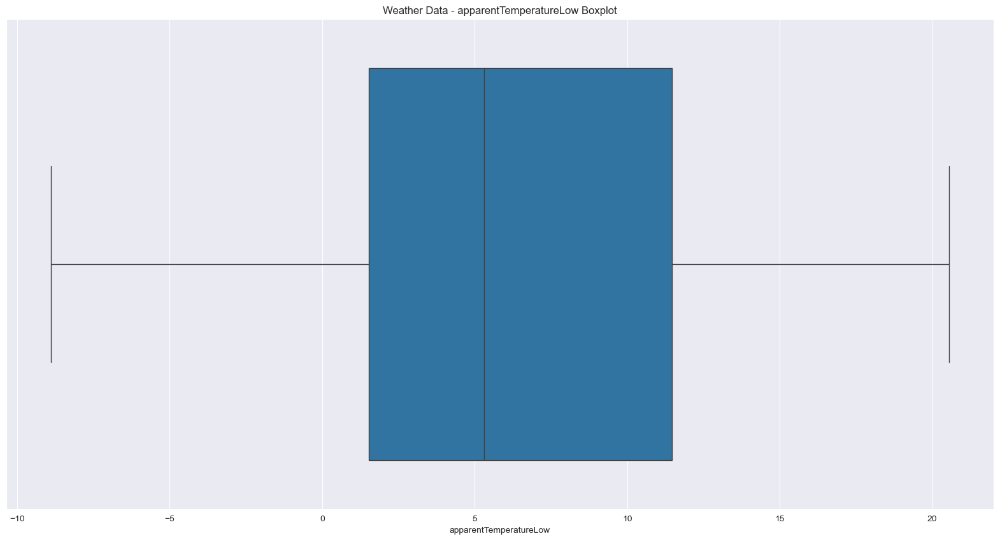


Outliers in apparentTemperatureMax:
Number of outliers: 0
Percentage of outliers: 0.00%


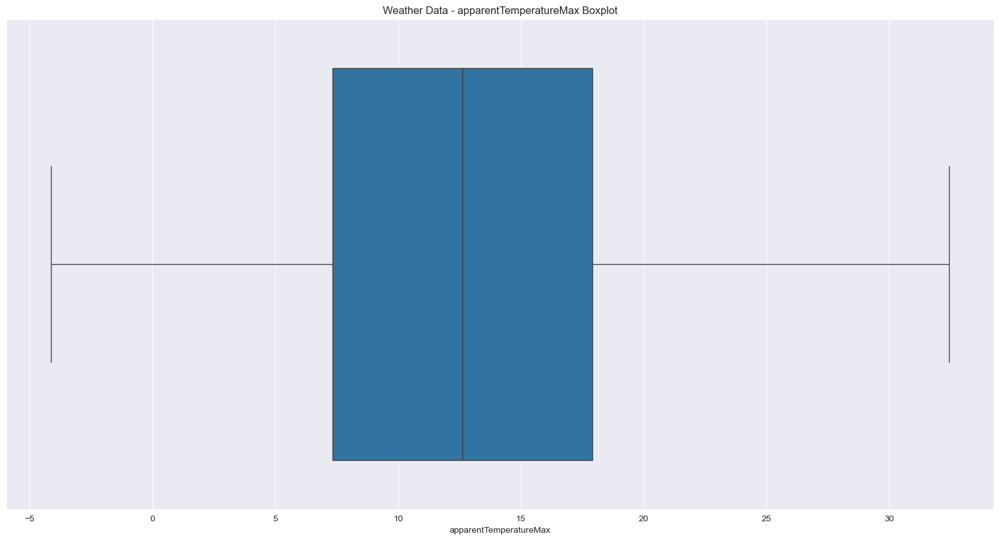


Outliers in uvIndex:
Number of outliers: 0
Percentage of outliers: 0.00%


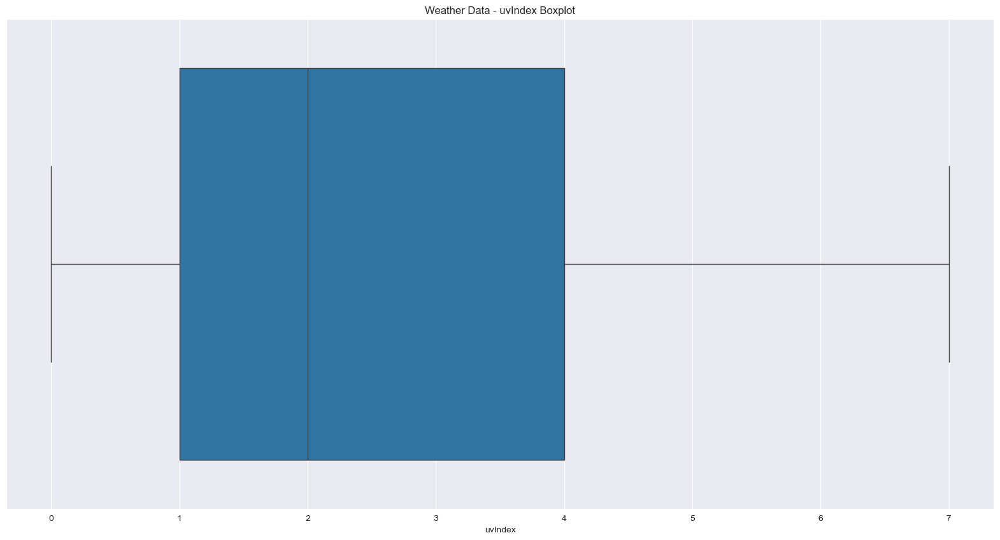


Outliers in temperatureLow:
Number of outliers: 0
Percentage of outliers: 0.00%


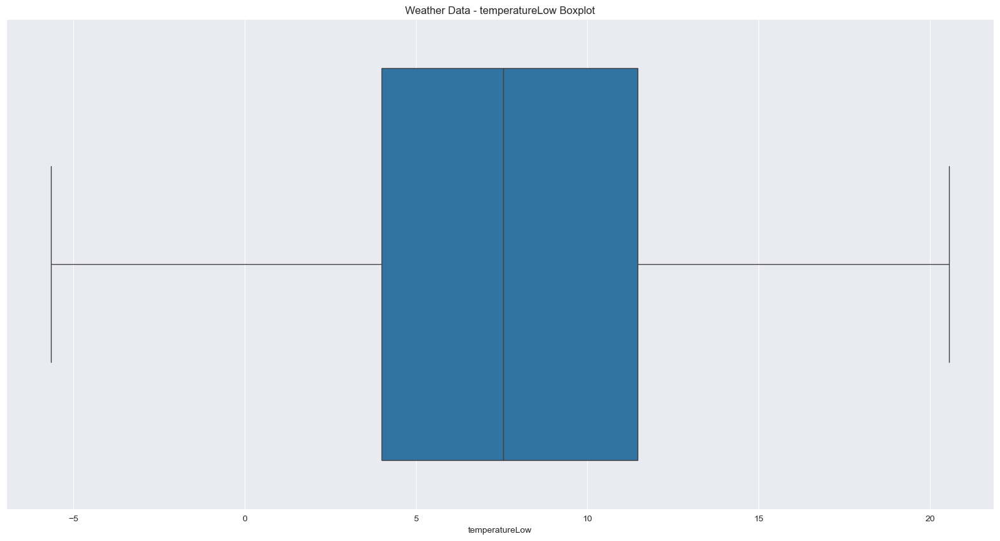


Outliers in temperatureMin:
Number of outliers: 0
Percentage of outliers: 0.00%


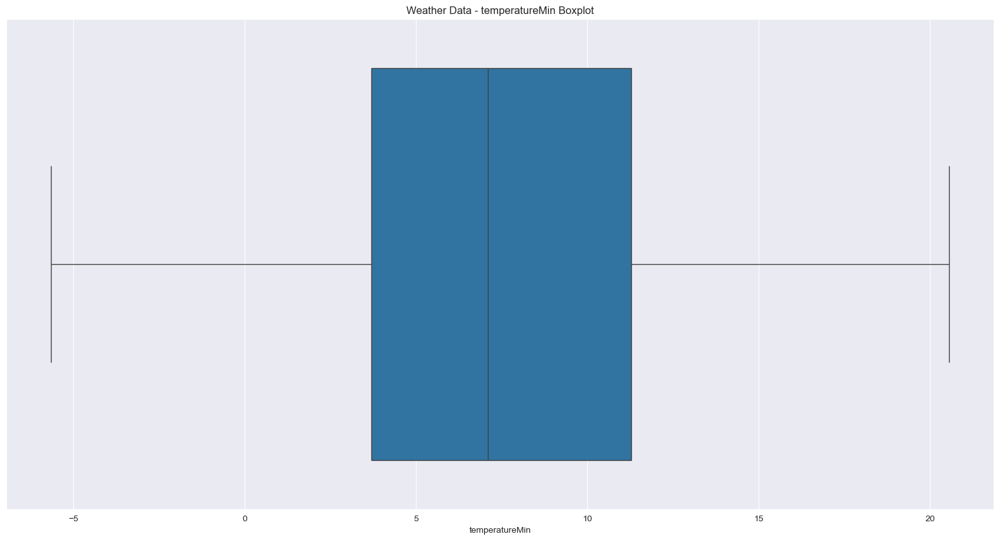


Outliers in temperatureHigh:
Number of outliers: 2
Percentage of outliers: 0.23%


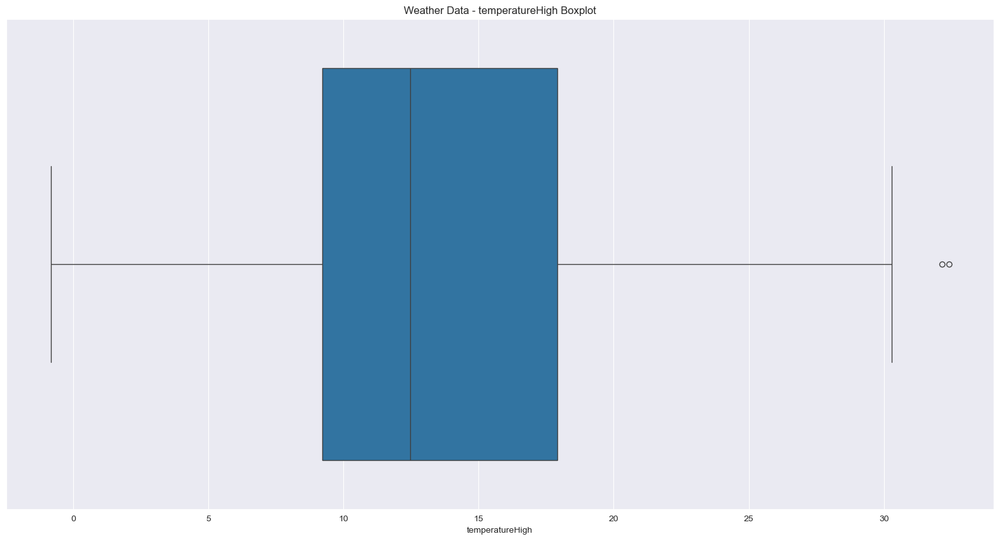


Outliers in apparentTemperatureMin:
Number of outliers: 0
Percentage of outliers: 0.00%


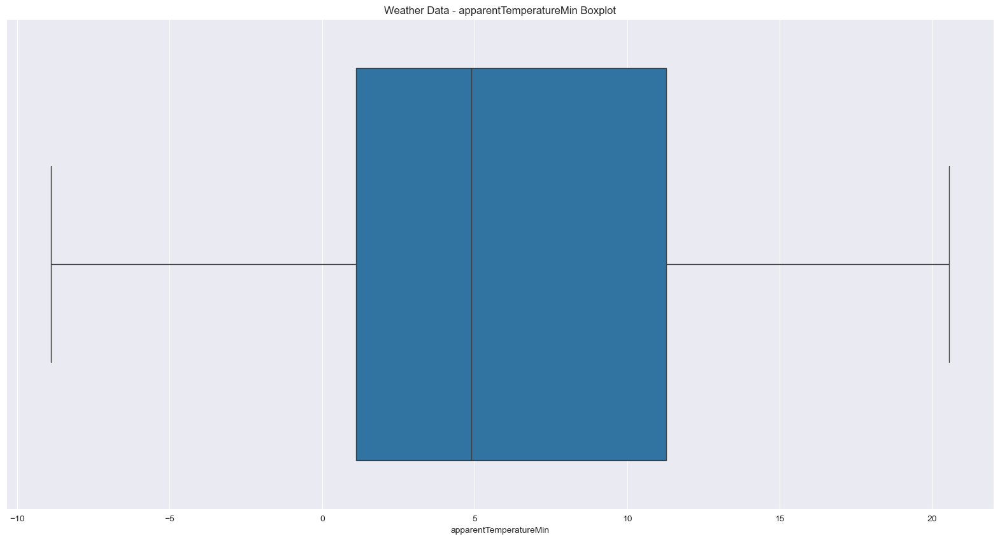


Outliers in moonPhase:
Number of outliers: 0
Percentage of outliers: 0.00%


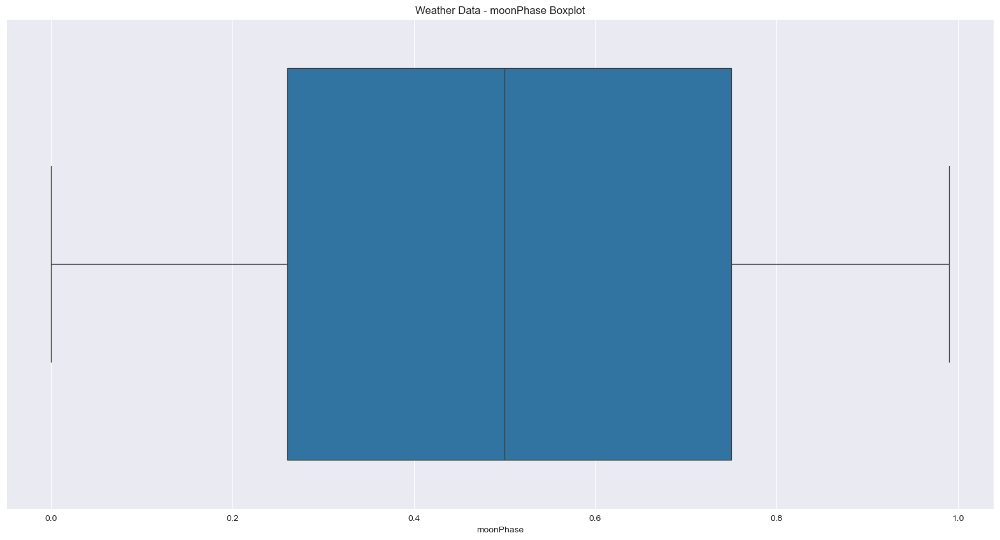

In [7]:
analyze_dataset(df_weather, "Weather Data")


Analysis for Acron details

1. Missing Values and Duplicates Analysis:

Missing Values:
REFERENCE    1
dtype: int64

Duplicate rows: 0

2. Statistical Summary:

Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 826 entries, 0 to 825
Data columns (total 20 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   MAIN CATEGORIES  826 non-null    object 
 1   CATEGORIES       826 non-null    object 
 2   REFERENCE        825 non-null    object 
 3   ACORN-A          826 non-null    float64
 4   ACORN-B          826 non-null    float64
 5   ACORN-C          826 non-null    float64
 6   ACORN-D          826 non-null    float64
 7   ACORN-E          826 non-null    float64
 8   ACORN-F          826 non-null    float64
 9   ACORN-G          826 non-null    float64
 10  ACORN-H          826 non-null    float64
 11  ACORN-I          826 non-null    float64
 12  ACORN-J          826 non-null    float64
 13  ACORN-K          826 non

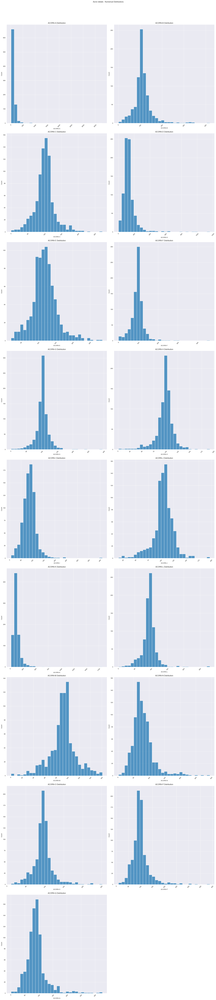

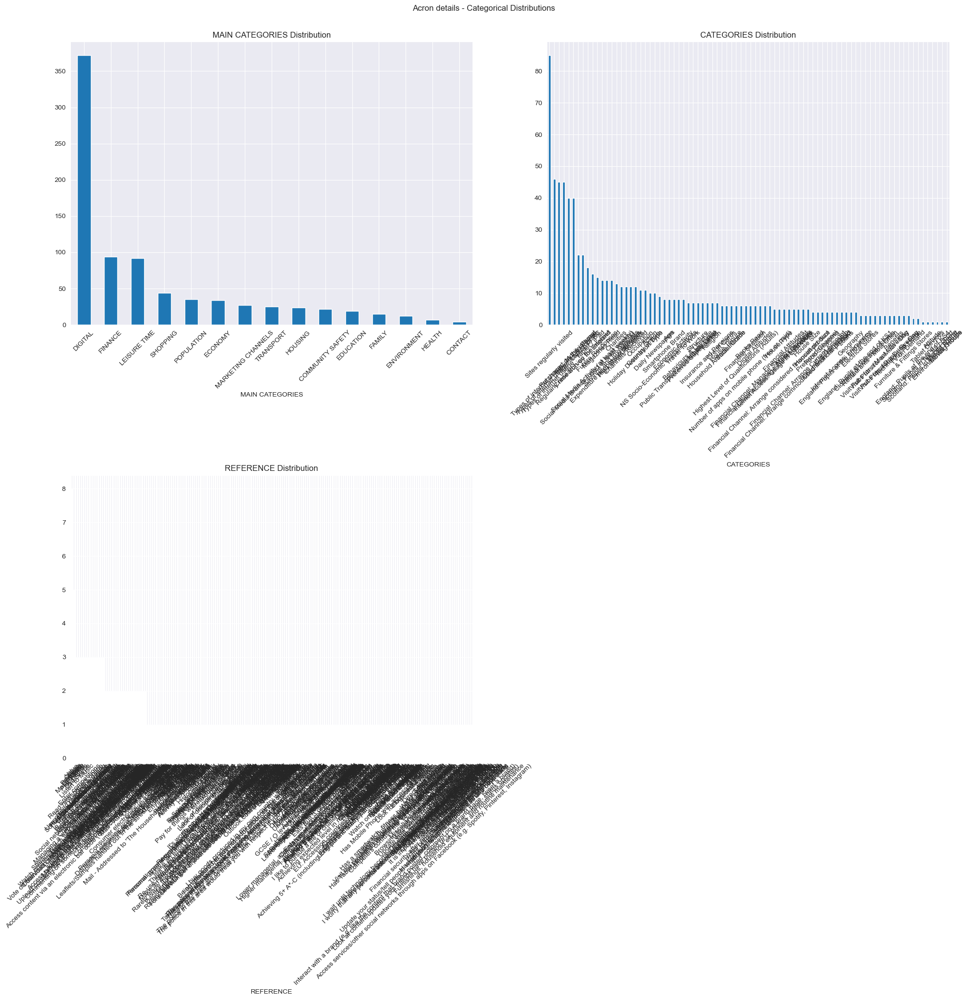


4. Correlation Analysis...


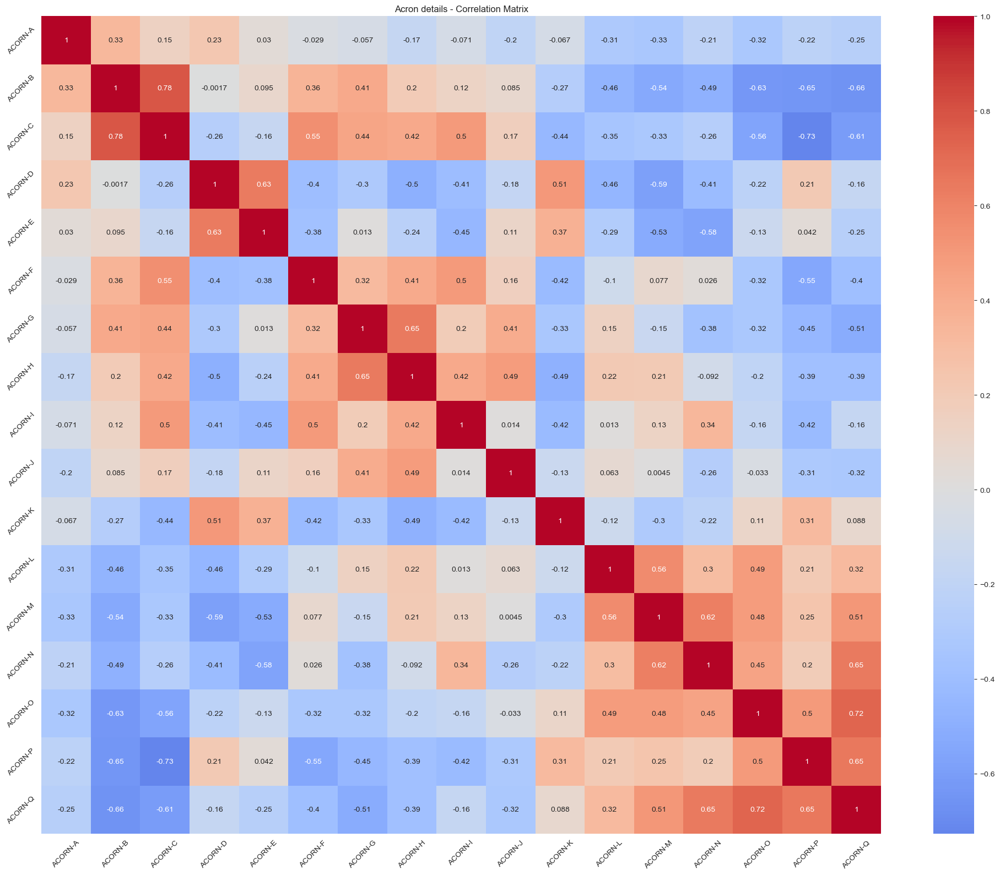


5. Outlier Analysis...

Outliers in ACORN-A:
Number of outliers: 80
Percentage of outliers: 9.69%


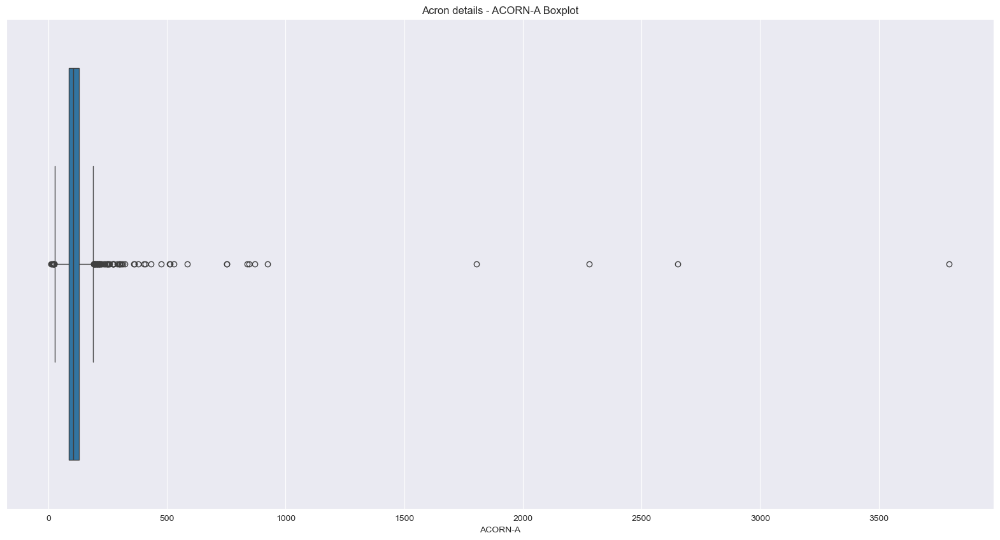


Outliers in ACORN-B:
Number of outliers: 97
Percentage of outliers: 11.74%


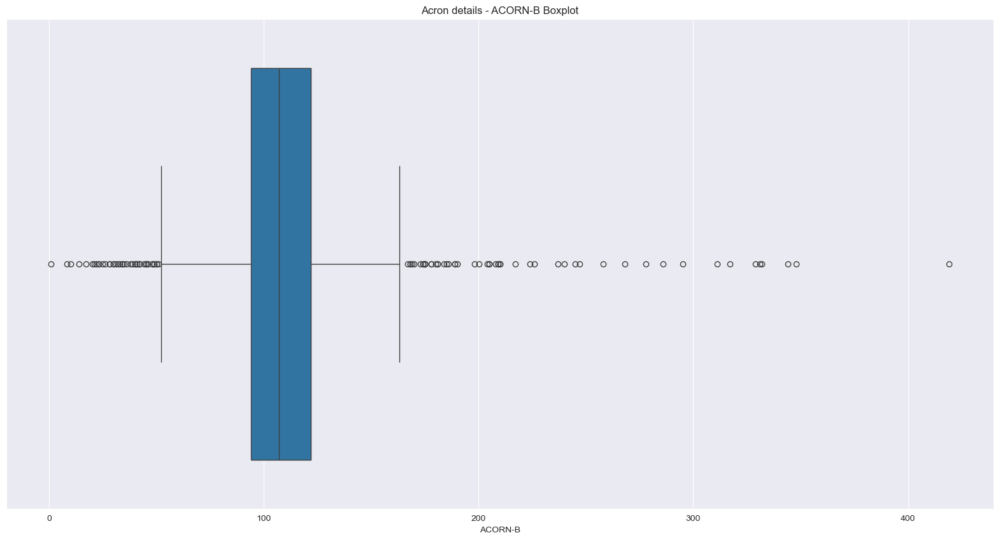


Outliers in ACORN-C:
Number of outliers: 72
Percentage of outliers: 8.72%


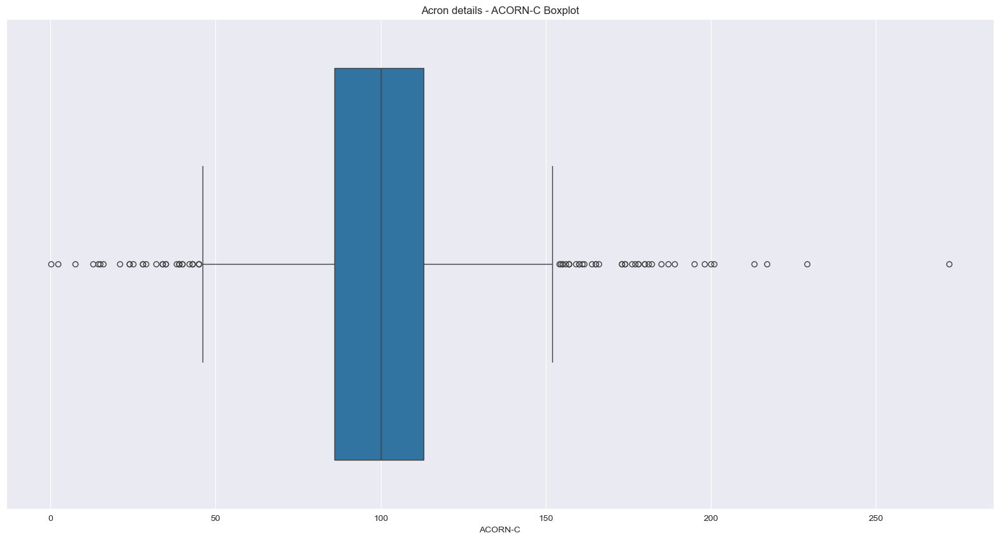


Outliers in ACORN-D:
Number of outliers: 50
Percentage of outliers: 6.05%


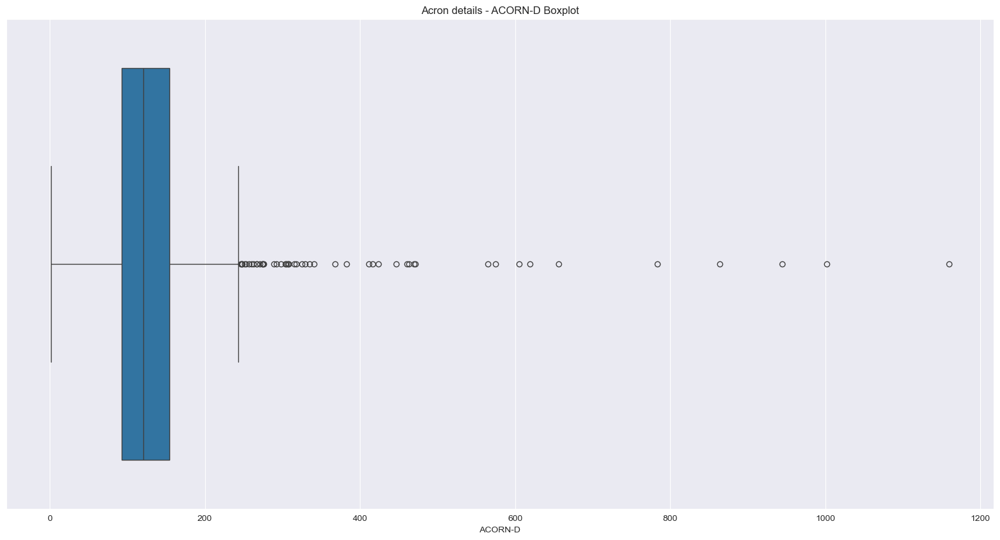


Outliers in ACORN-E:
Number of outliers: 50
Percentage of outliers: 6.05%


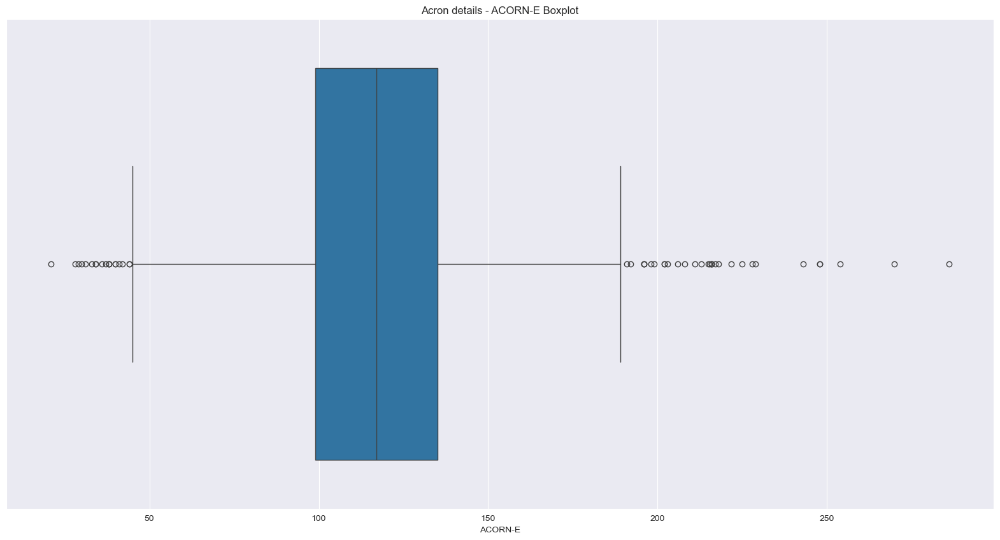


Outliers in ACORN-F:
Number of outliers: 67
Percentage of outliers: 8.11%


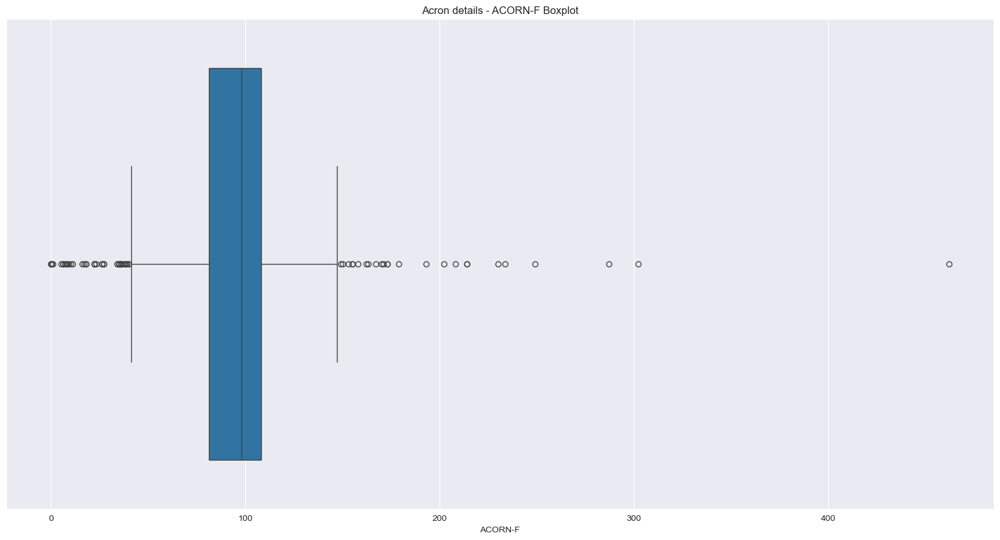


Outliers in ACORN-G:
Number of outliers: 95
Percentage of outliers: 11.50%


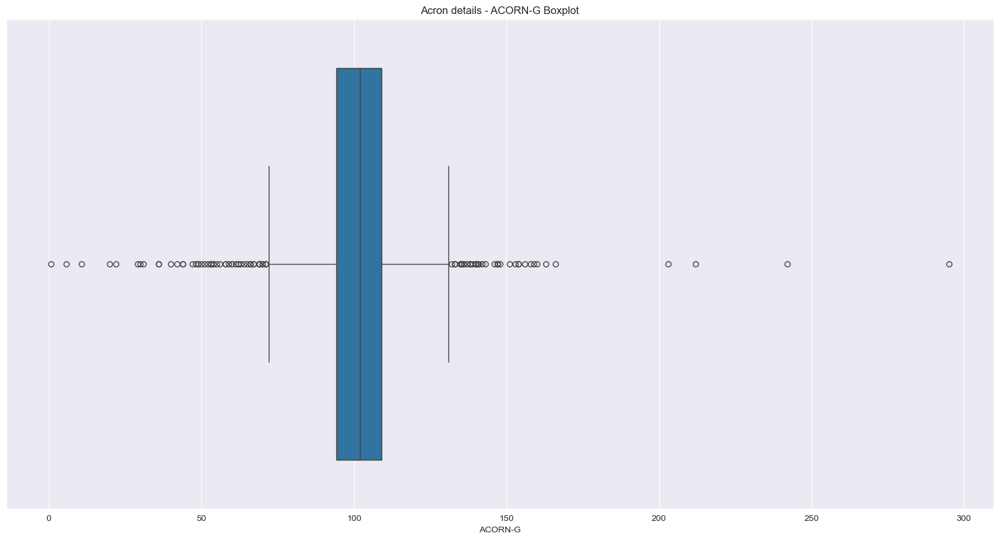


Outliers in ACORN-H:
Number of outliers: 77
Percentage of outliers: 9.32%


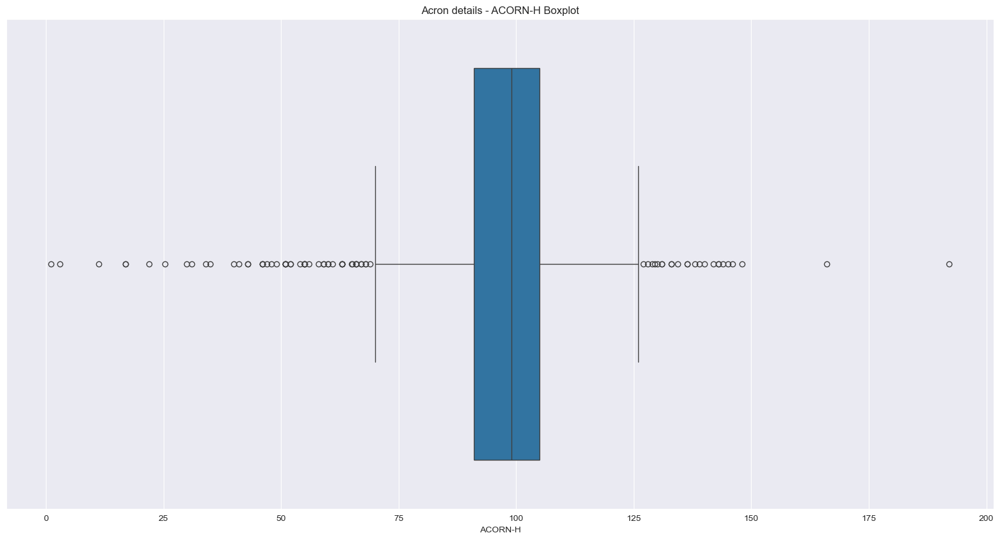


Outliers in ACORN-I:
Number of outliers: 29
Percentage of outliers: 3.51%


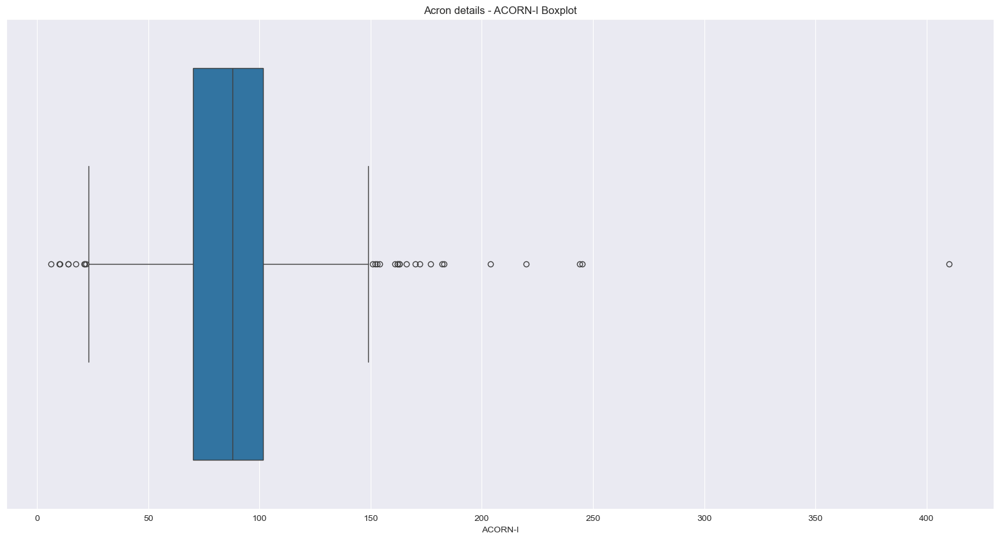


Outliers in ACORN-J:
Number of outliers: 65
Percentage of outliers: 7.87%


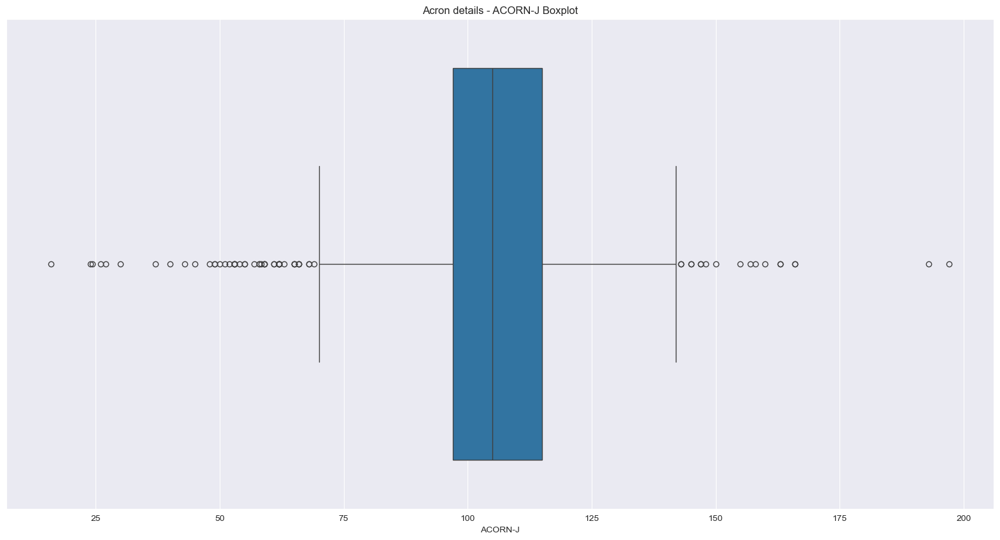


Outliers in ACORN-K:
Number of outliers: 52
Percentage of outliers: 6.30%


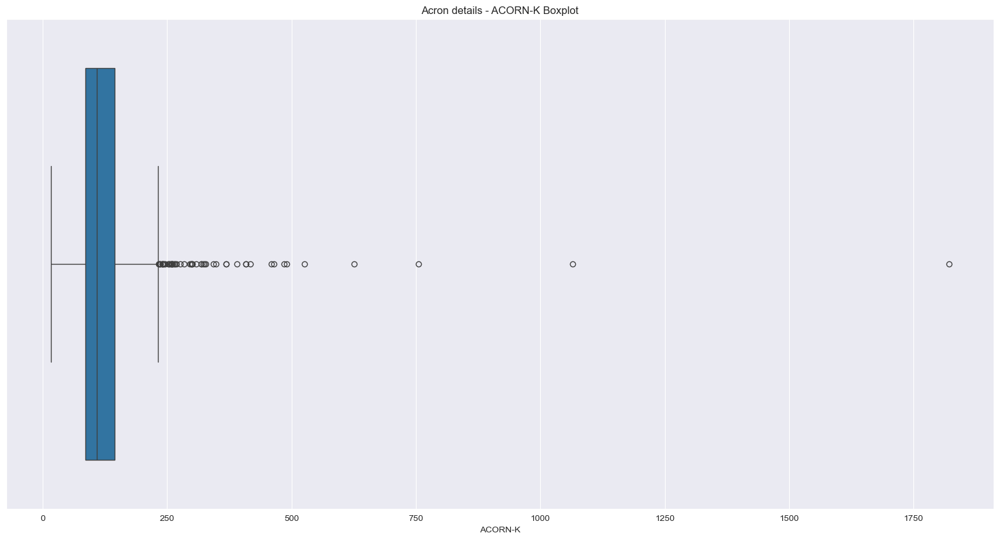


Outliers in ACORN-L:
Number of outliers: 85
Percentage of outliers: 10.29%


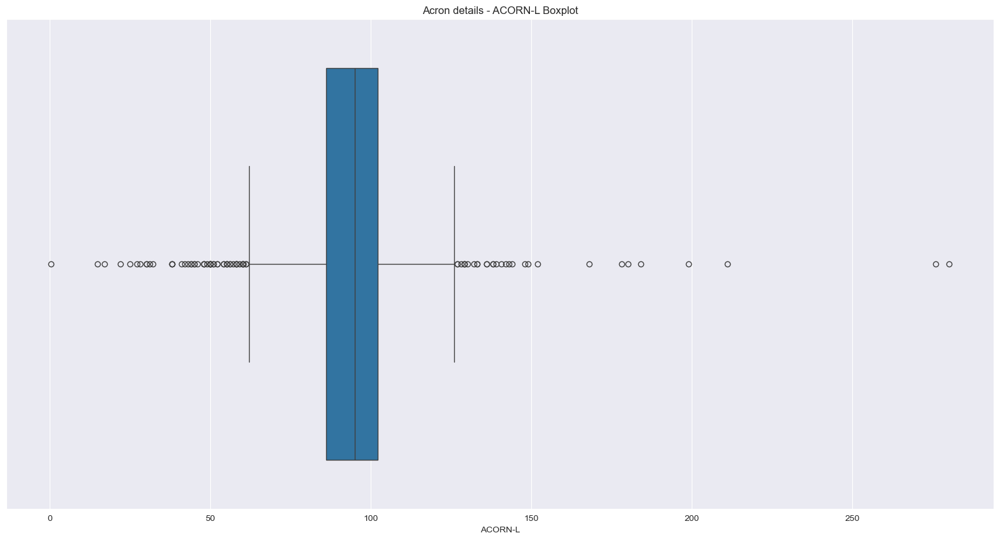


Outliers in ACORN-M:
Number of outliers: 99
Percentage of outliers: 11.99%


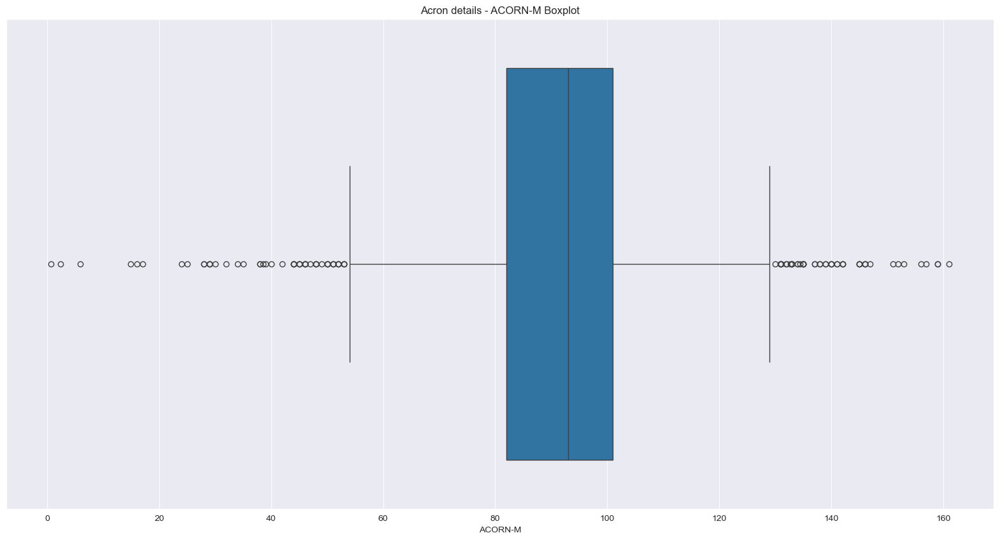


Outliers in ACORN-N:
Number of outliers: 40
Percentage of outliers: 4.84%


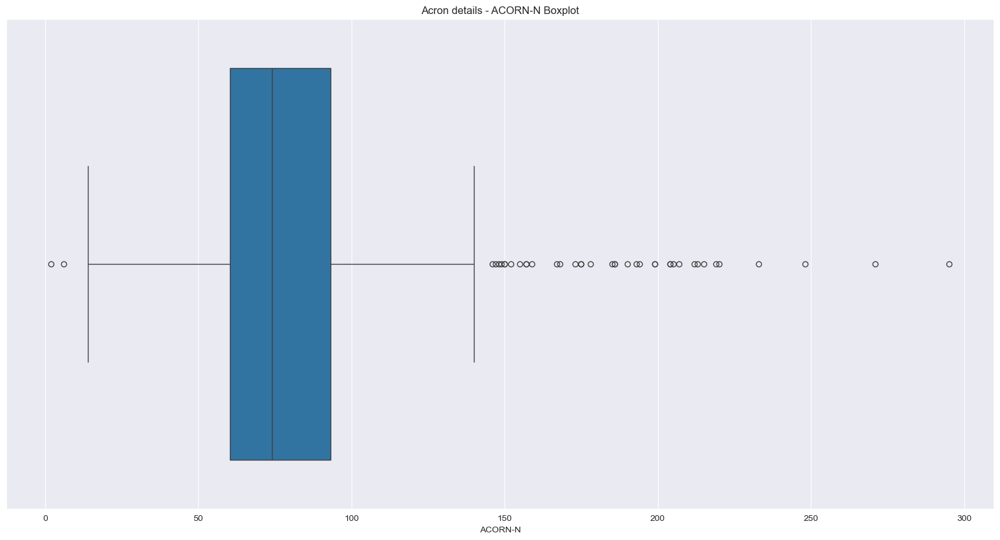


Outliers in ACORN-O:
Number of outliers: 105
Percentage of outliers: 12.71%


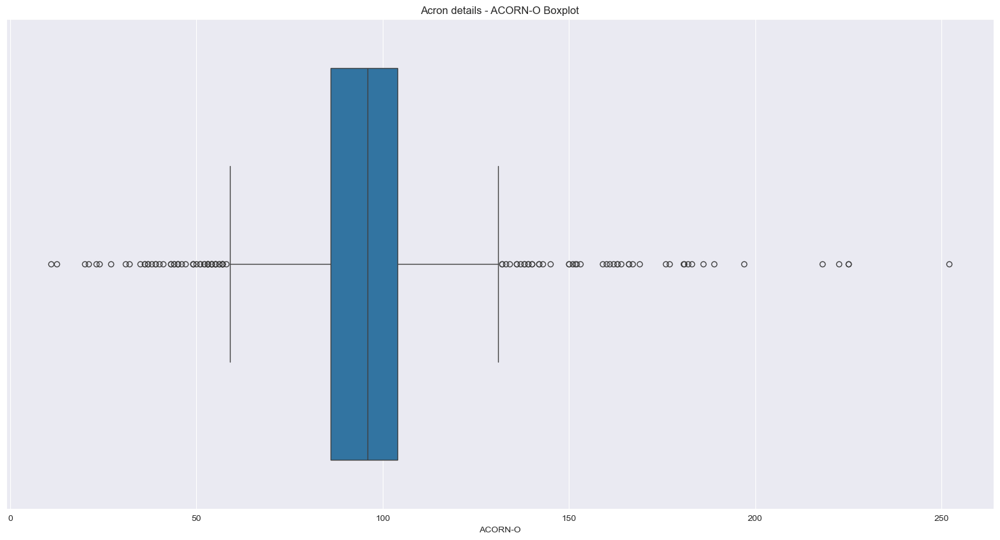


Outliers in ACORN-P:
Number of outliers: 83
Percentage of outliers: 10.05%


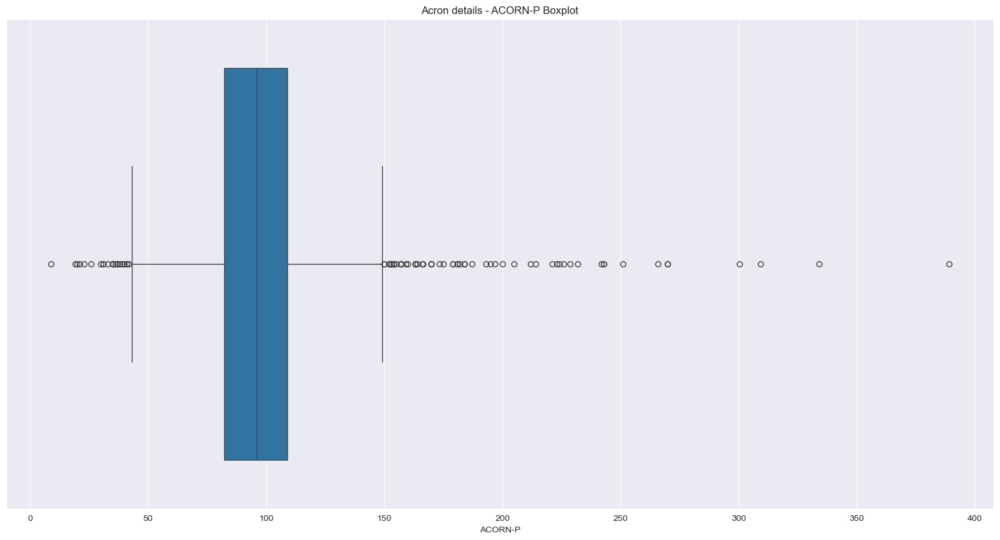


Outliers in ACORN-Q:
Number of outliers: 65
Percentage of outliers: 7.87%


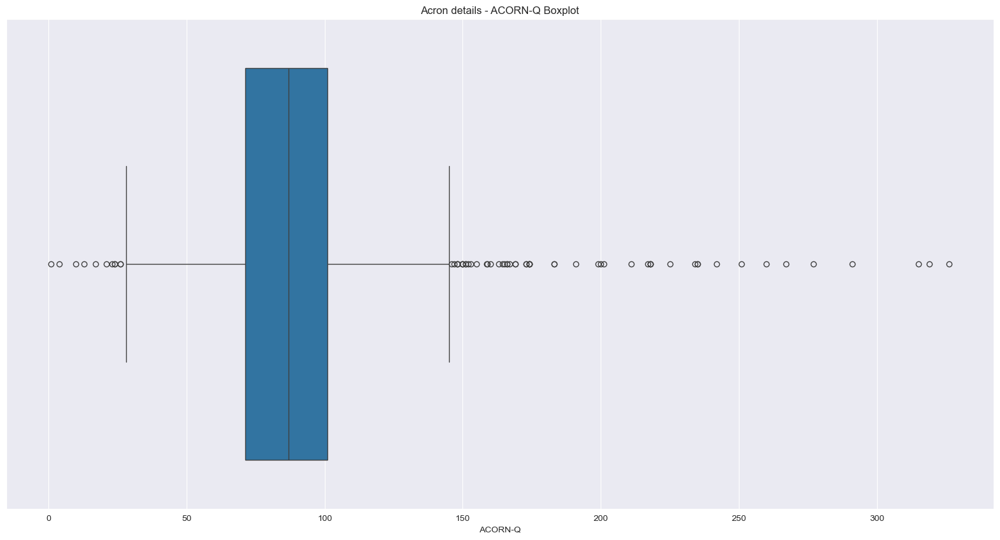

In [8]:
df_acron = pd.read_csv('C:/Users/XzfhX/.cache/kagglehub/datasets/jeanmidev/smart-meters-in-london/versions/21/acorn_details.csv',encoding='cp1252') 
analyze_dataset(df_acron, "Acron details") 


Analysis for Acron details

1. Missing Values and Duplicates Analysis:

Missing Values:
Series([], dtype: int64)

Duplicate rows: 0

2. Statistical Summary:

Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25 entries, 0 to 24
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Bank holidays  25 non-null     object
 1   Type           25 non-null     object
dtypes: object(2)
memory usage: 532.0+ bytes
None

Numerical Columns Summary:
       Bank holidays        Type
count             25          25
unique            25          11
top       2012-12-26  Boxing Day
freq               1           3

Categorical Columns Summary:

Bank holidays value counts:
Bank holidays
2012-12-26    1
2013-06-05    1
2014-04-18    1
2014-04-21    1
2014-05-05    1
Name: count, dtype: int64

Type value counts:
Type
Boxing Day                3
Christmas Day             3
Summer bank holiday       3
Early May bank holiday

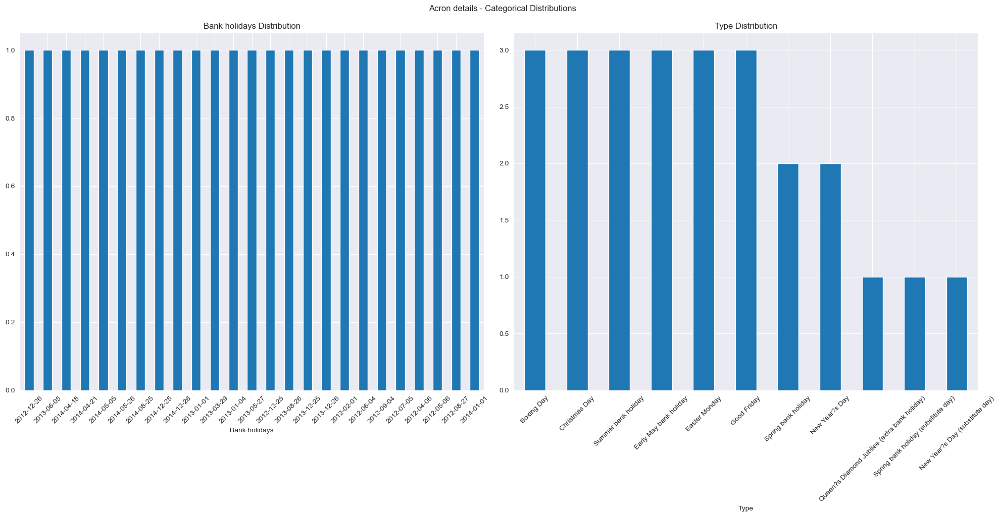


4. Correlation Analysis...
Not enough numerical columns for correlation analysis

5. Outlier Analysis...


In [9]:
df_acron = pd.read_csv('C:/Users/XzfhX/.cache/kagglehub/datasets/jeanmidev/smart-meters-in-london/versions/21/uk_bank_holidays.csv') 
analyze_dataset(df_acron, "Acron details") 

## 5. Combining Dataset and finding target variable 

###  Combine all blocks in daily dataset 

In [10]:
# Combine all blocks in daily dataset 

import pandas as pd
import glob
import os

# Define the path
path = "C:\\Users\\XzfhX\\.cache\\kagglehub\\datasets\\jeanmidev\\smart-meters-in-london\\versions\\21"

# Code to combine all blocks daily readings
# Define the folder path where the files are located
folder_path = os.path.join(path, "daily_dataset", "daily_dataset")

# Find all CSV files in the folder
all_files = glob.glob(os.path.join(folder_path, "*.csv"))

# Read and concatenate all files into a single DataFrame
dataframes = []
for file in all_files:
    # Print the number of rows in the current file
    file_df = pd.read_csv(file)
    # print(f"{file}: {len(file_df)} rows")
    
    # Append the file DataFrame to the list
    dataframes.append(file_df) 

# Combine all the DataFrames into one
energy = pd.concat(dataframes, ignore_index=True)  


In [11]:
energy

,LCLid,day,energy_median,energy_mean,energy_max,energy_count,energy_std,energy_sum,energy_min
0,MAC000002,2012-10-12,0.1385,0.154304,0.886,46,0.196034,7.098,0.000
1,MAC000002,2012-10-13,0.1800,0.230979,0.933,48,0.192329,11.087,0.076
2,MAC000002,2012-10-14,0.1580,0.275479,1.085,48,0.274647,13.223,0.070
3,MAC000002,2012-10-15,0.1310,0.213688,1.164,48,0.224483,10.257,0.070
4,MAC000002,2012-10-16,0.1450,0.203521,0.991,48,0.184115,9.769,0.087
...,...,...,...,...,...,...,...,...,...
3510428,MAC005019,2014-02-24,0.0915,0.091938,0.192,48,0.029466,4.413,0.046
3510429,MAC005019,2014-02-25,0.0735,0.251104,1.455,48,0.369093,12.053,0.029
3510430,MAC005019,2014-02-26,0.0740,0.117604,0.554,48,0.112632,5.645,0.031
3510431,MAC005019,2014-02-27,0.0605,0.086521,0.449,48,0.076162,4.153,0.029


### Group by date, all consumption on the same date is combined

In [12]:

# Group by date, all consumption on the same date is combined

housecount = energy.groupby('day')[['LCLid']].nunique()
housecount = housecount.rename(columns={'LCLid': 'house_number'})  # Rename 'LCLid' to 'house_numbers'
housecount.head(4)

energy = energy.groupby('day')[['energy_sum']].sum()
energy = energy.merge(housecount, on=['day'])
energy = energy.reset_index()
energy.day = pd.to_datetime(energy.day, format='%Y-%m-%d').dt.date
energy['avg_energy_per_house'] = energy['energy_sum'] / energy['house_number']

print("Starting Point of Data at Day Level", min(energy.day))
print("Ending Point of Data at Day Level", max(energy.day))


Starting Point of Data at Day Level 2011-11-23
Ending Point of Data at Day Level 2014-02-28


In [13]:
energy

,day,energy_sum,house_number,avg_energy_per_house
0,2011-11-23,90.385000,13,6.952692
1,2011-11-24,213.412000,25,8.536480
2,2011-11-25,303.993000,32,9.499781
3,2011-11-26,420.976000,41,10.267707
4,2011-11-27,444.883001,41,10.850805
...,...,...,...,...
824,2014-02-24,51994.547004,4994,10.411403
825,2014-02-25,51423.508001,4995,10.294997
826,2014-02-26,50943.305995,4993,10.202945
827,2014-02-27,51678.185998,4990,10.356350


In [14]:
energy.describe()

,energy_sum,house_number,avg_energy_per_house
count,829.000000,829.000000,829.000000
mean,42870.715689,4234.539204,10.358458
std,20141.286953,1789.994799,1.886206
min,90.385000,13.000000,0.208997
25%,34421.895002,4084.000000,8.565752
50%,45846.575997,5138.000000,10.372293
75%,58795.512000,5369.000000,11.832222
max,82650.492003,5541.000000,15.940238


In [15]:
## Load daily weather dataset and extract "day" column within it 

# Define the file path for 'weather_daily_darksky'
file_path = os.path.join(path, "weather_daily_darksky.csv")

# Read the CSV file into a DataFrame
df_weather = pd.read_csv(file_path) 


In [16]:
df_weather['day'] = pd.to_datetime(df_weather['temperatureMaxTime']).dt.date 

In [17]:
df_weather

,temperatureMax,temperatureMaxTime,windBearing,icon,dewPoint,temperatureMinTime,cloudCover,windSpeed,pressure,apparentTemperatureMinTime,...,sunriseTime,temperatureHighTime,uvIndexTime,summary,temperatureLowTime,apparentTemperatureMin,apparentTemperatureMaxTime,apparentTemperatureLowTime,moonPhase,day
0,11.96,2011-11-11 23:00:00,123,fog,9.40,2011-11-11 07:00:00,0.79,3.88,1016.08,2011-11-11 07:00:00,...,2011-11-11 07:12:14,2011-11-11 19:00:00,2011-11-11 11:00:00,Foggy until afternoon.,2011-11-11 19:00:00,6.48,2011-11-11 23:00:00,2011-11-11 19:00:00,0.52,2011-11-11
1,8.59,2011-12-11 14:00:00,198,partly-cloudy-day,4.49,2011-12-11 01:00:00,0.56,3.94,1007.71,2011-12-11 02:00:00,...,2011-12-11 07:57:02,2011-12-11 14:00:00,2011-12-11 12:00:00,Partly cloudy throughout the day.,2011-12-12 07:00:00,0.11,2011-12-11 20:00:00,2011-12-12 08:00:00,0.53,2011-12-11
2,10.33,2011-12-27 02:00:00,225,partly-cloudy-day,5.47,2011-12-27 23:00:00,0.85,3.54,1032.76,2011-12-27 22:00:00,...,2011-12-27 08:07:06,2011-12-27 14:00:00,2011-12-27 00:00:00,Mostly cloudy throughout the day.,2011-12-27 23:00:00,5.59,2011-12-27 02:00:00,2011-12-28 00:00:00,0.10,2011-12-27
3,8.07,2011-12-02 23:00:00,232,wind,3.69,2011-12-02 07:00:00,0.32,3.00,1012.12,2011-12-02 07:00:00,...,2011-12-02 07:46:09,2011-12-02 12:00:00,2011-12-02 10:00:00,Partly cloudy throughout the day and breezy ov...,2011-12-02 19:00:00,0.46,2011-12-02 12:00:00,2011-12-02 19:00:00,0.25,2011-12-02
4,8.22,2011-12-24 23:00:00,252,partly-cloudy-night,2.79,2011-12-24 07:00:00,0.37,4.46,1028.17,2011-12-24 07:00:00,...,2011-12-24 08:06:15,2011-12-24 15:00:00,2011-12-24 13:00:00,Mostly cloudy throughout the day.,2011-12-24 19:00:00,-0.51,2011-12-24 23:00:00,2011-12-24 20:00:00,0.99,2011-12-24
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
877,9.03,2014-01-26 16:00:00,233,partly-cloudy-day,2.39,2014-01-26 21:00:00,0.40,4.55,1002.10,2014-01-26 22:00:00,...,2014-01-26 07:48:49,2014-01-26 16:00:00,2014-01-26 11:00:00,Mostly cloudy until evening.,2014-01-27 05:00:00,-1.30,2014-01-26 15:00:00,2014-01-27 04:00:00,0.84,2014-01-26
878,10.31,2014-02-27 14:00:00,224,partly-cloudy-day,3.08,2014-02-27 23:00:00,0.32,4.14,1007.02,2014-02-27 22:00:00,...,2014-02-27 06:51:45,2014-02-27 14:00:00,2014-02-27 12:00:00,Partly cloudy until evening.,2014-02-28 02:00:00,1.41,2014-02-27 14:00:00,2014-02-28 02:00:00,0.93,2014-02-27
879,18.97,2014-03-09 14:00:00,172,partly-cloudy-night,4.30,2014-03-09 07:00:00,0.04,2.78,1022.44,2014-03-09 07:00:00,...,2014-03-09 06:29:49,2014-03-09 14:00:00,2014-03-09 12:00:00,Partly cloudy in the evening.,2014-03-10 05:00:00,7.08,2014-03-09 14:00:00,2014-03-10 06:00:00,0.28,2014-03-09
880,8.83,2014-02-12 16:00:00,210,wind,1.94,2014-02-12 01:00:00,0.59,7.24,994.27,2014-02-12 01:00:00,...,2014-02-12 07:21:44,2014-02-12 16:00:00,2014-02-12 10:00:00,Mostly cloudy until evening and breezy through...,2014-02-13 05:00:00,-1.20,2014-02-12 16:00:00,2014-02-13 02:00:00,0.42,2014-02-12


In [18]:
# Merging weather with energy 

# Change format 
energy['day'] = pd.to_datetime(energy['day'])
df_weather['day'] = pd.to_datetime(df_weather['day']) 

merge_dataset = pd.DataFrame.merge(energy,df_weather , left_on='day', right_on='day', how='inner')
merge_dataset

,day,energy_sum,house_number,avg_energy_per_house,temperatureMax,temperatureMaxTime,windBearing,icon,dewPoint,temperatureMinTime,...,temperatureHigh,sunriseTime,temperatureHighTime,uvIndexTime,summary,temperatureLowTime,apparentTemperatureMin,apparentTemperatureMaxTime,apparentTemperatureLowTime,moonPhase
0,2011-11-23,90.385000,13,6.952692,10.36,2011-11-23 14:00:00,229,fog,6.29,2011-11-23 07:00:00,...,10.36,2011-11-23 07:32:38,2011-11-23 14:00:00,2011-11-23 10:00:00,Foggy in the morning.,2011-11-23 22:00:00,2.18,2011-11-23 14:00:00,2011-11-23 22:00:00,0.94
1,2011-11-24,213.412000,25,8.536480,12.93,2011-11-24 12:00:00,204,partly-cloudy-night,8.56,2011-11-24 02:00:00,...,12.93,2011-11-24 07:34:14,2011-11-24 12:00:00,2011-11-24 10:00:00,Partly cloudy throughout the day.,2011-11-24 19:00:00,7.01,2011-11-24 12:00:00,2011-11-24 19:00:00,0.97
2,2011-11-25,303.993000,32,9.499781,13.03,2011-11-25 05:00:00,243,partly-cloudy-day,7.24,2011-11-25 23:00:00,...,12.27,2011-11-25 07:35:49,2011-11-25 12:00:00,2011-11-25 10:00:00,Partly cloudy throughout the day.,2011-11-26 01:00:00,4.84,2011-11-25 05:00:00,2011-11-26 05:00:00,0.01
3,2011-11-26,420.976000,41,10.267707,12.96,2011-11-26 14:00:00,237,wind,6.96,2011-11-26 01:00:00,...,12.96,2011-11-26 07:37:22,2011-11-26 14:00:00,2011-11-26 10:00:00,Mostly cloudy throughout the day and breezy ov...,2011-11-26 23:00:00,4.69,2011-11-26 14:00:00,2011-11-26 23:00:00,0.05
4,2011-11-27,444.883001,41,10.850805,13.54,2011-11-27 10:00:00,256,wind,5.76,2011-11-27 23:00:00,...,13.54,2011-11-27 07:38:54,2011-11-27 10:00:00,2011-11-27 10:00:00,Breezy in the morning and partly cloudy until ...,2011-11-28 05:00:00,2.94,2011-11-27 10:00:00,2011-11-28 05:00:00,0.08
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
824,2014-02-24,51994.547004,4994,10.411403,14.23,2014-02-24 13:00:00,183,wind,6.03,2014-02-24 07:00:00,...,14.23,2014-02-24 06:58:05,2014-02-24 13:00:00,2014-02-24 09:00:00,Mostly cloudy until evening and breezy overnight.,2014-02-25 03:00:00,5.52,2014-02-24 13:00:00,2014-02-25 03:00:00,0.82
825,2014-02-25,51423.508001,4995,10.294997,11.43,2014-02-25 00:00:00,202,partly-cloudy-day,5.06,2014-02-25 21:00:00,...,10.31,2014-02-25 06:55:59,2014-02-25 14:00:00,2014-02-25 09:00:00,Mostly cloudy throughout the day.,2014-02-26 07:00:00,3.89,2014-02-25 00:00:00,2014-02-26 07:00:00,0.86
826,2014-02-26,50943.305995,4993,10.202945,11.29,2014-02-26 13:00:00,227,partly-cloudy-day,2.74,2014-02-26 07:00:00,...,11.29,2014-02-26 06:53:52,2014-02-26 13:00:00,2014-02-26 12:00:00,Partly cloudy throughout the day.,2014-02-27 00:00:00,1.67,2014-02-26 13:00:00,2014-02-27 00:00:00,0.90
827,2014-02-27,51678.185998,4990,10.356350,10.31,2014-02-27 14:00:00,224,partly-cloudy-day,3.08,2014-02-27 23:00:00,...,10.31,2014-02-27 06:51:45,2014-02-27 14:00:00,2014-02-27 12:00:00,Partly cloudy until evening.,2014-02-28 02:00:00,1.41,2014-02-27 14:00:00,2014-02-28 02:00:00,0.93


In [19]:
## Load holiday dataset and extract "day" column within it 

# Define the file path for 'weather_daily_darksky'
file_path = os.path.join(path, "uk_bank_holidays.csv")

# Read the CSV file into a DataFrame
df_holidays = pd.read_csv(file_path)  
df_holidays = df_holidays.rename(columns={'Bank holidays': 'day'})  # Rename to day 
df_holidays = df_holidays.rename(columns={'Type': 'holiday'})  # Rename to day

df_holidays


,day,holiday
0,2012-12-26,Boxing Day
1,2012-12-25,Christmas Day
2,2012-08-27,Summer bank holiday
3,2012-05-06,Queen?s Diamond Jubilee (extra bank holiday)
4,2012-04-06,Spring bank holiday (substitute day)
5,2012-07-05,Early May bank holiday
6,2012-09-04,Easter Monday
7,2012-06-04,Good Friday
8,2012-02-01,New Year?s Day (substitute day)
9,2013-12-26,Boxing Day


In [20]:
# Change format 
df_holidays['day'] = pd.to_datetime(df_holidays['day'])


merge_dataset = pd.DataFrame.merge(merge_dataset,df_holidays , left_on='day', right_on='day', how='left')
merge_dataset

## This dataset will be used in part 2,3,4 

,day,energy_sum,house_number,avg_energy_per_house,temperatureMax,temperatureMaxTime,windBearing,icon,dewPoint,temperatureMinTime,...,sunriseTime,temperatureHighTime,uvIndexTime,summary,temperatureLowTime,apparentTemperatureMin,apparentTemperatureMaxTime,apparentTemperatureLowTime,moonPhase,holiday
0,2011-11-23,90.385000,13,6.952692,10.36,2011-11-23 14:00:00,229,fog,6.29,2011-11-23 07:00:00,...,2011-11-23 07:32:38,2011-11-23 14:00:00,2011-11-23 10:00:00,Foggy in the morning.,2011-11-23 22:00:00,2.18,2011-11-23 14:00:00,2011-11-23 22:00:00,0.94,NaN
1,2011-11-24,213.412000,25,8.536480,12.93,2011-11-24 12:00:00,204,partly-cloudy-night,8.56,2011-11-24 02:00:00,...,2011-11-24 07:34:14,2011-11-24 12:00:00,2011-11-24 10:00:00,Partly cloudy throughout the day.,2011-11-24 19:00:00,7.01,2011-11-24 12:00:00,2011-11-24 19:00:00,0.97,NaN
2,2011-11-25,303.993000,32,9.499781,13.03,2011-11-25 05:00:00,243,partly-cloudy-day,7.24,2011-11-25 23:00:00,...,2011-11-25 07:35:49,2011-11-25 12:00:00,2011-11-25 10:00:00,Partly cloudy throughout the day.,2011-11-26 01:00:00,4.84,2011-11-25 05:00:00,2011-11-26 05:00:00,0.01,NaN
3,2011-11-26,420.976000,41,10.267707,12.96,2011-11-26 14:00:00,237,wind,6.96,2011-11-26 01:00:00,...,2011-11-26 07:37:22,2011-11-26 14:00:00,2011-11-26 10:00:00,Mostly cloudy throughout the day and breezy ov...,2011-11-26 23:00:00,4.69,2011-11-26 14:00:00,2011-11-26 23:00:00,0.05,NaN
4,2011-11-27,444.883001,41,10.850805,13.54,2011-11-27 10:00:00,256,wind,5.76,2011-11-27 23:00:00,...,2011-11-27 07:38:54,2011-11-27 10:00:00,2011-11-27 10:00:00,Breezy in the morning and partly cloudy until ...,2011-11-28 05:00:00,2.94,2011-11-27 10:00:00,2011-11-28 05:00:00,0.08,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
824,2014-02-24,51994.547004,4994,10.411403,14.23,2014-02-24 13:00:00,183,wind,6.03,2014-02-24 07:00:00,...,2014-02-24 06:58:05,2014-02-24 13:00:00,2014-02-24 09:00:00,Mostly cloudy until evening and breezy overnight.,2014-02-25 03:00:00,5.52,2014-02-24 13:00:00,2014-02-25 03:00:00,0.82,NaN
825,2014-02-25,51423.508001,4995,10.294997,11.43,2014-02-25 00:00:00,202,partly-cloudy-day,5.06,2014-02-25 21:00:00,...,2014-02-25 06:55:59,2014-02-25 14:00:00,2014-02-25 09:00:00,Mostly cloudy throughout the day.,2014-02-26 07:00:00,3.89,2014-02-25 00:00:00,2014-02-26 07:00:00,0.86,NaN
826,2014-02-26,50943.305995,4993,10.202945,11.29,2014-02-26 13:00:00,227,partly-cloudy-day,2.74,2014-02-26 07:00:00,...,2014-02-26 06:53:52,2014-02-26 13:00:00,2014-02-26 12:00:00,Partly cloudy throughout the day.,2014-02-27 00:00:00,1.67,2014-02-26 13:00:00,2014-02-27 00:00:00,0.90,NaN
827,2014-02-27,51678.185998,4990,10.356350,10.31,2014-02-27 14:00:00,224,partly-cloudy-day,3.08,2014-02-27 23:00:00,...,2014-02-27 06:51:45,2014-02-27 14:00:00,2014-02-27 12:00:00,Partly cloudy until evening.,2014-02-28 02:00:00,1.41,2014-02-27 14:00:00,2014-02-28 02:00:00,0.93,NaN


## 5 and 6. Analyzing the final dataset that will be used in next parts and finding correlation with target variable 


Analysis for Combined Dataset

1. Missing Values and Duplicates Analysis:

Missing Values:
cloudCover       1
uvIndex          1
uvIndexTime      1
holiday        811
dtype: int64

Duplicate rows: 0

2. Statistical Summary:

Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 829 entries, 0 to 828
Data columns (total 37 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   day                          829 non-null    datetime64[ns]
 1   energy_sum                   829 non-null    float64       
 2   house_number                 829 non-null    int64         
 3   avg_energy_per_house         829 non-null    float64       
 4   temperatureMax               829 non-null    float64       
 5   temperatureMaxTime           829 non-null    object        
 6   windBearing                  829 non-null    int64         
 7   icon                         829 non-null    object        
 8   

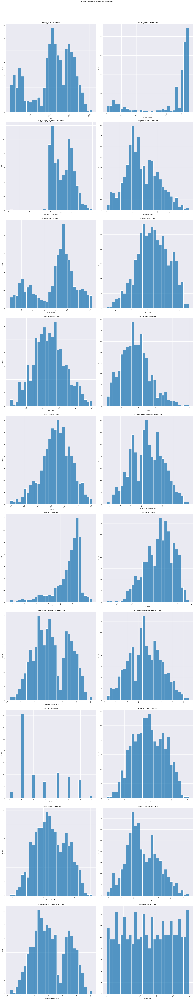

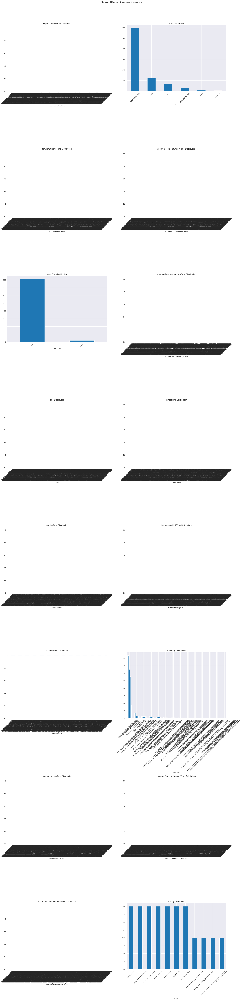


4. Correlation Analysis...


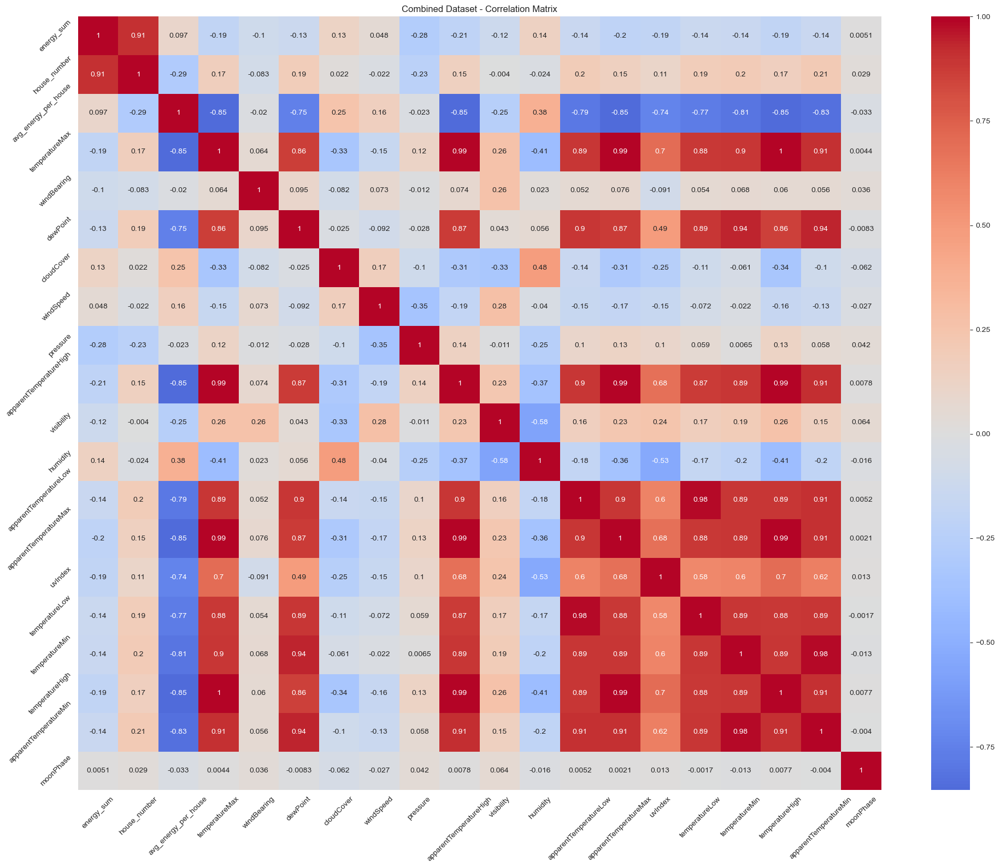


5. Outlier Analysis...

Outliers in energy_sum:
Number of outliers: 0
Percentage of outliers: 0.00%


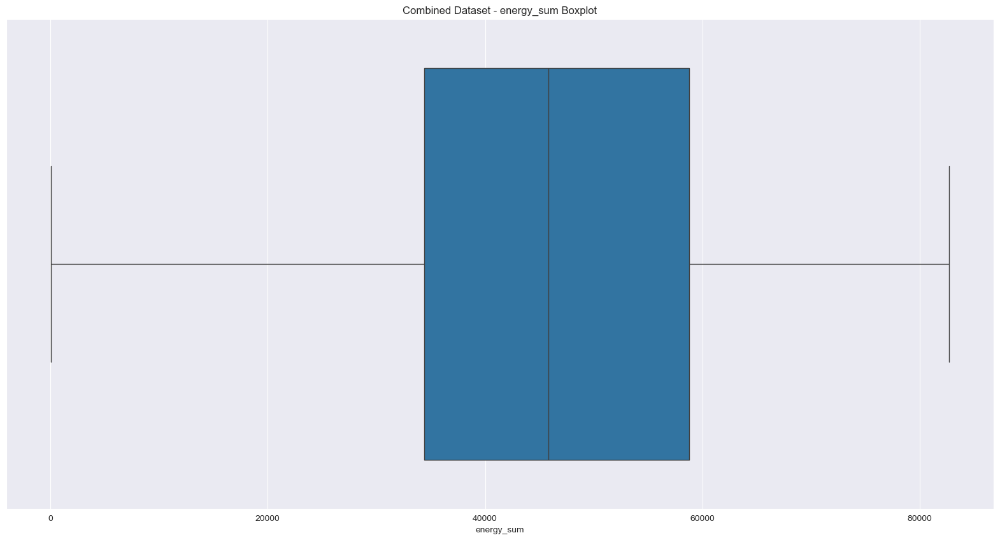


Outliers in house_number:
Number of outliers: 160
Percentage of outliers: 19.30%


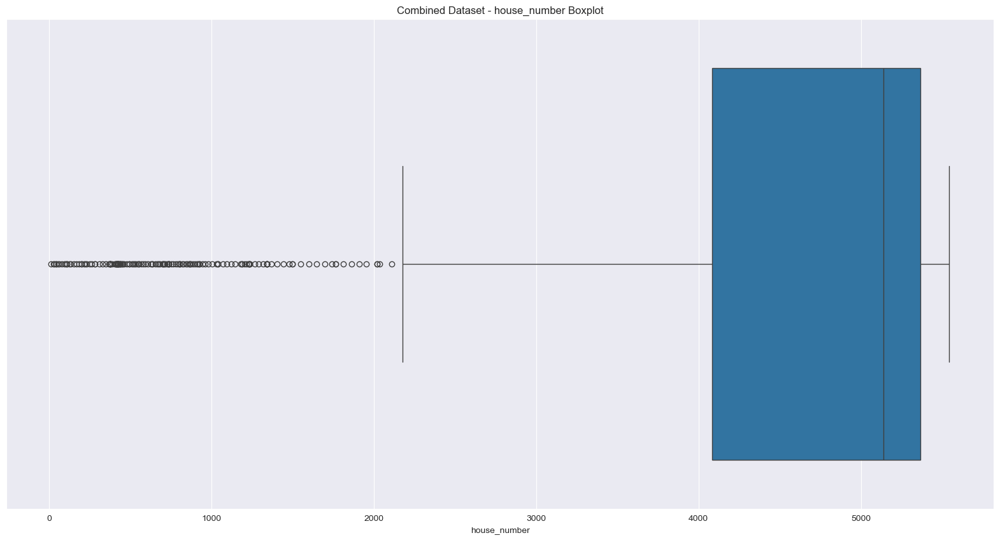


Outliers in avg_energy_per_house:
Number of outliers: 1
Percentage of outliers: 0.12%


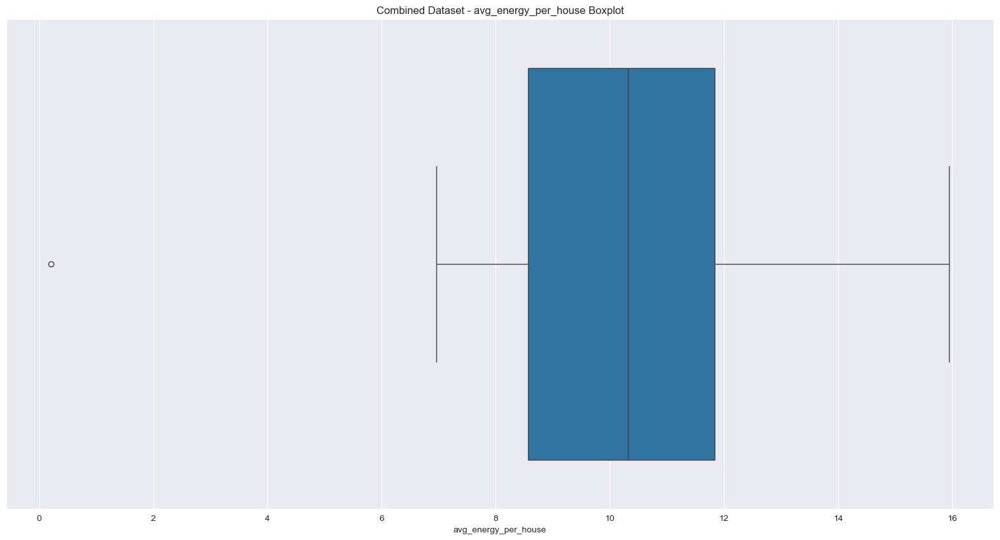


Outliers in temperatureMax:
Number of outliers: 2
Percentage of outliers: 0.24%


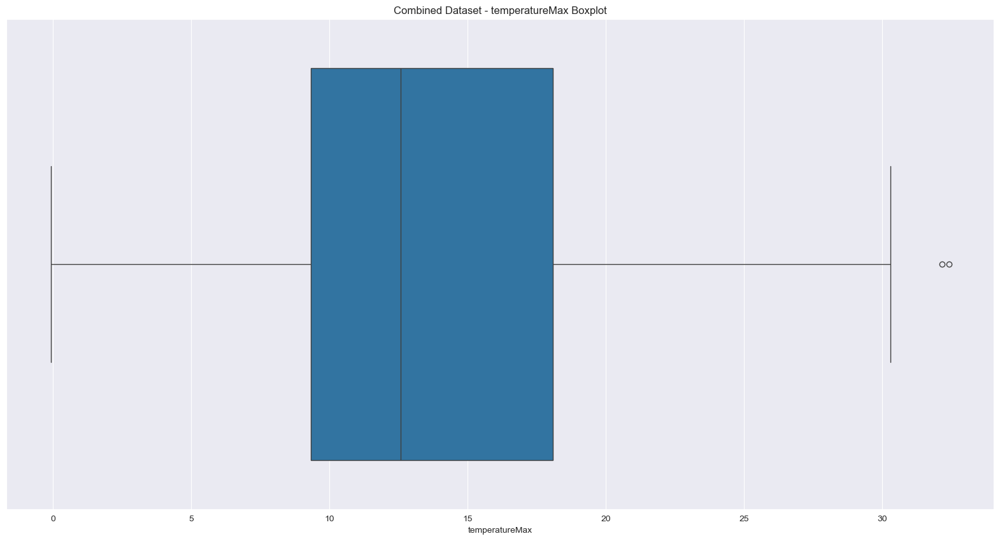


Outliers in windBearing:
Number of outliers: 0
Percentage of outliers: 0.00%


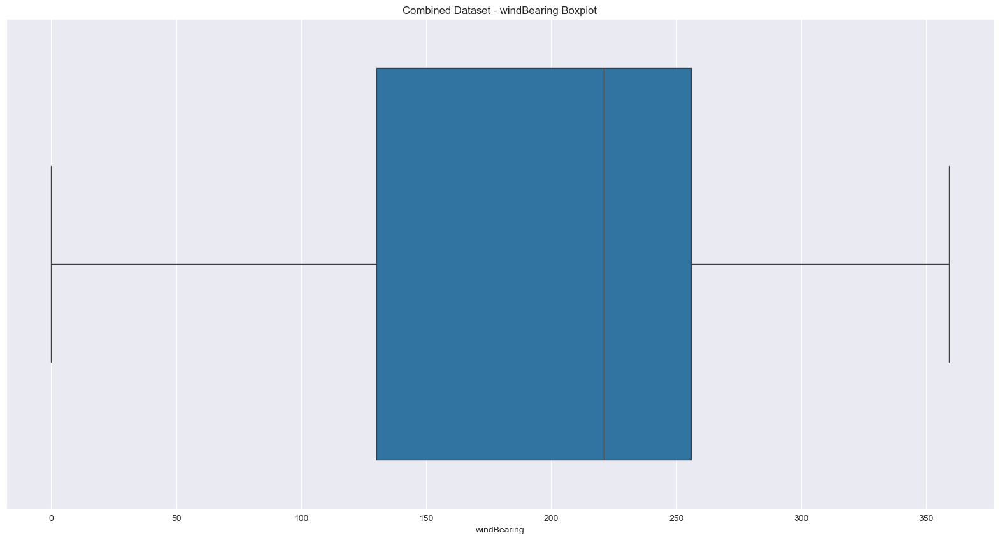


Outliers in dewPoint:
Number of outliers: 1
Percentage of outliers: 0.12%


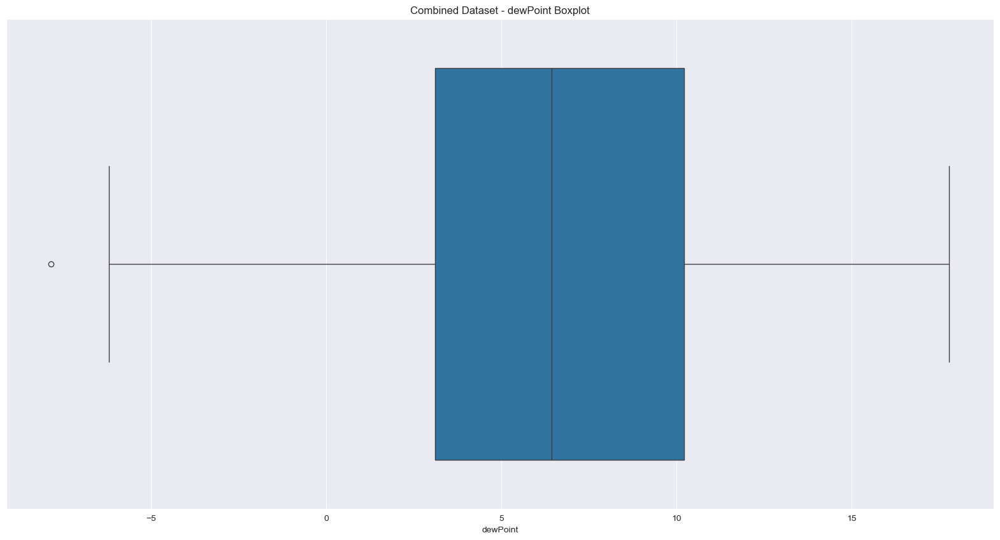


Outliers in cloudCover:
Number of outliers: 3
Percentage of outliers: 0.36%


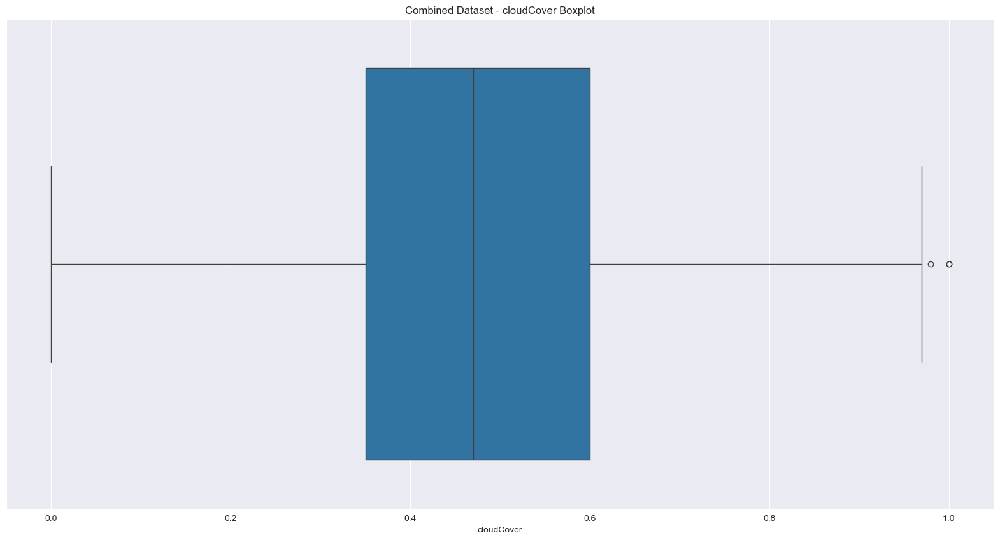


Outliers in windSpeed:
Number of outliers: 13
Percentage of outliers: 1.57%


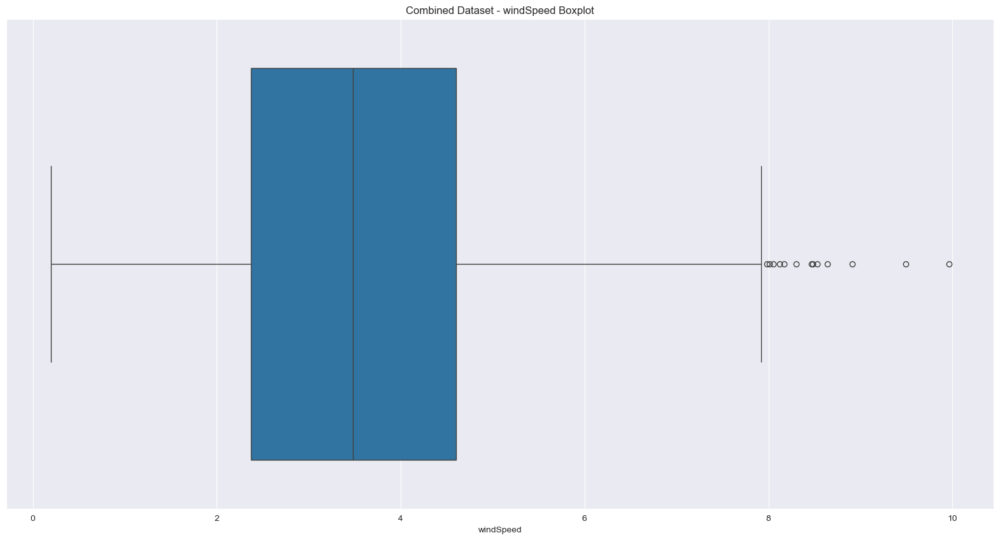


Outliers in pressure:
Number of outliers: 10
Percentage of outliers: 1.21%


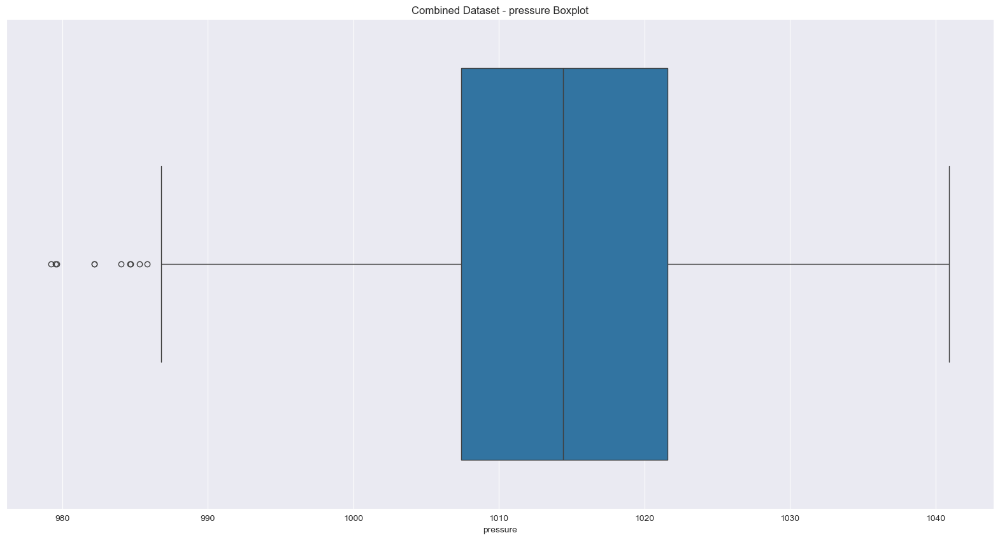


Outliers in apparentTemperatureHigh:
Number of outliers: 0
Percentage of outliers: 0.00%


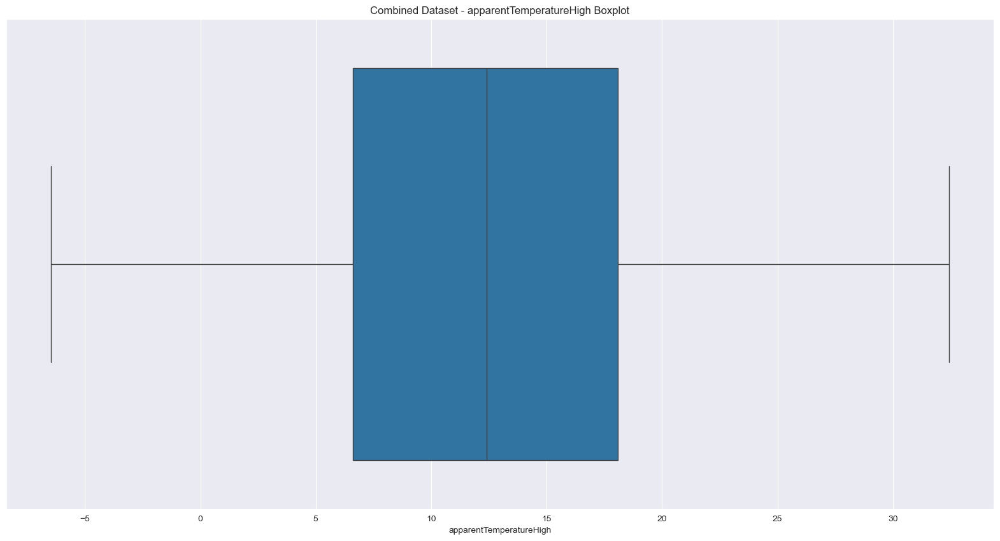


Outliers in visibility:
Number of outliers: 63
Percentage of outliers: 7.60%


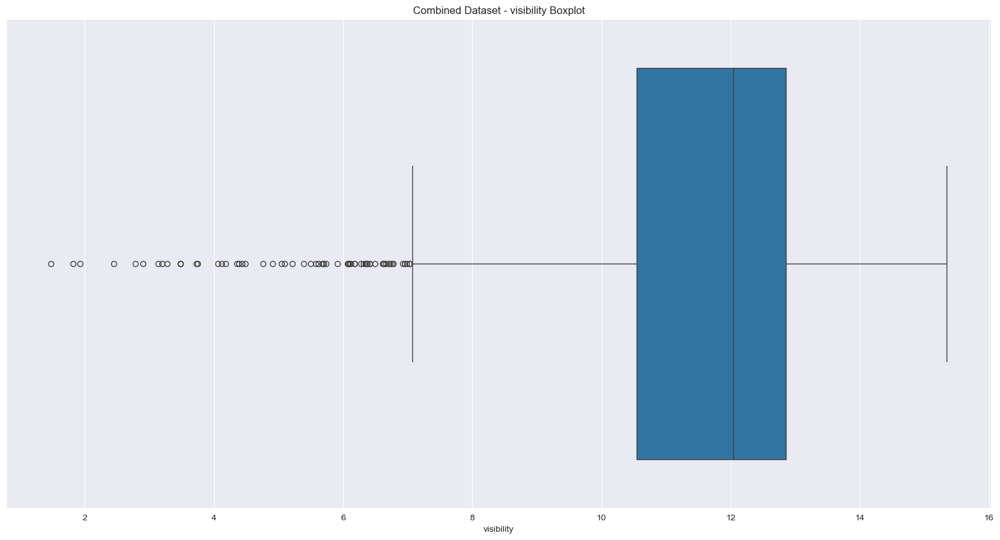


Outliers in humidity:
Number of outliers: 3
Percentage of outliers: 0.36%


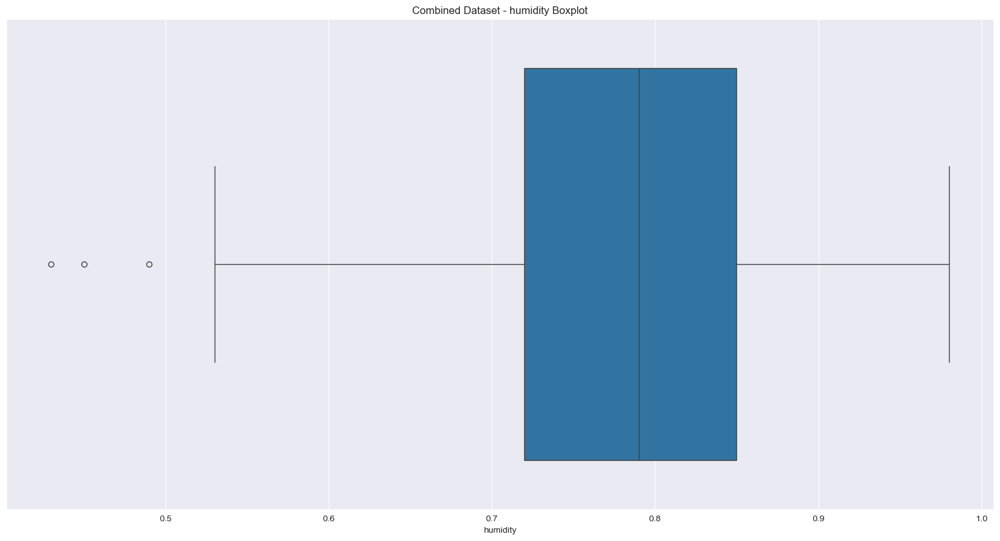


Outliers in apparentTemperatureLow:
Number of outliers: 0
Percentage of outliers: 0.00%


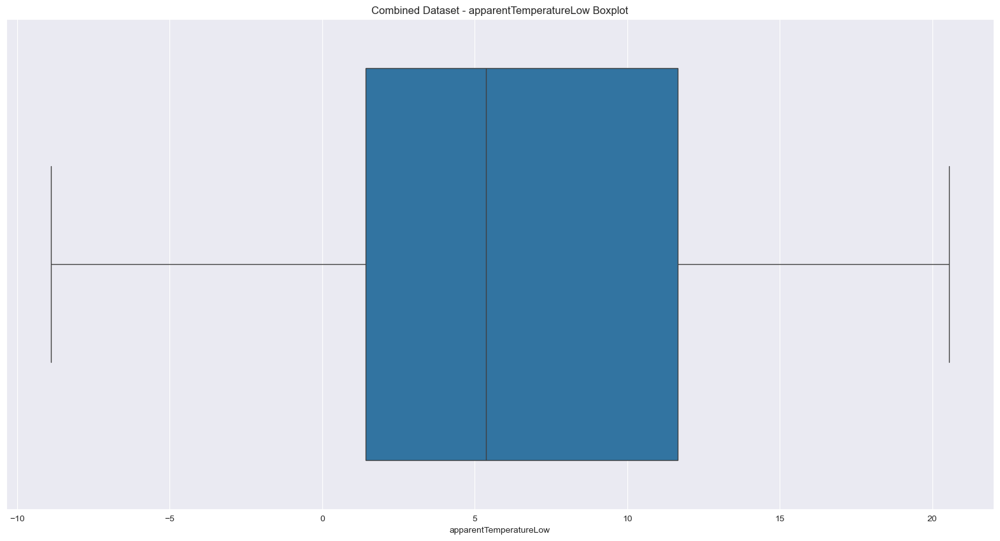


Outliers in apparentTemperatureMax:
Number of outliers: 0
Percentage of outliers: 0.00%


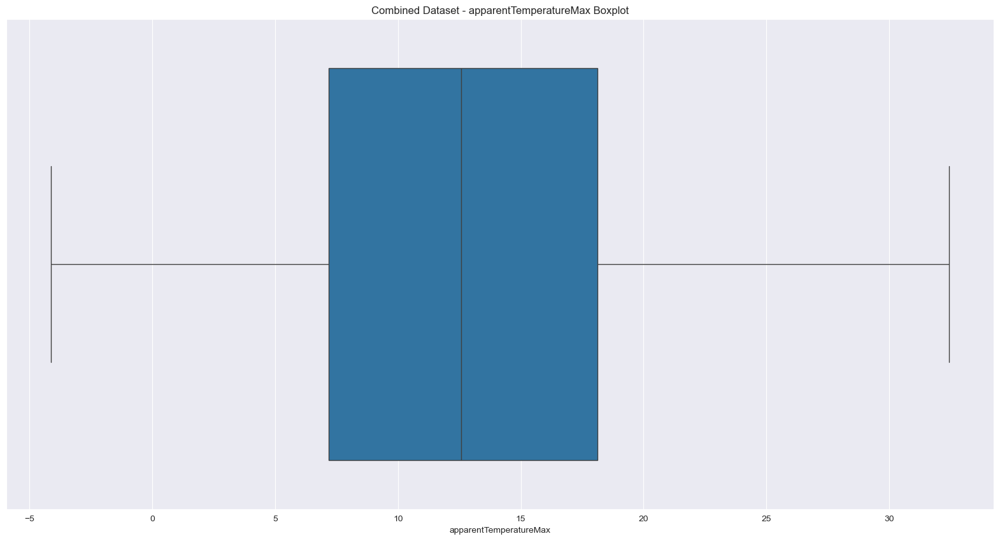


Outliers in uvIndex:
Number of outliers: 0
Percentage of outliers: 0.00%


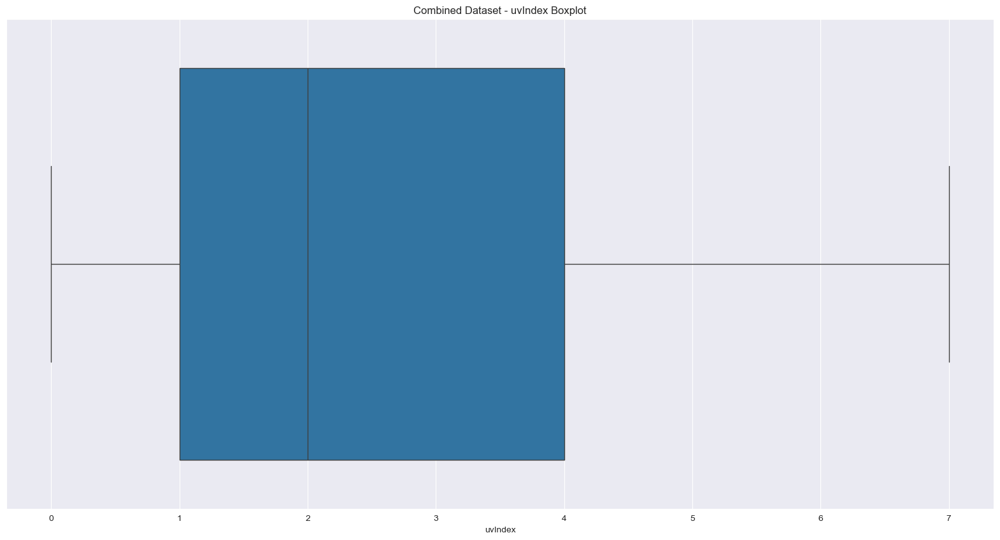


Outliers in temperatureLow:
Number of outliers: 0
Percentage of outliers: 0.00%


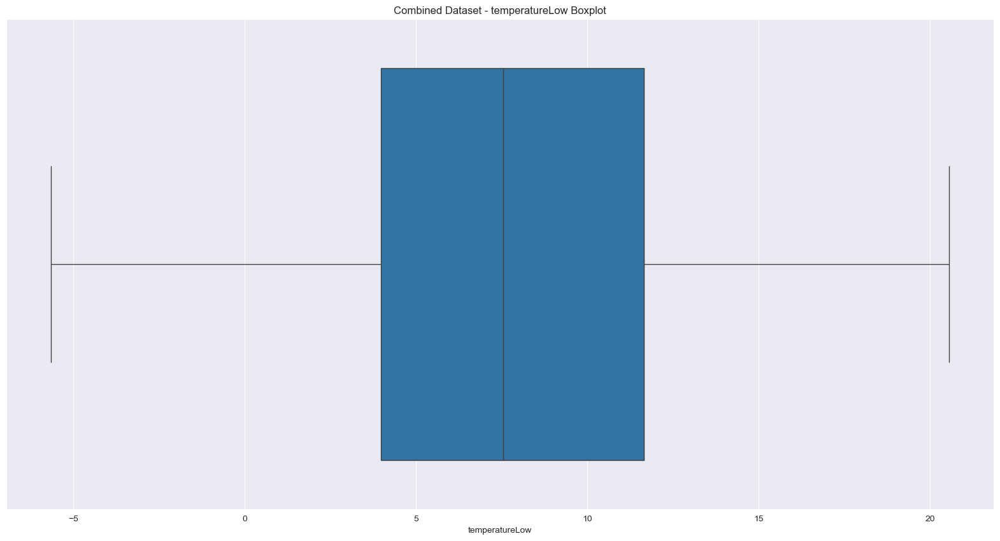


Outliers in temperatureMin:
Number of outliers: 0
Percentage of outliers: 0.00%


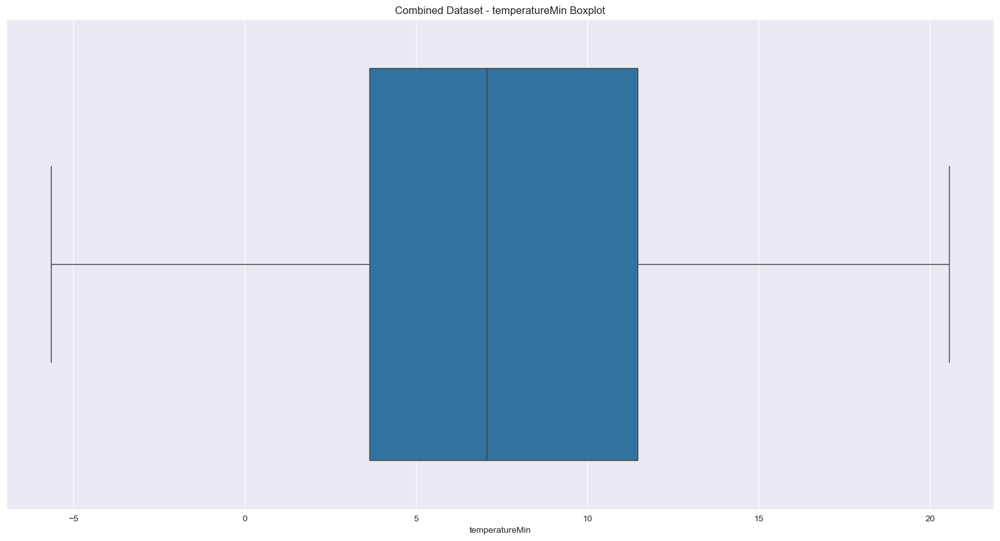


Outliers in temperatureHigh:
Number of outliers: 2
Percentage of outliers: 0.24%


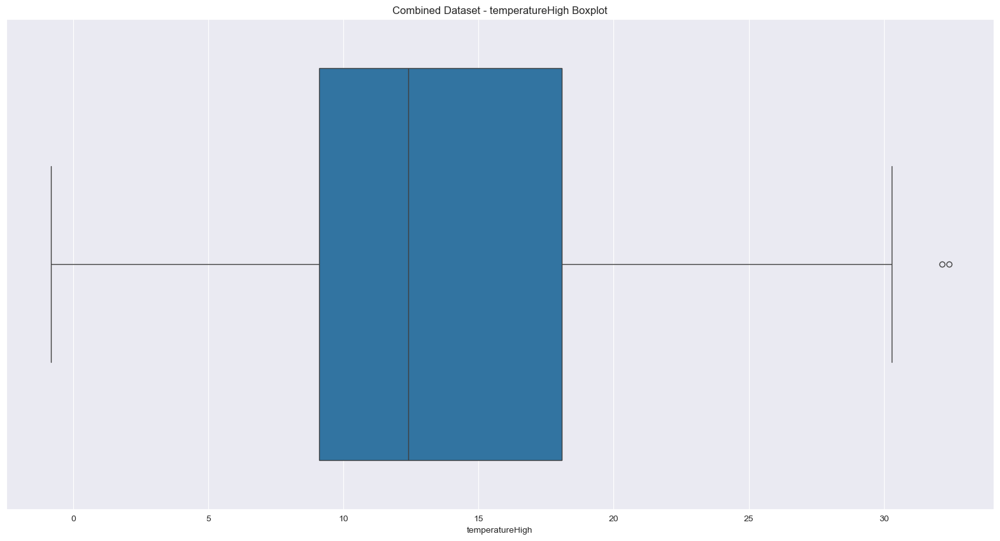


Outliers in apparentTemperatureMin:
Number of outliers: 0
Percentage of outliers: 0.00%


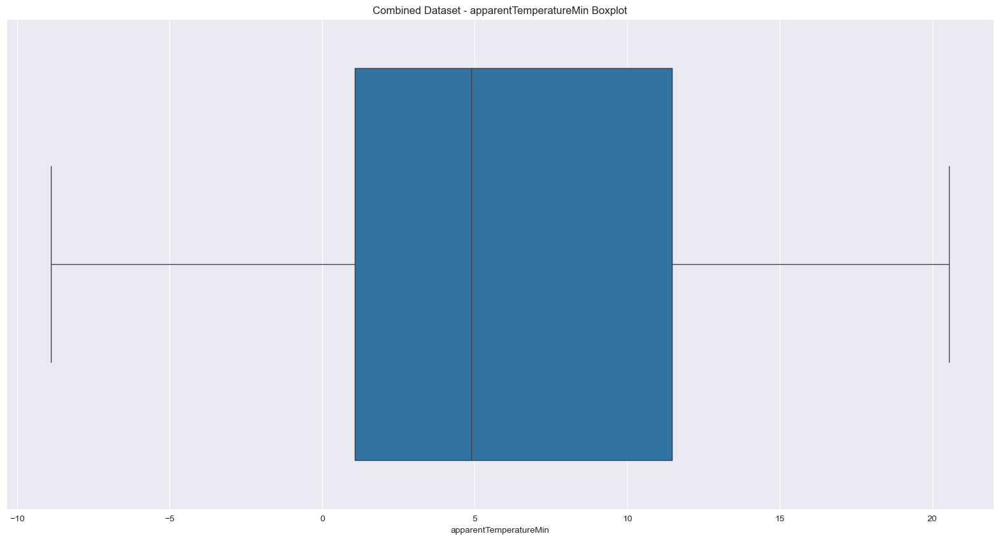


Outliers in moonPhase:
Number of outliers: 0
Percentage of outliers: 0.00%


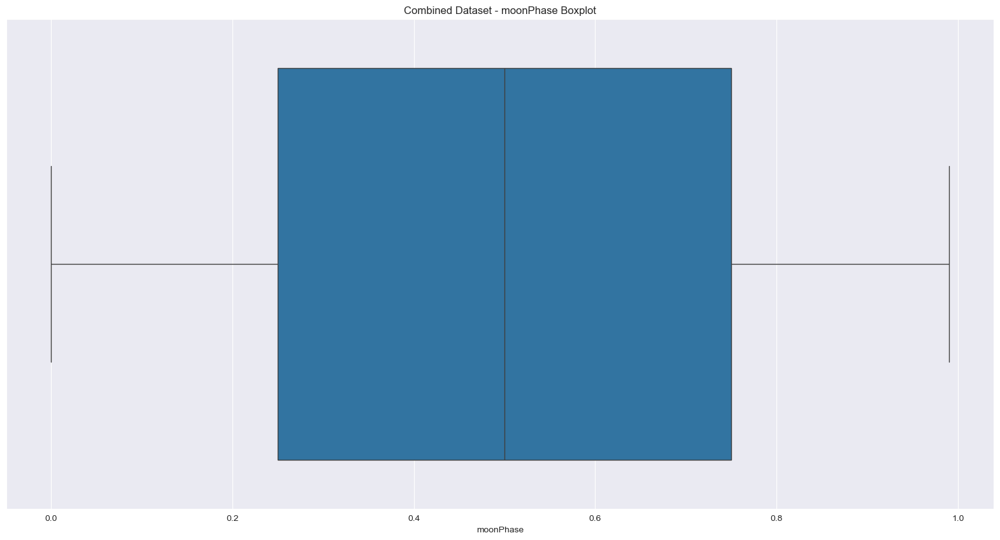

In [21]:
analyze_dataset(merge_dataset, "Combined Dataset")

# Part 2


### Handling missing data 

####   there can be numerical and object based (categorical) values missing 

#### for numerical , replace missing values with mean 
#### for categorical, replace missing value with mode  


In [22]:
# Find columns with missing data
missing_columns = merge_dataset.columns[merge_dataset.isnull().any()]

# Print the column name, type, and number of missing values
for column in missing_columns:
    missing_count = merge_dataset[column].isnull().sum()  # Count missing values
    print(f"Column: {column}, Type: {merge_dataset[column].dtype}, Missing Values: {missing_count}")


Column: cloudCover, Type: float64, Missing Values: 1
Column: uvIndex, Type: float64, Missing Values: 1
Column: uvIndexTime, Type: object, Missing Values: 1
Column: holiday, Type: object, Missing Values: 811


In [23]:

# Fill missing values
for column in missing_columns:
    if column == "holiday":  # For the 'holiday' column, fill with None
        merge_dataset[column] = merge_dataset[column].fillna("None")
        print(f"Column: {column}, Type: {merge_dataset[column].dtype}, Missing Values Now: {merge_dataset[column].isnull().sum()} (Filled with None)")
    elif merge_dataset[column].dtype == 'object':  # For categorical columns
        mode_value = merge_dataset[column].mode().iloc[0]  # Get the mode
        merge_dataset[column] = merge_dataset[column].fillna(mode_value)
        print(f"Column: {column}, Type: {merge_dataset[column].dtype}, Missing Values Now: {merge_dataset[column].isnull().sum()} (Filled with mode: {mode_value})")
    else:  # For numerical columns
        mean_value = merge_dataset[column].mean()  # Get the mean
        merge_dataset[column] = merge_dataset[column].fillna(mean_value)
        print(f"Column: {column}, Type: {merge_dataset[column].dtype}, Missing Values Now: {merge_dataset[column].isnull().sum()} (Filled with mean: {mean_value})")


Column: cloudCover, Type: float64, Missing Values Now: 0 (Filled with mean: 0.47963768115942035)
Column: uvIndex, Type: float64, Missing Values Now: 0 (Filled with mean: 2.5917874396135265)
Column: uvIndexTime, Type: object, Missing Values Now: 0 (Filled with mode: 2011-11-23 10:00:00)
Column: holiday, Type: object, Missing Values Now: 0 (Filled with None)


### Feature Selection 

#### We considered all the columns that has time and date (except the day column), and the columns that has summery of the data or meaningless information for our prediction target, which is predicting the energy consumption in London for a given day. 

In [24]:
# current columns and their data types
for column, dtype in merge_dataset.dtypes.items():
    print(f"Column: {column}, Type: {dtype}")



Column: day, Type: datetime64[ns]
Column: energy_sum, Type: float64
Column: house_number, Type: int64
Column: avg_energy_per_house, Type: float64
Column: temperatureMax, Type: float64
Column: temperatureMaxTime, Type: object
Column: windBearing, Type: int64
Column: icon, Type: object
Column: dewPoint, Type: float64
Column: temperatureMinTime, Type: object
Column: cloudCover, Type: float64
Column: windSpeed, Type: float64
Column: pressure, Type: float64
Column: apparentTemperatureMinTime, Type: object
Column: apparentTemperatureHigh, Type: float64
Column: precipType, Type: object
Column: visibility, Type: float64
Column: humidity, Type: float64
Column: apparentTemperatureHighTime, Type: object
Column: apparentTemperatureLow, Type: float64
Column: apparentTemperatureMax, Type: float64
Column: uvIndex, Type: float64
Column: time, Type: object
Column: sunsetTime, Type: object
Column: temperatureLow, Type: float64
Column: temperatureMin, Type: float64
Column: temperatureHigh, Type: float64


In [25]:
columns_to_remove = ["house_number","avg_energy_per_house", "temperatureMaxTime","temperatureMinTime", "apparentTemperatureMinTime", "apparentTemperatureHighTime", "time", "sunsetTime", "sunriseTime","temperatureHighTime", "uvIndexTime", "temperatureLowTime","apparentTemperatureMaxTime", "apparentTemperatureLowTime", "icon", "summary", "precipType"  ] 



# Drop the specified columns
merge_dataset = merge_dataset.drop(columns=columns_to_remove)

# Display the updated DataFrame (optional)
merge_dataset


,day,energy_sum,temperatureMax,windBearing,dewPoint,cloudCover,windSpeed,pressure,apparentTemperatureHigh,visibility,humidity,apparentTemperatureLow,apparentTemperatureMax,uvIndex,temperatureLow,temperatureMin,temperatureHigh,apparentTemperatureMin,moonPhase,holiday
0,2011-11-23,90.385000,10.36,229,6.29,0.36,2.04,1027.12,10.36,8.06,0.93,6.56,10.36,1.0,8.24,3.81,10.36,2.18,0.94,None
1,2011-11-24,213.412000,12.93,204,8.56,0.41,4.04,1027.22,12.93,10.64,0.89,7.30,12.93,1.0,9.71,8.56,12.93,7.01,0.97,None
2,2011-11-25,303.993000,13.03,243,7.24,0.48,5.02,1024.47,12.27,12.38,0.79,4.69,13.03,1.0,7.01,7.46,12.27,4.84,0.01,None
3,2011-11-26,420.976000,12.96,237,6.96,0.44,5.75,1025.80,12.96,13.07,0.81,11.59,12.96,1.0,11.59,7.01,12.96,4.69,0.05,None
4,2011-11-27,444.883001,13.54,256,5.76,0.42,5.48,1021.11,13.54,13.08,0.72,1.31,13.54,1.0,1.31,4.47,13.54,2.94,0.08,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
824,2014-02-24,51994.547004,14.23,183,6.03,0.50,5.02,1005.19,14.23,13.00,0.74,4.78,14.23,1.0,8.25,7.99,14.23,5.52,0.82,None
825,2014-02-25,51423.508001,11.43,202,5.06,0.62,5.69,1000.65,10.31,12.09,0.78,1.67,11.43,1.0,4.17,6.79,10.31,3.89,0.86,None
826,2014-02-26,50943.305995,11.29,227,2.74,0.26,3.82,1012.73,11.29,13.00,0.73,3.03,11.29,2.0,6.01,4.17,11.29,1.67,0.90,None
827,2014-02-27,51678.185998,10.31,224,3.08,0.32,4.14,1007.02,10.31,12.04,0.74,0.82,10.31,2.0,3.43,3.93,10.31,1.41,0.93,None


In [26]:
merge_dataset_for_visualization = merge_dataset.copy()  # this will be used in part 4 

### Feature Scaling 

Since the features have different ranges, it must be scaled using same scaler. The reason behind that lies in the effect that different scales will result in biased results.  Take linear regression for example, if two features have same range but different scales, they will affect the target variable differently. For this reason, we will use StandardScaler to scale the data before training the model. Moreover, the scaler will be applying to the training data only.   

#### The scaling will be done after splitting the data for training and testing 

### Categorical features Encoding 

In [27]:
# Encoding categorical values 

## The only categorical value we have here is holiday 

# Column name to check unique values
column_name = 'holiday'  # Replace with your column name

# Get unique values in the column
unique_values = merge_dataset[column_name].unique()

# Print unique values
print(f"Unique values in column '{column_name}': {unique_values}")


Unique values in column 'holiday': ['None' 'New Year?s Day (substitute day)'
 'Spring bank holiday (substitute day)'
 'Queen?s Diamond Jubilee (extra bank holiday)' 'Good Friday'
 'Early May bank holiday' 'Summer bank holiday' 'Easter Monday'
 'Christmas Day' 'Boxing Day' 'New Year?s Day' 'Spring bank holiday']


In [28]:
# Since holiday has many values , we are going to use label encoding  

column_name = 'holiday'  # Replace with your column name

# Get the unique values in the column
unique_values = merge_dataset[column_name].unique()

# Create a dictionary for label encoding
label_encoding_dict = {value: idx for idx, value in enumerate(unique_values)}

# Print the encoding dictionary
print(f"Label encoding for column '{column_name}': {label_encoding_dict}")
print()

# Apply the label encoding to the column
merge_dataset[column_name] = merge_dataset[column_name].map(label_encoding_dict)

merge_dataset

# Check for data conversion if needed  

Label encoding for column 'holiday': {'None': 0, 'New Year?s Day (substitute day)': 1, 'Spring bank holiday (substitute day)': 2, 'Queen?s Diamond Jubilee (extra bank holiday)': 3, 'Good Friday': 4, 'Early May bank holiday': 5, 'Summer bank holiday': 6, 'Easter Monday': 7, 'Christmas Day': 8, 'Boxing Day': 9, 'New Year?s Day': 10, 'Spring bank holiday': 11}



,day,energy_sum,temperatureMax,windBearing,dewPoint,cloudCover,windSpeed,pressure,apparentTemperatureHigh,visibility,humidity,apparentTemperatureLow,apparentTemperatureMax,uvIndex,temperatureLow,temperatureMin,temperatureHigh,apparentTemperatureMin,moonPhase,holiday
0,2011-11-23,90.385000,10.36,229,6.29,0.36,2.04,1027.12,10.36,8.06,0.93,6.56,10.36,1.0,8.24,3.81,10.36,2.18,0.94,0
1,2011-11-24,213.412000,12.93,204,8.56,0.41,4.04,1027.22,12.93,10.64,0.89,7.30,12.93,1.0,9.71,8.56,12.93,7.01,0.97,0
2,2011-11-25,303.993000,13.03,243,7.24,0.48,5.02,1024.47,12.27,12.38,0.79,4.69,13.03,1.0,7.01,7.46,12.27,4.84,0.01,0
3,2011-11-26,420.976000,12.96,237,6.96,0.44,5.75,1025.80,12.96,13.07,0.81,11.59,12.96,1.0,11.59,7.01,12.96,4.69,0.05,0
4,2011-11-27,444.883001,13.54,256,5.76,0.42,5.48,1021.11,13.54,13.08,0.72,1.31,13.54,1.0,1.31,4.47,13.54,2.94,0.08,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
824,2014-02-24,51994.547004,14.23,183,6.03,0.50,5.02,1005.19,14.23,13.00,0.74,4.78,14.23,1.0,8.25,7.99,14.23,5.52,0.82,0
825,2014-02-25,51423.508001,11.43,202,5.06,0.62,5.69,1000.65,10.31,12.09,0.78,1.67,11.43,1.0,4.17,6.79,10.31,3.89,0.86,0
826,2014-02-26,50943.305995,11.29,227,2.74,0.26,3.82,1012.73,11.29,13.00,0.73,3.03,11.29,2.0,6.01,4.17,11.29,1.67,0.90,0
827,2014-02-27,51678.185998,10.31,224,3.08,0.32,4.14,1007.02,10.31,12.04,0.74,0.82,10.31,2.0,3.43,3.93,10.31,1.41,0.93,0


In [29]:
# The current format of day is not suitable to be fit into model since is an object. To solve this we are going to transform it into a number 
import numpy as np 

merge_dataset['day'] = (merge_dataset['day'] - merge_dataset['day'].min())  / np.timedelta64(1,'D')
days = merge_dataset['day']
merge_dataset.head()

# Now day represent the day number by taking the lowest day as refernce 

,day,energy_sum,temperatureMax,windBearing,dewPoint,cloudCover,windSpeed,pressure,apparentTemperatureHigh,visibility,humidity,apparentTemperatureLow,apparentTemperatureMax,uvIndex,temperatureLow,temperatureMin,temperatureHigh,apparentTemperatureMin,moonPhase,holiday
0,0.0,90.385000,10.36,229,6.29,0.36,2.04,1027.12,10.36,8.06,0.93,6.56,10.36,1.0,8.24,3.81,10.36,2.18,0.94,0
1,1.0,213.412000,12.93,204,8.56,0.41,4.04,1027.22,12.93,10.64,0.89,7.30,12.93,1.0,9.71,8.56,12.93,7.01,0.97,0
2,2.0,303.993000,13.03,243,7.24,0.48,5.02,1024.47,12.27,12.38,0.79,4.69,13.03,1.0,7.01,7.46,12.27,4.84,0.01,0
3,3.0,420.976000,12.96,237,6.96,0.44,5.75,1025.80,12.96,13.07,0.81,11.59,12.96,1.0,11.59,7.01,12.96,4.69,0.05,0
4,4.0,444.883001,13.54,256,5.76,0.42,5.48,1021.11,13.54,13.08,0.72,1.31,13.54,1.0,1.31,4.47,13.54,2.94,0.08,0


# Part 3

### Algorithm Selection  

The target variable in our data is numerical, which is energy_sum. Therefore, the best algorithm type to use in our case is regression algorithms to estimate the values in the future  

The regression algorithms that will be evaluated here are:  

- Linear Regressor
- Ridge
- Decision Tree
- Random Forest
- ARD Regressor



In [30]:
merge_dataset

,day,energy_sum,temperatureMax,windBearing,dewPoint,cloudCover,windSpeed,pressure,apparentTemperatureHigh,visibility,humidity,apparentTemperatureLow,apparentTemperatureMax,uvIndex,temperatureLow,temperatureMin,temperatureHigh,apparentTemperatureMin,moonPhase,holiday
0,0.0,90.385000,10.36,229,6.29,0.36,2.04,1027.12,10.36,8.06,0.93,6.56,10.36,1.0,8.24,3.81,10.36,2.18,0.94,0
1,1.0,213.412000,12.93,204,8.56,0.41,4.04,1027.22,12.93,10.64,0.89,7.30,12.93,1.0,9.71,8.56,12.93,7.01,0.97,0
2,2.0,303.993000,13.03,243,7.24,0.48,5.02,1024.47,12.27,12.38,0.79,4.69,13.03,1.0,7.01,7.46,12.27,4.84,0.01,0
3,3.0,420.976000,12.96,237,6.96,0.44,5.75,1025.80,12.96,13.07,0.81,11.59,12.96,1.0,11.59,7.01,12.96,4.69,0.05,0
4,4.0,444.883001,13.54,256,5.76,0.42,5.48,1021.11,13.54,13.08,0.72,1.31,13.54,1.0,1.31,4.47,13.54,2.94,0.08,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
824,824.0,51994.547004,14.23,183,6.03,0.50,5.02,1005.19,14.23,13.00,0.74,4.78,14.23,1.0,8.25,7.99,14.23,5.52,0.82,0
825,825.0,51423.508001,11.43,202,5.06,0.62,5.69,1000.65,10.31,12.09,0.78,1.67,11.43,1.0,4.17,6.79,10.31,3.89,0.86,0
826,826.0,50943.305995,11.29,227,2.74,0.26,3.82,1012.73,11.29,13.00,0.73,3.03,11.29,2.0,6.01,4.17,11.29,1.67,0.90,0
827,827.0,51678.185998,10.31,224,3.08,0.32,4.14,1007.02,10.31,12.04,0.74,0.82,10.31,2.0,3.43,3.93,10.31,1.41,0.93,0


### Data Splitting 

After we found the energy sum per day in London, the amount of data decreased and it has now 829 row. Therefore, it is better to use K-fold since Ensures all data is utilized for training and testing. Provides a robust evaluation by averaging over multiple splits. Mitigates bias from a single random split. Moreover, this will prevent overfitting and underfitting 

We will use k = 10  


### Model Training, Evaluation 


- We will train and test each model **10 times**, one for each fold, using 10-fold cross-validation.
- After completing all folds, the **average results** will be calculated to provide a robust evaluation of model performance.

## Evaluation Metrics
Since we are evaluating regression models, the following metrics will be used:

### 1. **R² (R-squared)**
- **Definition**:  
  R² is the proportion of variance in the dependent variable that is explained by the independent variables in the model. It measures the goodness of fit.
- **Range**:  
  - `0`: The model does not explain any of the variance in the data.  
  - `1`: The model explains all the variance in the data.  
  - **Negative R²**: Indicates the model performs worse than a horizontal line (i.e., predicting the mean of the target variable).  

### 2. **RMSE (Root Mean Squared Error)**
- **Definition**:  
  RMSE is a measure of the average magnitude of errors between the predicted and actual values. It indicates how far the predictions are from the true values, expressed in the same units as the target variable.
- **Range**:  
  - `0`: Perfect predictions (no error).  
  - Larger RMSE values indicate worse performance (larger errors).  
-


In [31]:
import warnings
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression, ARDRegression, Ridge
from sklearn.model_selection import KFold
from sklearn.metrics import r2_score, mean_squared_error
import numpy as np

## Sklearn show sklearn\base.py:1474: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  #return fit_method(estimator, *args, **kwargs)
# Suppress warnings globally (optional)
warnings.filterwarnings("ignore", category=UserWarning)  # Suppress sklearn warnings
warnings.filterwarnings("ignore", category=FutureWarning)  # Suppress pandas future warnings

# Define dataset (replace merge_dataset with your actual DataFrame)
X = merge_dataset.drop(['energy_sum'], axis=1)
y = merge_dataset['energy_sum']  # Ensure it's a Series for compatibility

# Initialize K-Fold
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)  # Convert to NumPy array after scaling

# Define regressors
regressors = [
    ('Linear Regressor', LinearRegression()),
    ('Ridge', Ridge(max_iter=1000)),  # Increase max_iter to avoid convergence warnings
    ('Decision Tree', DecisionTreeRegressor()),
    ('Random Forest', RandomForestRegressor(n_estimators=100, n_jobs=-1)),
    ('ARD Regressor', ARDRegression(max_iter=1000))  # Increase max_iter for stability
]

# Loop through each model
for name, model in regressors:
    print(f"Evaluating {name}...")
    r2_scores = []
    rmse_scores = []
    
    # K-Fold Cross-Validation
    for fold, (train_index, test_index) in enumerate(kf.split(X_scaled)):
        # Use NumPy indexing
        X_train, X_test = X_scaled[train_index], X_scaled[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        
        # Train the model
        model.fit(X_train, y_train)
        
        # Predict on test set
        y_pred = model.predict(X_test)
        
        # Calculate metrics
        r2 = r2_score(y_test, y_pred)
        rmse = np.sqrt(mean_squared_error(y_test, y_pred))
        
        r2_scores.append(r2)
        rmse_scores.append(rmse)
        
        print(f"  Fold {fold+1}: R2 = {r2:.4f}, RMSE = {rmse:.4f}")
    
    # Average metrics across all folds
    print(f"Average R2: {np.mean(r2_scores):.4f}")
    print(f"Average RMSE: {np.mean(rmse_scores):.4f}\n")


Evaluating Linear Regressor...
  Fold 1: R2 = 0.5620, RMSE = 13367.2539
  Fold 2: R2 = 0.6218, RMSE = 12722.5192
  Fold 3: R2 = 0.5574, RMSE = 13078.4331
  Fold 4: R2 = 0.6354, RMSE = 13271.5477
  Fold 5: R2 = 0.5595, RMSE = 12728.9554
  Fold 6: R2 = 0.3968, RMSE = 16234.2055
  Fold 7: R2 = 0.6312, RMSE = 12188.4621
  Fold 8: R2 = 0.3684, RMSE = 12272.5248
  Fold 9: R2 = 0.6694, RMSE = 11879.8458
  Fold 10: R2 = 0.6270, RMSE = 12956.6421
Average R2: 0.5629
Average RMSE: 13070.0390

Evaluating Ridge...
  Fold 1: R2 = 0.5689, RMSE = 13260.4899
  Fold 2: R2 = 0.6190, RMSE = 12768.9201
  Fold 3: R2 = 0.5547, RMSE = 13118.8110
  Fold 4: R2 = 0.6290, RMSE = 13388.4692
  Fold 5: R2 = 0.5642, RMSE = 12661.5600
  Fold 6: R2 = 0.3947, RMSE = 16261.9510
  Fold 7: R2 = 0.6341, RMSE = 12140.2972
  Fold 8: R2 = 0.3696, RMSE = 12260.5709
  Fold 9: R2 = 0.6697, RMSE = 11874.9603
  Fold 10: R2 = 0.6327, RMSE = 12858.2925
Average R2: 0.5637
Average RMSE: 13059.4322

Evaluating Decision Tree...
  Fold 1:

### Performance analysis  

As can be seen from the code above that the best result occur when R2 is as  close to 1 as possible and RSME is as close to 0 as possible. 

Therefore, the best model is Random Forest Regression 

### Model Improvement  

The best approach here to improve the model performance is using hyperparameter Tuning. We already considered different types of regression models, scaled the data before training, and did some feature engineering to the data (like creating energy sum feature). Further feature engineering might be helpful. However, this requires expertise in the domain of this study and time as well. So, the best choice for our case is to try hyperparameter tuning and compare the results with our result. We Implemented a code for tuning the hyperparameter of the “Random Forest Regressor” using GridSearchCV, which exhaustively searches through a manually specified set of hyperparameters. method. Then we evaluated the trained tuned regressor performance. However, the regressor performance did not improve with this tuning.    


In [32]:
# Some tuning for random forest regessor 
import warnings
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold, GridSearchCV
from sklearn.metrics import r2_score, mean_squared_error
import numpy as np


# Suppress warnings globally (optional)
warnings.filterwarnings("ignore", category=UserWarning)  # Suppress sklearn warnings
warnings.filterwarnings("ignore", category=FutureWarning)  # Suppress pandas future warnings

# Define dataset (replace merge_dataset with your actual DataFrame)
X = merge_dataset.drop(['energy_sum'], axis=1)
y = merge_dataset['energy_sum']  # Ensure it's a Series for compatibility

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)  # Convert to NumPy array after scaling

# Initialize K-Fold
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Define the Random Forest Regressor and hyperparameter grid
rf_model = RandomForestRegressor(random_state=42)
param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Use GridSearchCV for hyperparameter tuning
grid_search = GridSearchCV(
    estimator=rf_model,
    param_grid=param_grid,
    scoring='r2',  # Optimize for R2 score
    cv=5,          # Perform 5-fold cross-validation in GridSearch
    verbose=1,
    n_jobs=-1      # Use all available cores
)

# Perform GridSearchCV on the entire dataset
print("Performing GridSearchCV for hyperparameter tuning...")
grid_search.fit(X_scaled, y)

# Get the best model and parameters
best_rf_model = grid_search.best_estimator_
print(f"Best Parameters: {grid_search.best_params_}\n")

# Evaluate the best model using K-Fold Cross-Validation
print("Evaluating the tuned Random Forest Regressor...")
r2_scores = []
rmse_scores = []

for fold, (train_index, test_index) in enumerate(kf.split(X_scaled)):
    # Use NumPy indexing
    X_train, X_test = X_scaled[train_index], X_scaled[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    
    # Train the best model
    best_rf_model.fit(X_train, y_train)
    
    # Predict on test set
    y_pred = best_rf_model.predict(X_test)
    
    # Calculate metrics
    r2 = r2_score(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    
    r2_scores.append(r2)
    rmse_scores.append(rmse)
    
    print(f"  Fold {fold+1}: R2 = {r2:.4f}, RMSE = {rmse:.4f}")

# Average metrics across all folds
print(f"Average R2: {np.mean(r2_scores):.4f}")
print(f"Average RMSE: {np.mean(rmse_scores):.4f}\n")


Performing GridSearchCV for hyperparameter tuning...
Fitting 5 folds for each of 108 candidates, totalling 540 fits
Best Parameters: {'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 50}

Evaluating the tuned Random Forest Regressor...
  Fold 1: R2 = 0.9931, RMSE = 1677.6458
  Fold 2: R2 = 0.9924, RMSE = 1802.4279
  Fold 3: R2 = 0.9780, RMSE = 2913.1780
  Fold 4: R2 = 0.9913, RMSE = 2055.6853
  Fold 5: R2 = 0.9907, RMSE = 1853.6584
  Fold 6: R2 = 0.9154, RMSE = 6078.3362
  Fold 7: R2 = 0.9833, RMSE = 2593.7013
  Fold 8: R2 = 0.9775, RMSE = 2317.4910
  Fold 9: R2 = 0.9925, RMSE = 1787.8751
  Fold 10: R2 = 0.9881, RMSE = 2317.4134
Average R2: 0.9802
Average RMSE: 2539.7412



The hyperparameter tuninig did not provide better resaults

### Validation 

We already use cross validation to ensure the model genarlaize very well on the data 

### Final Model Selection 

As was shown in the evaluation of different regessors, the best model was random forest regressor 

# Part 4

### Data Distribution  

We are going to visualize the data before scaling or encoding. The day will not be visualized since it is like an index to the data only 

Visualizing numerical features...


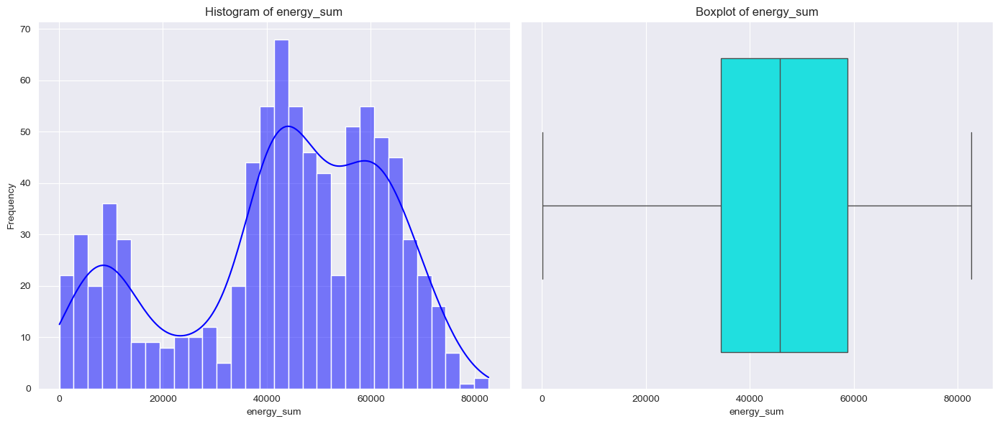

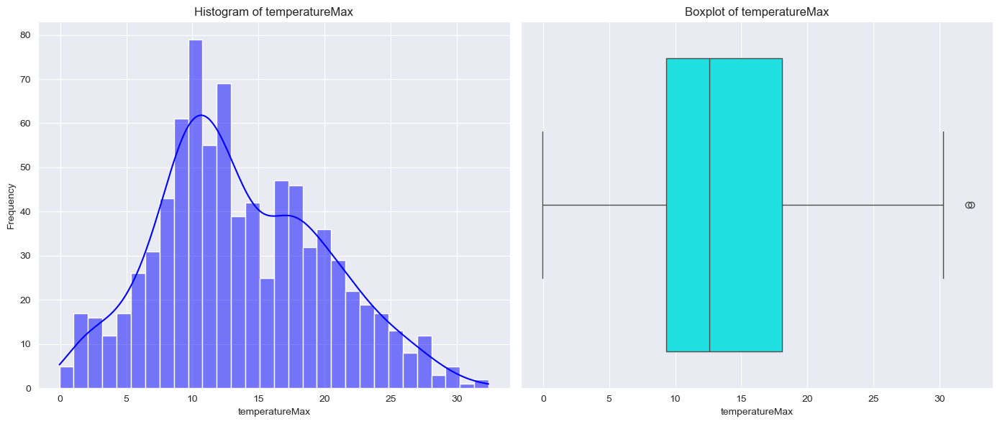

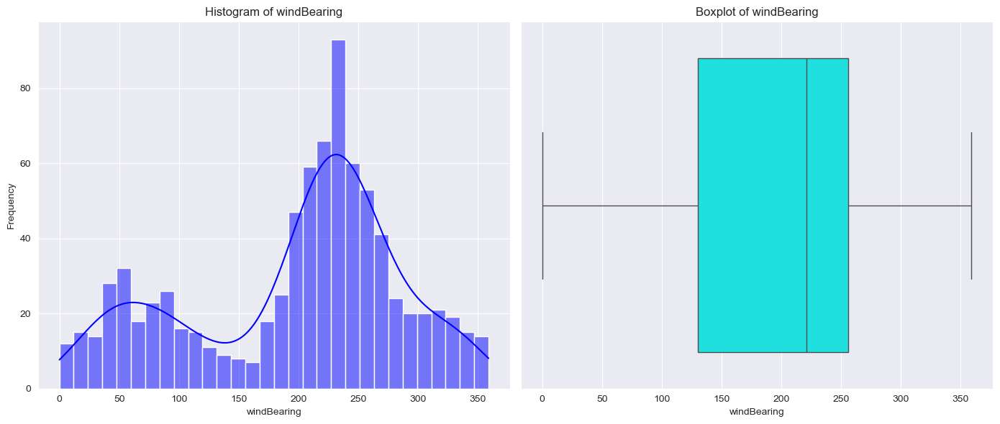

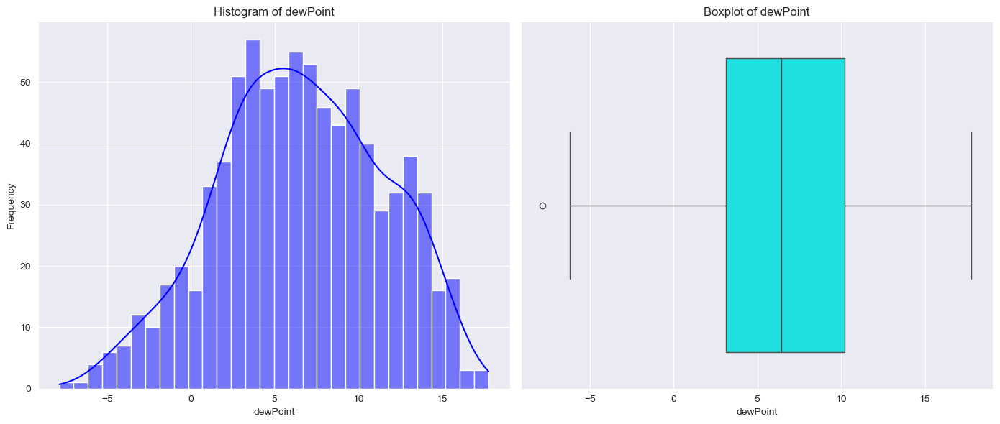

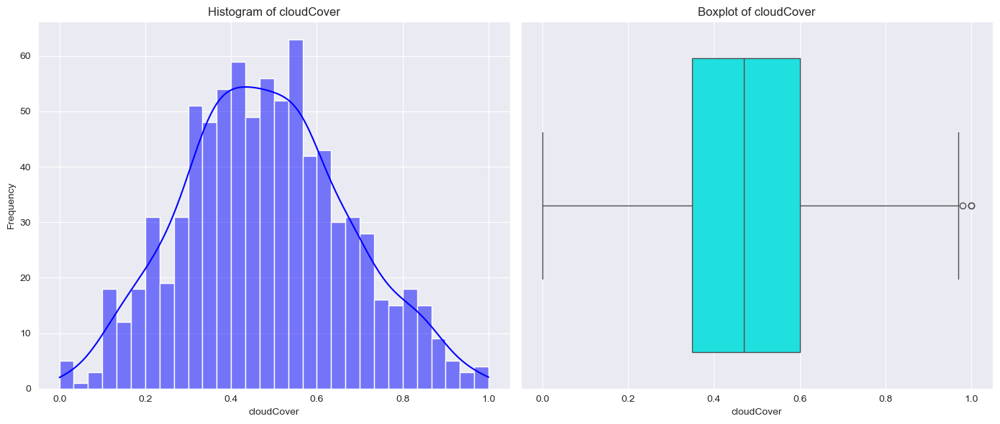

...

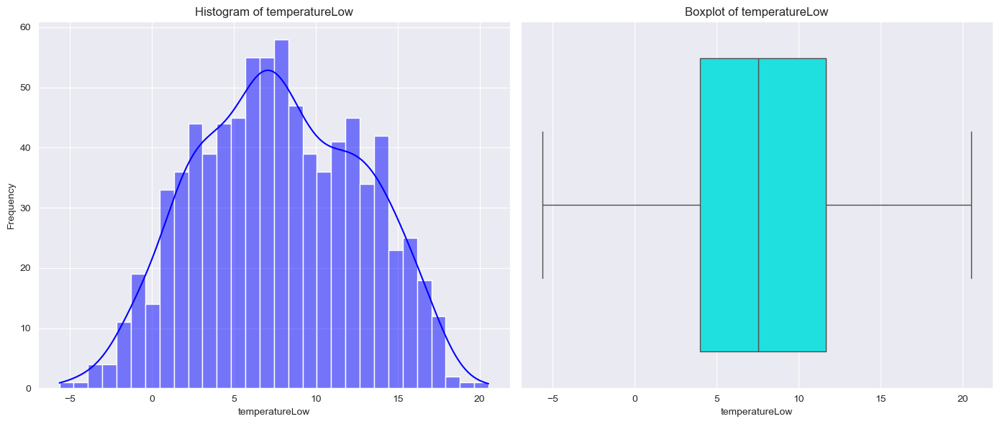

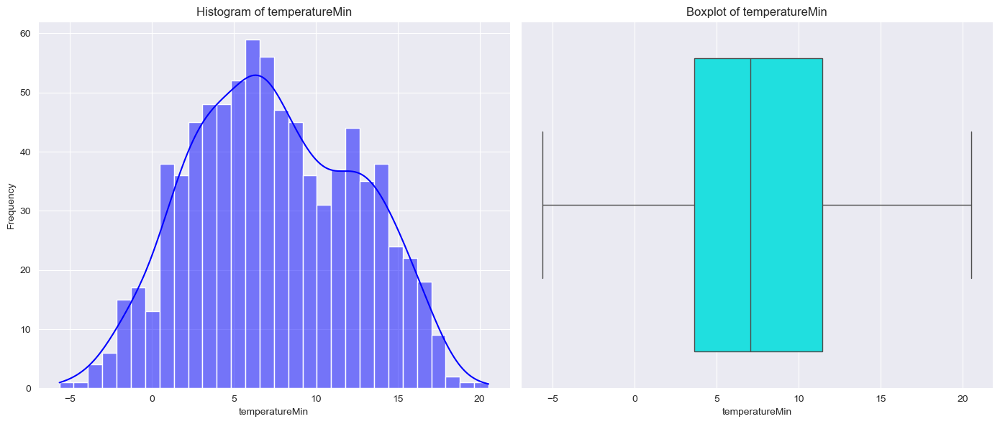

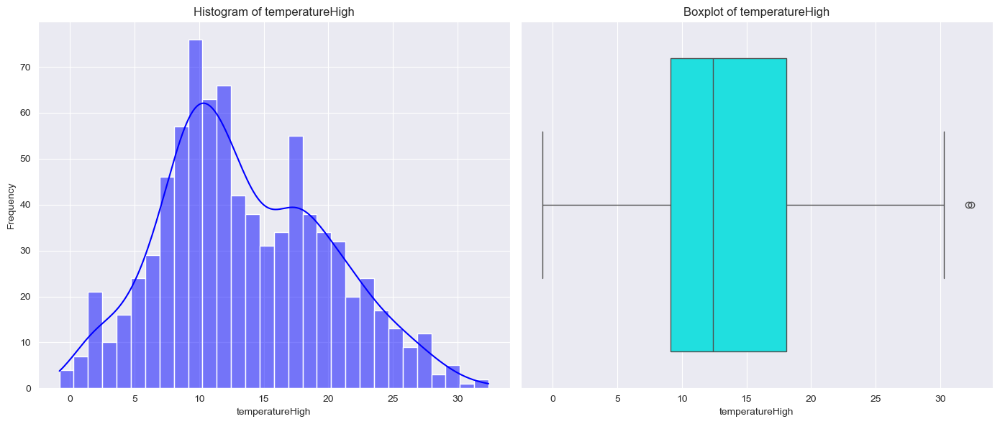

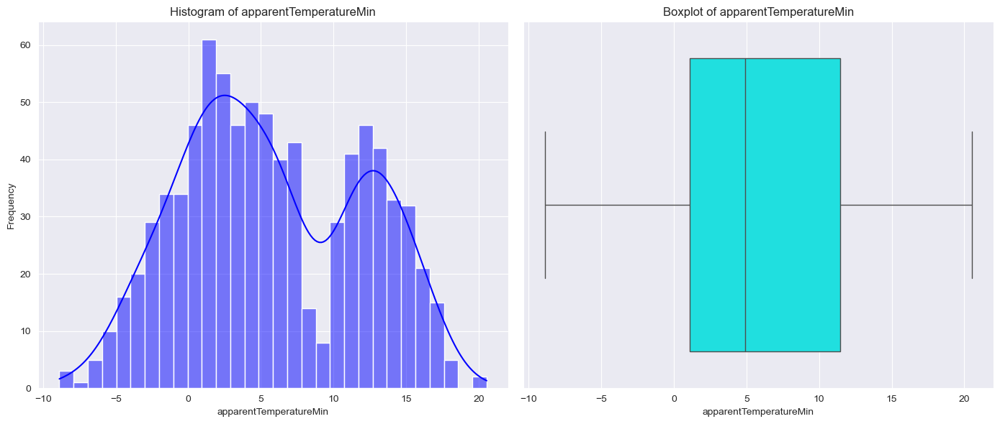

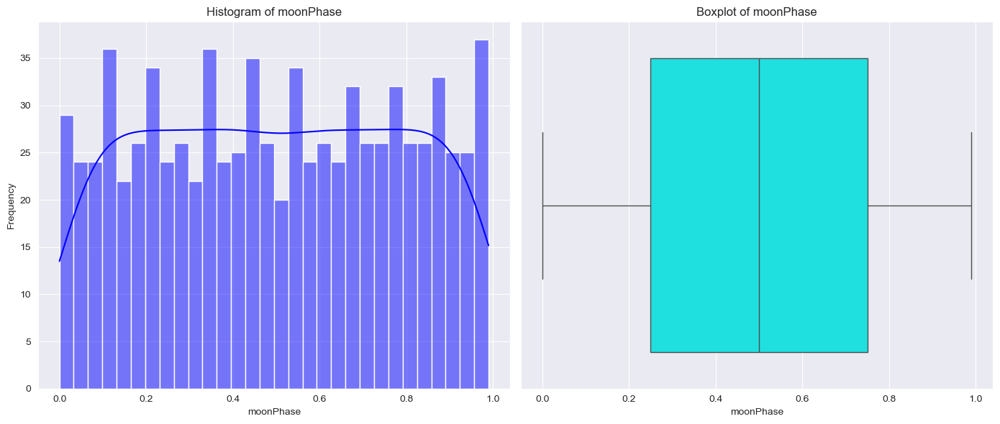

Visualizing categorical features...


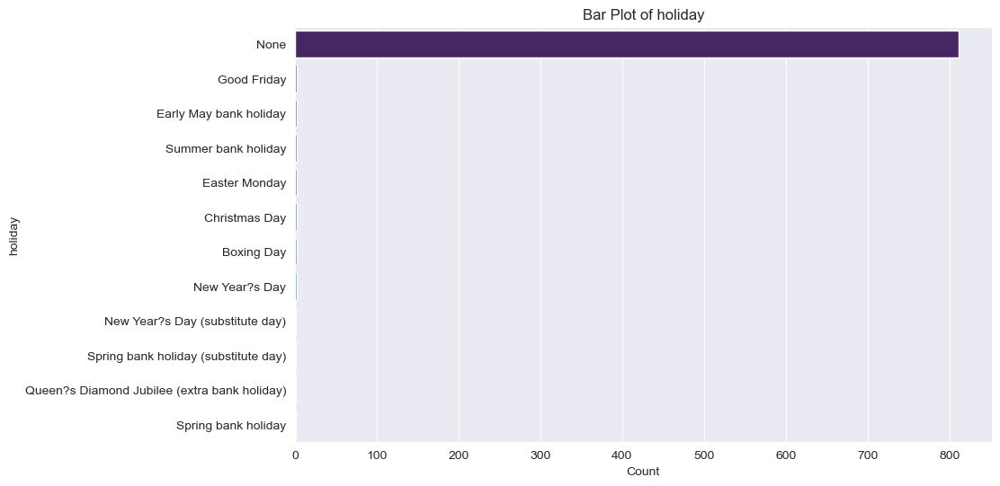

In [33]:

import matplotlib.pyplot as plt
import seaborn as sns

# Assuming merge_dataset is your DataFrame
# Replace with your actual dataset
data = merge_dataset_for_visualization

# Separate numerical and categorical columns
numerical_cols = data.select_dtypes(include=['float64', 'int64']).columns
categorical_cols = data.select_dtypes(include=['object', 'category']).columns

# Visualize numerical features
print("Visualizing numerical features...")
for col in numerical_cols:
    plt.figure(figsize=(14, 6))
    
    # Histogram
    plt.subplot(1, 2, 1)
    sns.histplot(data[col], kde=True, bins=30, color='blue')
    plt.title(f"Histogram of {col}")
    plt.xlabel(col)
    plt.ylabel('Frequency')
    
    # Boxplot
    plt.subplot(1, 2, 2)
    sns.boxplot(x=data[col], color='cyan')
    plt.title(f"Boxplot of {col}")
    plt.xlabel(col)
    
    plt.tight_layout()
    plt.show()

# Visualize categorical features
print("Visualizing categorical features...")
for col in categorical_cols:
    plt.figure(figsize=(10, 6))
    sns.countplot(y=data[col], palette='viridis', order=data[col].value_counts().index)
    plt.title(f"Bar Plot of {col}")
    plt.xlabel('Count')
    plt.ylabel(col)
    plt.show()


### Feature Importance  

Feature importance refers to how valuable each feature is in predicting the target variable.
Tree-based models (like the Random Forest Regressor) can easily provide feature importance by evaluating the reduction in impurity (entropy) or variance due to each feature during training. 


  Fold 1: R2 = 0.9932, RMSE = 1661.1436
  Fold 2: R2 = 0.9922, RMSE = 1827.1904
  Fold 3: R2 = 0.9823, RMSE = 2615.6117
  Fold 4: R2 = 0.9910, RMSE = 2080.7651
  Fold 5: R2 = 0.9904, RMSE = 1879.5858
  Fold 6: R2 = 0.9165, RMSE = 6040.5259
  Fold 7: R2 = 0.9816, RMSE = 2720.2198
  Fold 8: R2 = 0.9792, RMSE = 2224.8082
  Fold 9: R2 = 0.9941, RMSE = 1593.2973
  Fold 10: R2 = 0.9881, RMSE = 2318.7750
Average R2: 0.9809
Average RMSE: 2496.1923


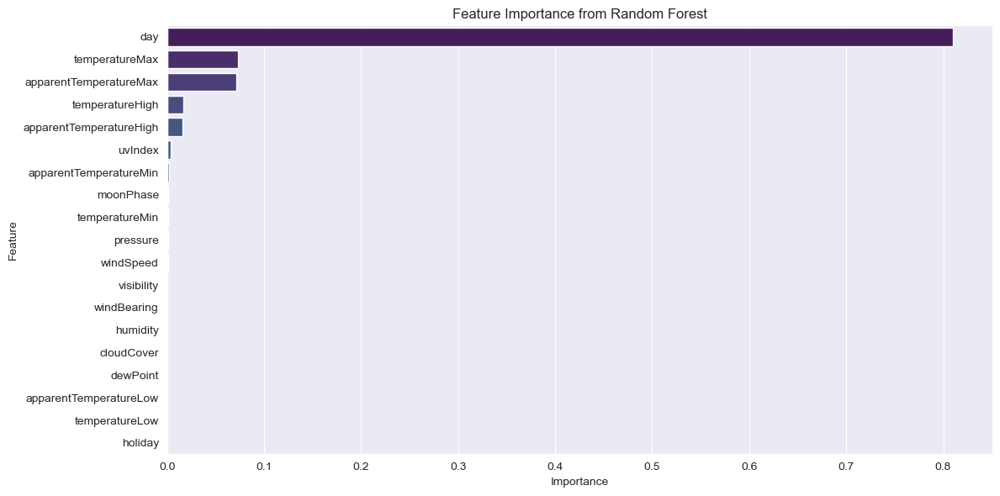

In [34]:
import warnings
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.metrics import r2_score, mean_squared_error
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Suppress warnings globally. to have clear output 
warnings.filterwarnings("ignore", category=UserWarning)  # Suppress sklearn warnings
warnings.filterwarnings("ignore", category=FutureWarning)  # Suppress pandas future warnings

# Define dataset (replace merge_dataset with your actual DataFrame)
X = merge_dataset.drop(['energy_sum'], axis=1)
y = merge_dataset['energy_sum']  # Ensure it's a Series for compatibility

# Initialize K-Fold
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)  # Convert to NumPy array after scaling

# Random Forest Regressor
model = RandomForestRegressor(n_estimators=100, n_jobs=-1, random_state=42)

r2_scores = []
rmse_scores = []
feature_importances = np.zeros(X.shape[1])

# K-Fold Cross-Validation
for fold, (train_index, test_index) in enumerate(kf.split(X_scaled)):
    # Use NumPy indexing
    X_train, X_test = X_scaled[train_index], X_scaled[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    
    # Train the model
    model.fit(X_train, y_train)
    
    # Predict on test set
    y_pred = model.predict(X_test)
    
    # Calculate metrics
    r2 = r2_score(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    
    r2_scores.append(r2)
    rmse_scores.append(rmse)
    
    # Accumulate feature importances
    feature_importances += model.feature_importances_
    
    print(f"  Fold {fold+1}: R2 = {r2:.4f}, RMSE = {rmse:.4f}")

# Average metrics across all folds
print(f"Average R2: {np.mean(r2_scores):.4f}")
print(f"Average RMSE: {np.mean(rmse_scores):.4f}")

# Average feature importances across all folds
feature_importances /= kf.n_splits

# Visualize feature importance
features = X.columns  # Original feature names
importance_df = pd.DataFrame({
    'Feature': features,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)

plt.figure(figsize=(12, 6))
sns.barplot(data=importance_df, x='Importance', y='Feature', palette='viridis')
plt.title('Feature Importance from Random Forest')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.tight_layout()
plt.show()


### Model Performance across feature

In this section, we evaluated the contribution of each feature individually to the overall performance of the model. The following figure shows the contribution of each feature in percentage with negative, if it decreases the performance, or positive if it increases it. 

Evaluating overall model performance...
Overall Average R2: 0.9809
Overall Average RMSE: 2496.1923

Evaluating model performance feature-by-feature...
Evaluating feature: day
Evaluating feature: temperatureMax
Evaluating feature: windBearing
Evaluating feature: dewPoint
Evaluating feature: cloudCover
Evaluating feature: windSpeed
Evaluating feature: pressure
Evaluating feature: apparentTemperatureHigh
Evaluating feature: visibility
Evaluating feature: humidity
Evaluating feature: apparentTemperatureLow
Evaluating feature: apparentTemperatureMax
Evaluating feature: uvIndex
Evaluating feature: temperatureLow
Evaluating feature: temperatureMin
Evaluating feature: temperatureHigh
Evaluating feature: apparentTemperatureMin
Evaluating feature: moonPhase
Evaluating feature: holiday

Feature Performance:
                    Feature  Average R2  Average RMSE
0                       day    0.983822   2268.216680
12                  uvIndex    0.035512  19668.022799
18                  holiday   

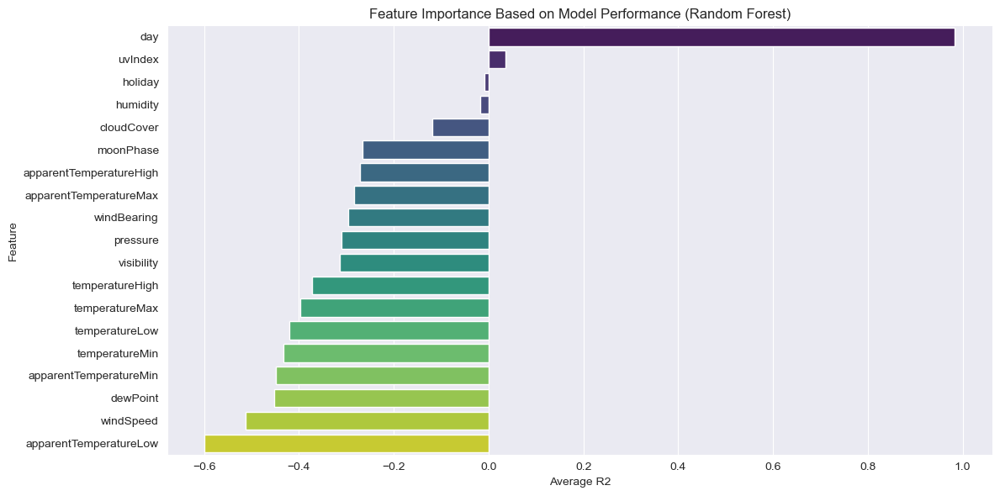

In [35]:
import warnings
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.metrics import r2_score, mean_squared_error
import numpy as np
import pandas as pd

# Suppress warnings globally
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

# Define dataset (replace merge_dataset with your actual DataFrame)
X = merge_dataset.drop(['energy_sum'], axis=1)
y = merge_dataset['energy_sum']

# Initialize K-Fold
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)  # Convert to NumPy array after scaling

# Initialize Random Forest Regressor
model = RandomForestRegressor(n_estimators=100, n_jobs=-1, random_state=42)

# Evaluate overall performance
print("Evaluating overall model performance...")
r2_scores = []
rmse_scores = []

for fold, (train_index, test_index) in enumerate(kf.split(X_scaled)):
    X_train, X_test = X_scaled[train_index], X_scaled[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    
    # Train and predict
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    # Calculate metrics
    r2_scores.append(r2_score(y_test, y_pred))
    rmse_scores.append(np.sqrt(mean_squared_error(y_test, y_pred)))

print(f"Overall Average R2: {np.mean(r2_scores):.4f}")
print(f"Overall Average RMSE: {np.mean(rmse_scores):.4f}\n")

# Evaluate performance across features
print("Evaluating model performance feature-by-feature...")
feature_performance = []

for i, feature_name in enumerate(X.columns):
    print(f"Evaluating feature: {feature_name}")
    
    # Use only the selected feature
    X_feature = X_scaled[:, i].reshape(-1, 1)
    r2_scores = []
    rmse_scores = []
    
    for fold, (train_index, test_index) in enumerate(kf.split(X_feature)):
        X_train, X_test = X_feature[train_index], X_feature[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        
        # Train and predict
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        
        # Calculate metrics
        r2_scores.append(r2_score(y_test, y_pred))
        rmse_scores.append(np.sqrt(mean_squared_error(y_test, y_pred)))

    # Store feature performance
    feature_performance.append({
        'Feature': feature_name,
        'Average R2': np.mean(r2_scores),
        'Average RMSE': np.mean(rmse_scores)
    })

# Convert to DataFrame for better visualization
performance_df = pd.DataFrame(feature_performance).sort_values(by='Average R2', ascending=False)

# Display results
print("\nFeature Performance:")
print(performance_df)

# Visualize results
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
sns.barplot(data=performance_df, x='Average R2', y='Feature', palette='viridis')
plt.title("Feature Importance Based on Model Performance (Random Forest)")
plt.xlabel("Average R2")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()
